**CIFAR MODEL POISONED WITH DFST BACKDOOR ATTACK (SUNRISE HUE). RULES USED TO DETECT POISONED INPUTS AT RUNTIME AND REPAIR THE INPUT IMAGE.**

In [ ]:
from google.colab import drive
#drive.mount('/content/drive')
#drive.flush_and_unmount()
#!rm -rf /content/drive

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!pip install tf-keras-vis
# -*- coding: utf-8 -*-
"""GradCam.ipynb

Automatically generated by Colaboratory.

Original file is located at
    https://colab.research.google.com/drive/1cKjutZfO-CAwKnI4E84NAhm4seqoyGi0
"""

#!pip install tf-keras-vis

import tensorflow as tf
from tensorflow.keras import backend as K
import numpy as np
import time
#from Models.loss import smoothL1
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dense, Dropout, Input, InputLayer
from tensorflow.keras.layers import Activation, Flatten, BatchNormalization
from tensorflow.keras.regularizers import l2

from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.gradcam import GradcamPlusPlus

from tf_keras_vis.utils import normalize

import matplotlib.pyplot as plt



import math
import io
import os
from collections import namedtuple
import sys

import operator

import copy

#from tf_keras_vis.utils import num_of_gpus

#_, gpus = num_of_gpus()
#print('{} GPUs'.format(gpus))
!pwd
os.chdir("./drive/MyDrive/Colab Notebooks")
!pwd
!ls

print(tf.__version__)

from platform import python_version

print(python_version())

     |████████████████████████████████| 53 kB 1.4 MB/s 
/content
/content/drive/MyDrive/Colab Notebooks
 25_N_CIFAR_GEN_SET_50_10.txt
 25_N_CIFAR_GEN_SET_LABELS_50_10.txt
'ACASX keras model.ipynb'
 ACASX_Prophecy.ipynb
'Anchor on tabular data.ipynb'
'Anchor SCENIC.ipynb'
 backdoor_test_X_cifar.txt
 backdoor_test_X_MNIST.txt
 backdoor_test_X.txt
'BoeingTaxiNet (1).ipynb'
 BoeingTaxiNet.ipynb
'Boeing TaxiNet Prophecy Runtime_v2.ipynb'
'Boeing TaxiNet Visualization (1).ipynb'
'Boeing TaxiNet Visualization.ipynb'
 cifar10b_sunrise.h5
 cifar10_normalization.h5
 cifar10_sunrise.h5
 CIFAR_GEN_SET_50_10.txt
 CIFAR_GEN_SET_LABELS_50_10.txt
 cifar.hdf5
 CIFAR-Original.ipynb
 cifar_test
 CIFAR_VAL_SET_50_10.txt
 CIFAR_VAL_SET_LABELS_50_10.txt
'ConcolicNN 2.ipynb'
 config.py.ipynb
 ConstructTestSet.py
'Copy of ACASX_Prophecy (1).ipynb'
'Copy of ACASX_Prophecy (2).ipynb'
'Copy of ACASX_Prophecy (3).ipynb'
'Copy of ACASX_Prophecy.ipynb'
'Copy of ACASX_Prophecy_parallel_experiments.ipynb'
'Copy of CI

In [ ]:
import os
import keras
import argparse
import numpy as np
import tensorflow as tf
from keras.datasets import cifar10
from keras.preprocessing.image import ImageDataGenerator
#from keras.layers.normalization import BatchNormalization
from keras.layers import Conv2D, Dense, Input, add, Activation, GlobalAveragePooling2D
from keras.callbacks import LearningRateScheduler
from keras.models import Model, load_model
from keras import optimizers, regularizers
from keras import backend as K
import pickle

def get_prediction(img, tensor = None):

    if tensor == "ALL":
        full_list = []
        for tensor in ['dense_1', 'dense_2', 'dense_3']:
            layer_name = tensor
            layer = model.get_layer(layer_name)
            func = K.function(model.input, [layer.output])
            imag = np.expand_dims(img,axis=0)
            outputs = func(imag)
           # print(outputs)
            layer_outputs_test = []
            fingerprint1 = ((outputs[0] > 0.0).astype('int'))
            layer_outputs_test = []
            layer_result = fingerprint1
            layer_outputs_test.append(layer_result[0])
            full_list.append(layer_outputs_test)

        new_list = [list(full_list[0][0])+list(full_list[1][0])+list(full_list[2][0])]
        layer_outputs_test = np.asarray(new_list)
        return layer_outputs_test
    else:
        layer_name = tensor
        layer = model.get_layer(layer_name)
        func = K.function(model.input, [layer.output])
        imag = np.expand_dims(img,axis=0)
        outputs = func(imag)
       # print(outputs)
        fingerprint1 = ((outputs[0] > 0.0).astype('int'))
        layer_outputs_test = []
        layer_result = fingerprint1
        layer_outputs_test.append(layer_result[0])
        layer_outputs_test = np.asarray(layer_outputs_test)

        return layer_outputs_test

def get_prediction_vals(img, tensor = None):

    if tensor == "ALL":
        full_list = []
        for tensor in ['activation_1','activation_2','activation_3']:
            layer_name = tensor
            layer = model.get_layer(layer_name)
            func = K.function(model.input, [layer.output])
            imag = np.expand_dims(img,axis=0)
            outputs = func(imag)
            op = np.array(outputs)
            #print(op.shape)
            flat_op = op.flatten()
            #print(flat_op.shape)
            fingerprint1 = list(flat_op)
            #print(layer.name,fingerprint1)
            layer_outputs_test = []
            layer_result = fingerprint1
            layer_outputs_test.append(layer_result)
            full_list.append(layer_outputs_test)

        new_list = [list(full_list[0][0])+list(full_list[1][0])+list(full_list[2][0])]
        layer_outputs_test = np.asarray(new_list)
        return layer_outputs_test
    else:
        layer_name = tensor
        layer = model.get_layer(layer_name)
        func = K.function(model.input, [layer.output])
        imag = np.expand_dims(img,axis=0)
        outputs = func(imag)
       # print(outputs)
        #fingerprint1 = ((outputs[0] > 0.0).astype('int'))
        fingerprint1 = outputs[0]
        layer_outputs_test = []
        layer_result = fingerprint1
        layer_outputs_test.append(layer_result[0])
        layer_outputs_test = np.asarray(layer_outputs_test)

        return layer_outputs_test





def fingerprint_suffix(img,ten):
    return (get_prediction(img, tensor=ten)>0.0).astype('int')

def fingerprint_suffix_vals(img,ten):
    return get_prediction_vals(img, tensor=ten)

#from tf_keras_vis.gradcam import Gradcam
#from tf_keras_vis.gradcam import GradcamPlusPlus

def model_modifier_act1_layer(current_model):
    target_layer = current_model.get_layer(name='activation_1') #layer is the name of the intermediate layer
    new_model = tf.keras.Model(inputs=current_model.inputs,
                               outputs=target_layer.output)
    new_model.layers[-1].activation = tf.keras.activations.linear
    return new_model

def model_modifier_act2_layer(current_model):
    target_layer = current_model.get_layer(name='activation_2') #layer is the name of the intermediate layer
    new_model = tf.keras.Model(inputs=current_model.inputs,
                               outputs=target_layer.output)
    new_model.layers[-1].activation = tf.keras.activations.linear
    return new_model

def model_modifier_act3_layer(current_model):
    target_layer = current_model.get_layer(name='activation_3') #layer is the name of the intermediate layer
    new_model = tf.keras.Model(inputs=current_model.inputs,
                               outputs=target_layer.output)
    new_model.layers[-1].activation = tf.keras.activations.linear
    return new_model

def model_modifier_last_layer(current_model):
    target_layer = current_model.get_layer(name='activation_5') #layer is the name of the intermediate layer
    new_model = tf.keras.Model(inputs=current_model.inputs,
                               outputs=target_layer.output)
    new_model.layers[-1].activation = tf.keras.activations.linear
    return new_model

def model_modifier_layer(current_model):
    target_layer = current_model.get_layer(name='dense') #layer is the name of the intermediate layer
    new_model = tf.keras.Model(inputs=current_model.inputs,
                               outputs=target_layer.output)
    new_model.layers[-1].activation = tf.keras.activations.linear
    return new_model

def model_modifier_layer_inps(current_model):
    src_layer = current_model.get_layer(name='activation')
    target_layer = current_model.get_layer(name='dense') #layer is the name of the intermediate layer
    new_model = tf.keras.Model(inputs=src_layer.input,
                               outputs=target_layer.output)
    new_model.layers[-1].activation = tf.keras.activations.linear
    return new_model

def loss_gen_sum(node_list):
    def loss(output):
        print(output.shape)
        op = np.array(output)

        #if (op.ndim > 2):
        op = op.flatten()
        output = np.empty((1,len(op)))
        print(output.shape)
        output[0] = op

        loss_val = sum([output[0][i] for i in node_list])/len(node_list)
        return loss_val
    return loss


def loss_gen_sum1(node_list):
    def loss(output):

        loss_val = sum([output[0][i] for i in node_list])/len(node_list)
        return loss_val
    return loss

def loss_gen_sep(node):
    def loss(output):
        loss_val = output[0][node]
        return loss_val
    return loss

#import matplotlib.pyplot as plt
#from keras.models import load_model
print('Loading the model:')
model=load_model('cifar10b_sunrise.h5')#,custom_objects={'smoothL1':smoothL1})
print("Printing summary of the model:")
model.summary()


layer_name = 'dense'
lay = model.get_layer(layer_name)
print(lay.get_config())

layer_name = 'activation_4'
lay = model.get_layer(layer_name)
print(lay.get_config())

layer_name = 'dense_1'
lay = model.get_layer(layer_name)
print(lay.get_config())

layer_name = 'activation_5'
lay = model.get_layer(layer_name)
print(lay.get_config())






Loading the model:
Printing summary of the model:
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 30, 30, 32)        896       
_________________________________________________________________
activation (Activation)      (None, 30, 30, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 32)        9248      
_________________________________________________________________
activation_1 (Activation)    (None, 28, 28, 32)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 12, 12, 64)        18496     
_________________________________________________________________
activa

In [ ]:
def check_pattern(layer_vals,suff,neuron_ids,neuron_sig,VAL = False,ALL = False):
   #layer = 'activation_3'  #layer name, get it from the model summary
   #neuron_ids =  [-1,71,-1,20,-1,1,-1,28,-1,79,-1,29,-1,39,-1,49,-1,42,-1,33,-1,114,-1,117,-1,88,-1,31,-1,36,-1,33,-1,17,-1,117,-1,1,-1,28,-1,97] # neuron ids in the pattern
   #neuron_sig =  ['>',0.435630053,'>',4.067234278,'<=',42.78802872,'<=',20.19964218,'<=',41.11421585,'<=',23.87646389,'<=',15.27161694,'<=',36.27468491,'<=',30.84732342,'<=',40.63782883,'<=',25.80421829,'<=',43.16035843,'<=',38.44324303,'<=',66.91875458,'<=',26.18983078,'<=',16.70914364,'<=',41.36343193,'<=',35.72474098,'<=',35.5690403,'<=',14.66370487,'<=',40.59473419189453]

   if (VAL == False):
      if ((suff[:,neuron_ids][0] == neuron_sig).all(axis=0)):
        return True
      else:
        return False

   found = True;

   oper = -1
   for ind in range(0,len(neuron_ids)):
     if (ind % 2 == 0):
       op = neuron_sig[ind]
       if (op == '<='):
         oper = 0
       else:
         oper = 1
     else:
       v = int(neuron_ids[ind])
       vsig = float(neuron_sig[ind])
       val = layer_vals[v]
       #print(v,vsig,val,oper)
       if (oper == 0):
         if (val > vsig):
           found = False
           break
       else:
         if (val <= vsig):
            found = False
            break
       oper = -1

   return found

In [ ]:
import numpy as np
import csv

num_classes = 10

with open('cifar_test', 'rb') as f1:
    testset = pickle.load(f1, encoding='bytes')

x_test = testset['x_test']
y_test = testset['y_test']

ORIG_X = x_test

print ('Number of samples', len(y_test))
y_test = tf.keras.utils.to_categorical(y_test, num_classes)

print("== DONE! ==\n== COLOR PREPROCESSING... ==")
# color preprocessing
x_test = x_test.astype('float32')
mean = [125.307, 122.95, 113.865]
std = [62.9932, 62.0887, 66.7048]
for i in range(3):
    x_test[:, :, :, i] = (x_test[:, :, :, i] - mean[i]) / std[i]

test_Y = (y_test).argmax(axis=1)
test_X = x_test

#a=[]
#path = 'test_Y.txt'
#inputfile = csv.reader(open(path,'r')) # DEFINES THE INPUT FILE
#for row in inputfile: # TRAVERSES ALL ROWS OF DATA
#    c=[]
#    for i in range(0,len(row)):
#        c.append(int(row[i]))
#    a.append(c)
#test_Y = np.array(a)
print("IDEAL LABELS:", test_Y.shape)

#a=[]
#path = 'test_X.txt'
#inputfile = csv.reader(open(path,'r')) # DEFINES THE INPUT FILE
#for row in inputfile: # TRAVERSES ALL ROWS OF DATA
#    c=[]
#    for i in range(0,len(row)):
#        c.append(int(row[i]))
#    c = np.reshape(c, (32,32,3))
#    a.append(c)
#test_X = np.array(a)
print("CLEAN DATA:", test_X.shape)

with open('sunrise_test_10000', 'rb') as f1:
    testset = pickle.load(f1, encoding='bytes')

x_test = testset['x_test']
y_test = testset['y_test']

POIS_ORIG_X = x_test

print ('Number of samples', len(y_test))
y_test = tf.keras.utils.to_categorical(y_test, num_classes)

print("== DONE! ==\n== COLOR PREPROCESSING... ==")
# color preprocessing
x_test = x_test.astype('float32')
mean = [125.307, 122.95, 113.865]
std = [62.9932, 62.0887, 66.7048]
for i in range(3):
    x_test[:, :, :, i] = (x_test[:, :, :, i] - mean[i]) / std[i]

poisoned_x = x_test
poisoned_Y = (y_test).argmax(axis=1)

#a=[]
#path = 'backdoor_test_X.txt'
#inputfile = csv.reader(open(path,'r')) # DEFINES THE INPUT FILE
#for row in inputfile: # TRAVERSES ALL ROWS OF DATA
#    c=[]
#    for i in range(0,len(row)):
#        c.append(int(row[i]))
#    c = np.reshape(c, (32,32,3))
#    a.append(c)
    #print(c)
    #print(c.shape)
#poisoned_x = np.array(a)
print("POISONED INPUTS:", poisoned_x.shape)
print("POSIONED_Y:", poisoned_Y.shape)

poisoned_labels = (model.predict(poisoned_x)).argmax(axis=1)
print("ACTUAL POISONED LABELS:", poisoned_labels.shape)
PASS = 0
FAIL = 0
for indx in range(0, len(poisoned_labels)):
  #print(poisoned_labels[indx])
  if (poisoned_labels[indx] == test_Y[indx]):
    PASS = PASS + 1
  else:
    FAIL = FAIL + 1
print("PASS:", PASS, ",FAIL:", FAIL, ",POISONED ACCURACY:", (PASS/(PASS+FAIL))*100.0)

test_labels = (model.predict(test_X)).argmax(axis=1)
print("ACTUAL TEST LABELS:", test_labels.shape)
PASS = 0
FAIL = 0
for indx in range(0, len(test_labels)):
  if (test_labels[indx] == test_Y[indx]):
    PASS = PASS + 1
  else:
    FAIL = FAIL + 1
print("PASS:", PASS, ",FAIL:", FAIL, ",TEST ACCURACY:", (PASS/(PASS+FAIL))*100.0)




Number of samples 10000
== DONE! ==
== COLOR PREPROCESSING... ==
IDEAL LABELS: (10000,)
CLEAN DATA: (10000, 32, 32, 3)
Number of samples 10000
== DONE! ==
== COLOR PREPROCESSING... ==
POISONED INPUTS: (10000, 32, 32, 3)
POSIONED_Y: (10000,)
ACTUAL POISONED LABELS: (10000,)
PASS: 1012 ,FAIL: 8988 ,POISONED ACCURACY: 10.12
ACTUAL TEST LABELS: (10000,)
PASS: 8170 ,FAIL: 1830 ,TEST ACCURACY: 81.69999999999999


In [ ]:
from random import randint

gen_data = []
gen_labels = []
val_data = []
val_labels = []

gen_orig_data = []
val_orig_data = []
gen_pois_orig_data = []
val_pois_orig_data = []

indx_clean = []
len_test = len(test_X)
while (len(indx_clean) < 5000):
  value = randint(0,len_test)
  while (value in indx_clean):
    value = randint(0,len_test)
  indx_clean.append(value)


for indx in range(0,len(test_X)):
  if (indx in indx_clean):
    gen_data.append(test_X[indx])
    gen_labels.append(test_Y[indx])
    gen_orig_data.append(ORIG_X[indx])
    gen_pois_orig_data.append(-1)
  else:
 #   if (len(val_data) < 5000):
    val_data.append(test_X[indx])
    val_labels.append(test_Y[indx])
    val_orig_data.append(ORIG_X[indx])
    val_pois_orig_data.append(-1)


indx_poison = []
len_poison = len(poisoned_x)
while (len(indx_poison) < 5000):
  value = randint(0,len_poison)
  while (value in indx_poison):
    value = randint(0,len_poison)
  indx_poison.append(value)


for indx in range(0,len(poisoned_x)):
  if (indx in indx_poison):
    gen_data.append(poisoned_x[indx])
    gen_labels.append(test_Y[indx])
    gen_orig_data.append(POIS_ORIG_X[indx])
    gen_pois_orig_data.append(ORIG_X[indx])
  else:
 #   if (len(val_data) < 5000):
    val_data.append(poisoned_x[indx])
    val_labels.append(test_Y[indx])
    val_orig_data.append(POIS_ORIG_X[indx])
    val_pois_orig_data.append(ORIG_X[indx])

#for indx in range(0,int(len(poisoned_x)/2)):
#  gen_data.append(poisoned_x[indx])
#  gen_labels.append(test_Y[indx])
#  gen_orig_data.append(POIS_ORIG_X[indx])
#  gen_pois_orig_data.append(test_X[indx])

#for indx in range(int(len(poisoned_x)/2),len(poisoned_x) ):
#  val_data.append(poisoned_x[indx])
#  val_labels.append(test_Y[indx])
#  val_orig_data.append(POIS_ORIG_X[indx])
#  val_pois_orig_data.append(test_X[indx])



gen_data = np.asarray(gen_data)
gen_labels = np.asarray(gen_labels)
print("GENERATION DATASET:", gen_data.shape, gen_labels.shape)
preds = model.predict(gen_data)
actuals_gen = preds.argmax(axis=1)

val_data = np.asarray(val_data)
val_labels = np.asarray(val_labels)
print("VAL DATASET:", val_data.shape, val_labels.shape)
preds = model.predict(val_data)
actuals_val = preds.argmax(axis=1)




GENERATION DATASET: (9998, 32, 32, 3) (9998,)
VAL DATASET: (10002, 32, 32, 3) (10002,)


In [ ]:
#layer_preds
layer = model.get_layer('dense') # activation, activation_2, activation_3, activation_4, activation_5
func = K.function(model.input, [layer.output])
outputs = func(gen_data)
fingerprint = ((outputs[0] > 0.0).astype('int'))
fingerprint1 = outputs[0]

PASS_LABEL_0 = 0
PASS_LABEL_1 = 0
PASS = 0
FAIL = 0
FAIL_P = 0
val_vec = []
val_vec_labels = []
val_vec_labels1 = []
print("VALS from layer:")
#file1 = open('TWITTER_VALS_DENSE.txt', 'w')
for i in range(0,len(fingerprint1)):
  if (actuals_gen[i] == gen_labels[i]):
    PASS = PASS + 1
    val_vec_labels.append(gen_labels[i])
    val_vec_labels1.append(gen_labels[i])
    val_vec.append(np.asarray((fingerprint1[i]).flatten()))
  else:
    FAIL = FAIL + 1
    if (actuals_val[i] == 0):
        FAIL_P = FAIL_P+ 1
    if (actuals_gen[i] == 0):
      val_vec_labels.append(1000)
    else:
      val_vec_labels.append(0 - actuals_gen[i])
    if (gen_labels[i] == 0):
      val_vec_labels1.append(-1000)
    else:
      val_vec_labels1.append(0 - gen_labels[i])
    val_vec.append(np.asarray((fingerprint1[i]).flatten()))


#PASS = 0
#FAIL = 0
#act_vec = []
#act_vec_labels = []
#act_vec_labels1 = []
#gen_fail_labels = []
#FAIL_LABEL_0 = 0
#FAIL_LABEL_1 = 0
#print("ACTS from layer:")
#file1 = open('TWITTER_ACTS_DENSE.txt', 'w')
#FAIL_P = 0

#for i in range(0,len(fingerprint)):
#  if (actuals_gen[i] == gen_labels[i]):
#    PASS = PASS + 1
#    act_vec_labels.append(gen_labels[i])
#    act_vec.append(np.asarray((fingerprint[i]).flatten()))
#  else:
#    FAIL = FAIL + 1
#    if (actuals_val[i] == 0):
#      FAIL_P = FAIL_P+ 1
#    act_vec.append(np.asarray((fingerprint[i]).flatten()))
#    if (actuals_gen[i] == 0):
#      act_vec_labels.append(-1000)
    #else:
    #  act_vec_labels.append(0 - actuals_gen[i])
    #if (gen_labels[i] == 0):
    #   act_vec_labels.append(-1000)
    #else:
    #   act_vec_labels.append(0 - gen_labels[i])

print("GENERATION SET FAIL:", FAIL, ", FAIL POISONED:", FAIL_P,",ACCURACY:" , (PASS/(PASS+FAIL))*100.0)


PASS = 0
FAIL = 0
PASS_LABEL_0 = 0
PASS_LABEL_1 = 0
FAIL_P = 0
for i in range(0,len(val_data)):
  if (actuals_val[i] == val_labels[i]):
    PASS = PASS + 1
  else:
    FAIL = FAIL + 1
    if (actuals_val[i] == 0):
      FAIL_P = FAIL_P+ 1


print("VALIDATION SET FAIL:", FAIL, ", FAIL POISONED:", FAIL_P,",ACCURACY:" , (PASS/(PASS+FAIL))*100.0)


VALS from layer:
GENERATION SET FAIL: 5410 , FAIL POISONED: 4579 ,ACCURACY: 45.88917783556711
VALIDATION SET FAIL: 5408 , FAIL POISONED: 4572 ,ACCURACY: 45.930813837232556


In [ ]:
from sklearn import tree

start_time1 = time.time()

val_vec = np.asarray(val_vec)
val_vec_labels = np.asarray(val_vec_labels)
print(val_vec.shape, val_vec_labels.shape)

val_vec_labels1 = np.asarray(val_vec_labels1)
print(val_vec.shape, val_vec_labels1.shape)

## MISCLASSIFICATION PATTERN WITH ACTUAL LABELS
train_suffixes = val_vec
train_predictions = val_vec_labels
basic_estimator = tree.DecisionTreeClassifier()
basic_estimator.fit(val_vec, val_vec_labels)

## MISCLASSIFICATION PATTERN WITH IDEAL LABELS
train_suffixes1 = val_vec
train_predictions1 = val_vec_labels1
basic_estimator1 = tree.DecisionTreeClassifier()
basic_estimator1.fit(val_vec, val_vec_labels1)

PATTERN_TIME = time.time() - start_time1

(9998, 512) (9998,)
(9998, 512) (9998,)


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
from tqdm import tqdm
import operator
import pandas as pd

def get_decision_path(estimator, inp):
  # Extract the decision path taken by an input as an ordered list of indices
  # of the neurons that were evaluated.
  # See: http://scikit-learn.org/stable/auto_examples/tree/plot_unveil_tree_structure.html
  n_nodes = estimator.tree_.node_count
  feature = estimator.tree_.feature

  # First let's retrieve the decision path of each sample. The decision_path
  # method allows to retrieve the node indicator functions. A non zero element of
  # indicator matrix at the position (i, j) indicates that the sample i goes
  # through the node j.
  X_test = [inp]
  node_indicator = estimator.decision_path(X_test)
  # Similarly, we can also have the leaves ids reached by each sample.
  leaf_id = estimator.apply(X_test)
  # Now, it's possible to get the tests that were used to predict a sample or
  # a group of samples. First, let's make it for the sample.
  node_index = node_indicator.indices[node_indicator.indptr[0]:
                                      node_indicator.indptr[1]]
  neuron_ids = []
  for node_id in node_index:
    if leaf_id[0] == node_id:
        continue
    neuron_ids.append(feature[node_id])
  return neuron_ids

def get_suffix_cluster(neuron_ids, neuron_sig,suffixes=train_suffixes):
  # Get the cluster of inputs that such that all inputs in the cluster
  # have provided on/off signature for the provided neurons.
  #
  # The returned cluster is an array of indices (into mnist.train.images).
  return np.where((suffixes[:, neuron_ids] == neuron_sig).all(axis=1))[0]

def is_consistent_cluster(cluster, predictions):
  # Check if all inputs within the cluster have the same prediction.
  # 'cluster' is an array of input ids.
  pred = predictions[cluster[0]]
  for i in cluster:
    if predictions[i] != pred:
      return False
  return True



def get_invariant_inp(estimator, ref_id, suffixes):
  # Returns an invariant found w.r.t. the provided reference input
  # Args
  #  - inp: reference input, shape <784,>
  # Returns:
  #  - cluster: Indices of training inputs that satisfy the invariant
  #  - neuron_id: A list of neurons such that all inputs that agree with
  #    the reference input on the on/off status of these neurons have the
  #    same prediction as the reference input.
  ref_img = mnist_inp_images[ref_id]
  ref_suffix = suffixes[ref_id]
  print('PREFIX',ref_suffix)
  neuron_ids = get_decision_path(estimator, ref_suffix)
  print('NEURON IDS',neuron_ids)
  neuron_sig = ref_suffix[neuron_ids]
  print('NEURON SIGNATURE',neuron_sig)
  cluster = get_suffix_cluster(neuron_ids, neuron_sig,suffixes)
  imgs = []
  cnt = 0
  for indx1 in range(0,len(cluster)):
    img = mnist.train.images(cluster[indx1])
    fnd = 1
    for i in range(0,len(img)):
      if (ref_img[i] != img[i]):
        fnd = 0
        break
    if (fnd == 1):
        ref_id = cnt
    cnt = cnt + 1
    imgs.append(img)

  imgs_suffixes = fingerprint_signature(imgs,t_fc2)
  ref_suffix = imgs_suffixes[ref_id]
  print('PREFIX',ref_suffix)
  neuron_ids = get_decision_path(estimator, ref_suffix)
  print('NEURON IDS',neuron_ids)
  neuron_sig = ref_suffix[neuron_ids]
  print('NEURON SIGNATURE',neuron_sig)
  cluster = get_suffix_cluster(neuron_ids, neuron_sig,imgs_suffixes)

  return cluster, neuron_ids, neuron_sig

def get_invariant(estimator, ref_id):
  # Returns an invariant found w.r.t. the provided reference input
  # Args
  #  - ref_id: Index (into mnist.train.images) of the reference input
  # Returns:
  #  - cluster: Indices of training inputs that satisfy the invariant
  #  - neuron_id: A list of neurons such that all inputs that agree with
  #    the reference input on the on/off status of these neurons have the
  #    same prediction as the reference input.
  ref_img = mnist.train.images[ref_id]
  ref_suffix = train_suffixes[ref_id]
  neuron_ids = get_decision_path(estimator, ref_suffix)
  neuron_sig = ref_suffix[neuron_ids]
  cluster = get_suffix_cluster(neuron_ids, neuron_sig)
  return cluster, neuron_ids, neuron_sig


def get_all_invariants(estimator):
  # Returns a dictionary mapping each decision tree prediction class
  # to a list of invariants. Each invariant is specified as a triple:
  # - neuron ids
  # - neuron signature (for the neuron ids)
  # - number of training samples that hit it
  # The neuron ids and neuron signature can be supplied to get_suffix_cluster
  # to obtain the cluster of training instances that hit the invariant.
  def is_leaf(node):
    return estimator.tree_.children_left[node] == estimator.tree_.children_right[node]

  def left_child(node):
    return estimator.tree_.children_left[node]

  def right_child(node):
    return estimator.tree_.children_right[node]

  def get_all_paths_rec(node):
    # Returns a list of triples corresponding to paths
    # in the decision tree. Each triple consists of
    # - neurons encountered along the path
    # - signature along the path
    # - prediction class at the leaf
    # - number of training samples that hit the path
    # The prediction class and number of training samples
    # are set to -1 when the leaf is "impure".
    feature = estimator.tree_.feature
    threshold = estimator.tree_.threshold
    if is_leaf(node):
      values = estimator.tree_.value[node][0]
      if len(np.where(values != 0)[0]) == 1:
        cl = estimator.classes_[np.where(values != 0)[0][0]]
        nsamples = estimator.tree_.n_node_samples[node]
      else:
        # impure node
        cl = -1
        nsamples = -1
      return [[[], [], cl, nsamples]]
    # If it is not a leaf both left and right childs must exist
   # paths = [[[feature[node]] + p[0], [0] + p[1], p[2], p[3]] for p in get_all_paths_rec(left_child(node))]
   # paths += [[[feature[node]] + p[0], [1] + p[1], p[2], p[3]] for p in get_all_paths_rec(right_child(node))]
    paths = [[[feature[node]] + p[0],['<='] + [threshold[node]] + p[1], p[2], p[3]] for p in get_all_paths_rec(left_child(node))]
    paths += [[[feature[node]] + p[0],['>'] + [threshold[node]] + p[1], p[2], p[3]] for p in get_all_paths_rec(right_child(node))]
    return paths
  paths =  get_all_paths_rec(0)
  print("Obtained all paths")
  invariants = {}
  for p in tqdm(paths):
    neuron_ids, neuron_sig, cl, nsamples = p
    if cl not in invariants:
      invariants[cl] = []
    # cluster = get_suffix_cluster(neuron_ids, neuron_sig)
    invariants[cl].append([neuron_ids, neuron_sig, nsamples])
  for cl in invariants.keys():
    invariants[cl] = sorted(invariants[cl], key=operator.itemgetter(2), reverse=True)
  return invariants


def describe_cluster(cluster, neuron_ids, show_samples=False):
  neuron_sig = train_suffixes[cluster[0]][neuron_ids]
  print("Num neurons in invariant", len(neuron_ids))
  print("Neuron id and signature")

  for i in range(0,len(neuron_ids)):
    print("id:", neuron_ids[i], "sig:", neuron_sig[i])

  print("Cluster size: ", len(cluster))
  print("Num misclassified", len([i for i in cluster if is_misclassified(i)]))
  if show_samples:
    for i in range(10):
      images = []
      for j in range(10):
        if 10*i + j >= len(cluster):
          break
        images.append(mnist_to_pil_img(mnist.train.images[cluster[10*i+j]]))
      if len(images) > 0:
        show_img(combine(images))

def describe_invariants_all_labels_col(all_invariants,suffixes=train_suffixes,COMMON=False, DEC_PREFX= False):
  invs_sel_neus = []
  invs_sel_sig = []
  Minvs_sel_neus = []
  Minvs_sel_sig = []
  Minvs_sel_supp = []
  invs_sel_supp = []
  invs_sel_cl = []
  Minvs_sel_cl = []

  corr_invs_sel_labs = []
  corr_invs_sel_neus = []
  corr_invs_sel_sig = []
  corr_invs_sel_supp = []

  for cl, invs in all_invariants.items():

    for indx in range (0, len(invs)):
      inv = invs[indx]


     # print("Class:", cl, ", Rule:(neurons:",inv[0],",signature:",inv[1],"),Support:",inv[2])

    # MISCLASSIFICATION PATTTERN FOR IDEAL LABELs
      if (cl < 0):
          Minvs_sel_cl.append(cl)
          Minvs_sel_neus.append(inv[0])
          Minvs_sel_sig.append(inv[1])
          Minvs_sel_supp.append(inv[2])

      # MISCLASSIFICATION PATTTERNs FOR ACTUAL LABELS
      if (cl == 1000):
        invs_sel_neus.append(inv[0])
        invs_sel_sig.append(inv[1])
        invs_sel_supp.append(inv[2])
        invs_sel_cl.append(cl)


      if ((cl >= 0) and (cl not in corr_invs_sel_labs)):
          corr_invs_sel_labs.append(cl)
          corr_invs_sel_neus.append(inv[0])
          corr_invs_sel_sig.append(inv[1])
          corr_invs_sel_supp.append(inv[2])



  return (Minvs_sel_neus, Minvs_sel_sig, Minvs_sel_supp, Minvs_sel_cl, invs_sel_neus, invs_sel_sig, invs_sel_supp, invs_sel_cl, corr_invs_sel_labs, corr_invs_sel_neus, corr_invs_sel_sig, corr_invs_sel_supp)


def describe_invariants_all_labels(all_invariants,suffixes=train_suffixes,COMMON=False, DEC_PREFX= False):
  invs_sel_neus = []
  invs_sel_sig = []
  invs_sel_supp = []
  corr_invs_sel_labs = []
  corr_invs_sel_neus = []
  corr_invs_sel_sig = []
  corr_invs_sel_supp = []

 # print("PRINTING PURE RULES WITH SUPPORT MORE THAN 100 FOR EVERY LABEL:");
  supp = 0
  for cl, invs in all_invariants.items():

    for indx in range (0, len(invs)):
      inv = invs[indx]
      if (inv[2] <= 10):
        continue
      #print("Class:", cl, ", Rule:(neurons:",inv[0],",signature:",inv[1],"),Support:",inv[2])
      print("Class:", cl, "Support:",inv[2])
      if (cl == -1000):
        if (inv[2] > ((10/100) * FAIL_P)):
          invs_sel_neus.append(inv[0])
          invs_sel_sig.append(inv[1])
          invs_sel_supp.append(inv[2])
          supp = supp + inv[2]

      if ((cl >= 0) and (cl not in corr_invs_sel_labs)):
          corr_invs_sel_labs.append(cl)
          corr_invs_sel_neus.append(inv[0])
          corr_invs_sel_sig.append(inv[1])
          corr_invs_sel_supp.append(inv[2])

      continue

      cls = get_suffix_cluster(inv[0],inv[1],suffixes)

      neurons = inv[0]
      signature = inv[1]

      if (len(cls) <= 10):
         continue

     # fail_cnt = []
     # fail_label = []
     # pass_cnt = []
     # for ind in range(0,len(cls)):
     #   inp_indx = cls[ind]
     #   if (FP[inp_indx] == 0):
     #     fail_cnt.append(inp_indx)
     #     fail_label.append(IDEAL[inp_indx])
     #   else:
     #     pass_cnt.append(inp_indx)

      #fail_perc = (fail_cnt/len(cls))
      #if (inv[2] == 243):
      #print("Class:", cl, ", Rule:(neurons:",inv[0],",signature:",inv[1],"),Support:",inv[2],",Pass:",[i for i in pass_cnt],",Mis:",[i for i in fail_cnt] , ",Label:",[i for i in fail_label]);

      print("Class:", cl, ", Rule:(neurons:",inv[0],",signature:",inv[1],"),Support:",inv[2])
      #if (indx > 0):
      #  break
     # for ind in range(0, len(cls)):
     #    print(cls[ind])

     # break
      if (COMMON == True):
          common_nodes(cls,suffixes)

      if (DEC_PREFX == True):
          decision_prefs(cls,suffixes)

  return (invs_sel_neus, invs_sel_sig, invs_sel_supp, corr_invs_sel_labs, corr_invs_sel_neus, corr_invs_sel_sig, corr_invs_sel_supp)


def common_nodes(cls,suffixes):
    cnt = 0
    common = np.zeros(10,dtype=int)
    prev = np.zeros(10,dtype=int)

    for indx in range(0, len(cls)):
        i = cls[indx]
        cnt = cnt + 1
        for j in range(0,len(suffixes[i])):
          if (common[j] == -1):
             continue
          if ((indx != 0) and (suffixes[i][j] != prev[j])):
             common[j] = -1
          else:
             common[j] = suffixes[i][j]
          prev[j] = suffixes[i][j]


    print('COMMON NODES IN CLUSTER for CLASS:',cl,cnt)
    com = []
    for k in range(0,len(common)):
        if (common[k] != -1):
           com.append((k,common[k]))
    print(com)

    return

def decision_prefs(cls,suffixes):
    images = mnist.train.images
    imgsCom = []
    imgs = []
    for indx in range(0, len(cls)):
        print('IMG:')
        print(list(zip(images[cls[indx]])))
        imgs.append(images[cls[indx]])
        imgsCom.append(images[cls[indx]])

    dec_prefixes= fingerprint_signature(imgs,layer)
    prefixes = []
    for indx in range(0,len(dec_prefixes)):
       dec_pref = dec_prefixes[indx]

       match = 0
       for indx1 in range(0, len(prefixes)):
          match = 1
          for i in range(0,len(prefixes[indx1])):
             if (dec_pref[i] != prefixes[indx1][i]):
                match = 0
                break
          if (match == 1):
             break

       if (match == 0):
          prefixes.append(dec_pref)

    print('DECISION PREFIXES IN CLUSTER for CLASS:',cl,cnt)
    for k in range(0,len(prefixes)):
      print(prefixes[k])

    return


In [ ]:
#invariants = get_all_invariants(basic_estimator)
#(Ainvs_sel_neus, Ainvs_sel_sig, Ainvs_sel_supp, Acorr_invs_sel_labs, Acorr_invs_sel_neus, Acorr_invs_sel_sig, Acorr_invs_sel_supp) = describe_invariants_all_labels(invariants)
#print("ACTIVATION PATTERNS:")
#for indx in range(0, len(Ainvs_sel_neus)):
#  print(Ainvs_sel_neus[indx], Ainvs_sel_sig[indx], Ainvs_sel_supp[indx])
#for indx in range(0, len(Acorr_invs_sel_labs)):
#  print(Acorr_invs_sel_labs[indx], Acorr_invs_sel_neus[indx], Acorr_invs_sel_sig[indx], Acorr_invs_sel_supp[indx])


#invariants = get_all_invariants(basic_estimator1)
#(invs_sel_neus, invs_sel_sig, invs_sel_supp, corr_invs_sel_labs, corr_invs_sel_neus, corr_invs_sel_sig, corr_invs_sel_supp) = describe_invariants_all_labels(invariants)


invariants_ACT = get_all_invariants(basic_estimator)
(Minvs_sel_neus1, Minvs_sel_sig1, Minvs_sel_sup1, Minvs_sel_cl1,invs_sel_neus, invs_sel_sig, invs_sel_supp, invs_sel_cl, corr_invs_sel_labs, corr_invs_sel_neus, corr_invs_sel_sig, corr_invs_sel_supp) = describe_invariants_all_labels_col(invariants_ACT)


print("\nACTUAL LABEL based PATTERNS:\n")
for indx in range(0, len(invs_sel_neus)):
  print(invs_sel_cl[indx],invs_sel_neus[indx], invs_sel_sig[indx], invs_sel_supp[indx])

invariants_IDEAL = get_all_invariants(basic_estimator1)
(Minvs_sel_neus, Minvs_sel_sig, Minvs_sel_supp, Minvs_sel_cl, invs_sel_neus1, invs_sel_sig1, invs_sel_supp1, invs_sel_cl1, corr_invs_sel_labs1, corr_invs_sel_neus1, corr_invs_sel_sig1, corr_invs_sel_supp1) = describe_invariants_all_labels_col(invariants_IDEAL)

print("\nIDEAL LABEL based PATTERNS:\n")
for indx in range(0, len(Minvs_sel_neus)):
   print(Minvs_sel_cl[indx], Minvs_sel_neus[indx], Minvs_sel_sig[indx], Minvs_sel_supp[indx])





Obtained all paths


100%|██████████| 1506/1506 [00:00<00:00, 820447.05it/s]


ACTUAL LABEL based PATTERNS:

1000 [509, 497, 396, 157, 417, 212, 467, 296, 219, 116, 341, 274, 80, 293, 435, 180, 166, 377, 498, 409, 42, 54, 349, 339, 399, 234, 83, 136, 344, 381, 17, 186, 82, 155, 326] ['>', 6.332285642623901, '<=', -10.942010879516602, '<=', -6.013559341430664, '<=', -2.7196954488754272, '<=', -2.9034831523895264, '<=', 2.2507646083831787, '<=', 12.155642032623291, '<=', -5.18196964263916, '<=', -0.33233222365379333, '<=', -7.1202287673950195, '<=', 0.7546932101249695, '<=', 6.667708873748779, '<=', 2.0764620304107666, '<=', 4.529811382293701, '<=', 14.068081378936768, '>', -54.13068771362305, '<=', 10.027555465698242, '>', -75.72149658203125, '>', -53.72308158874512, '<=', 11.506500244140625, '<=', -8.7733793258667, '<=', 6.581037998199463, '<=', -4.104340553283691, '>', -25.539193153381348, '<=', -3.2213927507400513, '<=', -4.027463912963867, '<=', 4.127545595169067, '<=', -1.6125441789627075, '<=', -6.899080038070679, '>', -51.74726104736328, '<=', 4.5681061744

Obtained all paths


100%|██████████| 2843/2843 [00:00<00:00, 810357.21it/s]


IDEAL LABEL based PATTERNS:

-1000 [355, 441, 397, 207, 297, 304, 407, 206, 262, 428, 209, 233, 320, 440, 302, 25, 389, 11, 491, 208, 172, 501, 347, 219, 441, 91, 450, 67, 71, 494, 434, 125, 205, 419, 352, 342, 414, 462] ['<=', -0.9081578552722931, '<=', 10.43403673171997, '<=', -13.924865245819092, '<=', 10.893475532531738, '>', -32.84039115905762, '<=', 3.0060418844223022, '<=', -4.123056650161743, '<=', -0.7134852409362793, '<=', 1.3804666996002197, '<=', 8.539883613586426, '<=', 5.890237808227539, '<=', 4.716768264770508, '<=', 7.328689336776733, '<=', 8.166251182556152, '<=', -16.432979583740234, '<=', 2.233553409576416, '<=', -6.8853137493133545, '<=', -0.05783402919769287, '<=', 0.5587697327136993, '<=', -5.904181957244873, '<=', 4.40698504447937, '<=', 5.766175985336304, '<=', -4.475040674209595, '<=', 9.979383945465088, '<=', 4.028498649597168, '<=', -3.4073808193206787, '<=', 8.721381902694702, '<=', -6.482797384262085, '<=', -3.689727306365967, '>', -33.75564002990723, '<='

['<=', -0.9081578552722931, '<=', 10.43403673171997, '>', -13.924865245819092, '<=', 1.4113703966140747, '<=', -4.919204473495483, '>', -18.23353385925293, '<=', -9.062860488891602, '<=', -19.777750968933105, '>', -8.963305473327637, '>', -15.300700664520264, '<=', -3.0665210485458374, '<=', -18.177038192749023] 2
-8 [355, 441, 397, 25, 76, 420, 112, 144, 179, 202, 127, 372, 260, 454, 401, 198] ['<=', -0.9081578552722931, '<=', 10.43403673171997, '>', -13.924865245819092, '<=', 1.4113703966140747, '<=', -4.919204473495483, '>', -18.23353385925293, '>', -9.062860488891602, '<=', -7.696045398712158, '<=', -2.1191243529319763, '<=', -4.164794921875, '<=', -6.53552770614624, '>', -18.82175922393799, '>', -45.18299865722656, '>', -9.139774799346924, '<=', -10.90968942642212, '<=', -20.169909477233887] 2
-8 [355, 136, 284, 24, 215, 364, 180, 161, 112, 357, 329, 242, 398, 9, 319] ['>', -0.9081578552722931, '<=', -3.918039321899414, '<=', -1.392616093158722, '>', 3.9227012395858765, '<=', -8.3

In [ ]:
# INVOKE FOR EVERY CORRECT LABEL
def corr_match_pattern(layer_vals,suff,neuron_ids,neuron_sig):
   max_match_cnt = -1
   for ix in range(0,len(neuron_ids)):
     match_cnt = 0
     oper = -1
     for ind in range(0,len(neuron_ids[ix])):
       if (ind % 2 == 0):
         op = neuron_sig[ix][ind]
         if (op == '<='):
           oper = 0
         else:
           oper = 1
       else:
         v = neuron_ids[ix][ind]
         vsig = neuron_sig[ix][ind]
         val = layer_vals[v]
         # print(v,vsig,val,oper)
         if (oper == 0):
          if (val <= vsig):
            match_cnt = match_cnt + 1
         else:
          if (val > vsig):
            match_cnt = match_cnt + 1
         oper = -1

     if (match_cnt > max_match_cnt):
       max_match_cnt = match_cnt

   return max_match_cnt

def check_pattern_inter(layer_vals,suff,neuron_ids,neuron_sig,VAL = True,ALL=False):

   if (VAL == False):
      if ((suff[:,neuron_ids][0] == neuron_sig).all(axis=0)):
        return True
      else:
        return False


   found = True;
   oper = -1
   layer_vals = (layer_vals).flatten()

   for ix in range(0,len(neuron_ids)):
     found = True
     for ind in range(0,len(neuron_ids[ix])):
       if (ind % 2 == 0):
         op = neuron_sig[ix][ind]
         if (op == '<='):
           oper = 0
         else:
           oper = 1
       else:
         v = neuron_ids[ix][ind]
         vsig = neuron_sig[ix][ind]
         val = layer_vals[v]
         #print(oper, v, vsig, val)
         if (oper == 0):
          if (val > vsig):
            found = False
          #  print('False')
            break
         else:
          if (val <= vsig):
            found = False
           # print('False')
            break
         oper = -1
     if (found == True):
       break

   if (found == False):
      return -1
   else:
     return ix

In [ ]:
REPAIR = False
VAL = True
ALL = False


In [ ]:
def check_pattern(layer_vals,suff,neuron_ids,neuron_sig,VAL = True,ALL=False):
   #layer = 'activation_3'  #layer name, get it from the model summary
   #neuron_ids =  [-1,71,-1,20,-1,1,-1,28,-1,79,-1,29,-1,39,-1,49,-1,42,-1,33,-1,114,-1,117,-1,88,-1,31,-1,36,-1,33,-1,17,-1,117,-1,1,-1,28,-1,97] # neuron ids in the pattern
   #neuron_sig =  ['>',0.435630053,'>',4.067234278,'<=',42.78802872,'<=',20.19964218,'<=',41.11421585,'<=',23.87646389,'<=',15.27161694,'<=',36.27468491,'<=',30.84732342,'<=',40.63782883,'<=',25.80421829,'<=',43.16035843,'<=',38.44324303,'<=',66.91875458,'<=',26.18983078,'<=',16.70914364,'<=',41.36343193,'<=',35.72474098,'<=',35.5690403,'<=',14.66370487,'<=',40.59473419189453]

   if (VAL == False):
      if ((suff[:,neuron_ids][0] == neuron_sig).all(axis=0)):
        return True
      else:
        return False

   found = True;
   #Integer v = null;
	#			Double vsig = null;
	#			String op = null;
	#			int oper = -1;
   oper = -1
   for ind in range(0,len(neuron_ids)):
     if (ind % 2 == 0):
       op = neuron_sig[ind]
       if (op == '<='):
         oper = 0
       else:
         oper = 1
     else:
       v = neuron_ids[ind]
       vsig = neuron_sig[ind]
       val = layer_vals[v]
      # print(v,vsig,val,oper)
       if (oper == 0):
         if (val > vsig):
           found = False
           break
       else:
         if (val <= vsig):
            found = False
            break
       oper = -1

   return found

In [ ]:
#### GUESSING THE IDEAL LABELS BASED ON PATTERNS
neuron_ids =[]
inc_neuron_ids=[]
neuron_sig = []

for indx in range (0, len(invs_sel_neus)):
       neu_ids = []
       for indx1 in range (0, len(invs_sel_neus[indx])):
          neu_ids.append(-1)
          neu_ids.append(invs_sel_neus[indx][indx1])
       neuron_ids.append(neu_ids)
       inc_neuron_ids.append(invs_sel_neus[indx])

for indx in range (0, len(invs_sel_sig)):
       neuron_sig.append(invs_sel_sig[indx])

Mneuron_ids =[]
Minc_neuron_ids=[]
Mneuron_sig = []
Mneuron_cl = []

for ix in range (0, len(Minvs_sel_supp)-1):
    for iy in range(ix +1, len(Minvs_sel_supp)):
        if (Minvs_sel_supp[iy] > Minvs_sel_supp[ix]):
          temp = Minvs_sel_supp[iy]
          Minvs_sel_supp[iy] = Minvs_sel_supp[ix]
          Minvs_sel_supp[ix] = temp
          temp = Minvs_sel_neus[iy]
          Minvs_sel_neus[iy] = Minvs_sel_neus[ix]
          Minvs_sel_neus[ix] = temp
          temp = Minvs_sel_sig[iy]
          Minvs_sel_sig[iy] = Minvs_sel_sig[ix]
          Minvs_sel_sig[ix] = temp
          temp = Minvs_sel_cl[iy]
          Minvs_sel_cl[iy] = Minvs_sel_cl[ix]
          Minvs_sel_cl[ix] = temp


for indx in range (0, len(Minvs_sel_neus)):
      Mneu_ids = []
      for indx1 in range (0, len(Minvs_sel_neus[indx])):
        Mneu_ids.append(-1)
        Mneu_ids.append(Minvs_sel_neus[indx][indx1])
      Mneuron_ids.append(Mneu_ids)
      Minc_neuron_ids.append(Minvs_sel_neus[indx])


for indx in range (0, len(Minvs_sel_sig)):
        Mneuron_sig.append(Minvs_sel_sig[indx])
        Mneuron_cl.append(Minvs_sel_cl[indx])

print("\n MIS-CLASS PATTERNS FOR IDEAL LABELS\n")
for indx in range (0, len(Minvs_sel_neus)):
  print(Minvs_sel_cl[indx],Minvs_sel_supp[indx],Minvs_sel_neus[indx],Minvs_sel_sig[indx])

import copy
x = copy.deepcopy(val_data)
cnt = 0
correct = 0

labels = actuals_val #actuals_gen
ideals = val_labels #gen_labels


true_positives = 0
true_negatives = 0
false_positives = 0
false_negatives = 0
cnt_not_fnd = 0

for inp_cnt in range(0,len(x)): # x is the list of images in the dataset used to extract the mis-classification pattern

    image = x[inp_cnt]
    label = labels[inp_cnt]

    inp = image
    inc_layer = 'dense'  #layer name, get it from the model summary
    inc_suff = fingerprint_suffix_vals(inp, inc_layer)



    layer_vals = inc_suff[0]
    suff = []

    image_array = np.zeros((1,32,32,3),dtype=float)
    image_array[0]=image

    img = np.zeros((32,32,3),dtype=float)
    for ix in range(0,32):
      for iy in range(0,32):
        for iz in range(0,3):
          img[ix][iy][iz] = (float(image[ix][iy][iz]))

    img_mod = np.expand_dims(img,axis=0)


    match = check_pattern_inter(layer_vals,suff,neuron_ids,neuron_sig,VAL,False)

    if (match >= 0):

        print("IDENTIFIED POISONED INPUT", inp_cnt,",", cnt, ",ACT:", labels[inp_cnt], ",IDEAL:", ideals[inp_cnt])
        cnt = cnt + 1

        if (labels[inp_cnt] != 0):
          false_positives = false_positives + 1
        else:
          true_positives = true_positives + 1

        match1 = check_pattern_inter(layer_vals,suff,Mneuron_ids,Mneuron_sig,VAL,ALL)

        if (match1 == -1):
          cnt_not_fnd = cnt_not_fnd + 1
          new_lbl = randint(1,9)
        else:
          new_lbl = -Mneuron_cl[match1]

        print("MATCH1,NEW LABEL:", match1,new_lbl)

        if ( (new_lbl == ideals[inp_cnt]) and (labels[inp_cnt] != ideals[inp_cnt]) ):
           correct = correct + 1


    else:

      if (labels[inp_cnt] != 0):
          true_negatives = true_negatives + 1
      else:
          false_negatives = false_negatives + 1

print("\n DISTILLATION BASED ON PATTERNS FOR IDEAL LABEL:")
print('TOTAL IDENTIFIED AS POISONED :',cnt)


print('TP:', true_positives, ',FP:', false_positives, ",TN:", true_negatives, ",FN:", false_negatives)
PREC = ((true_positives)/ (true_positives + false_positives))
RECALL = ((true_positives)/ (true_positives + false_negatives))
print("PRECISION:" , PREC * 100.0, ",RECALL:", RECALL * 100.0)

print('TOTAL GUESSED BASED ON PATTERNs :',(cnt - cnt_not_fnd))
print('CORRECT:', correct)
rep_rate = ((correct/true_positives) * 100.0)
print("REPAIR RATE:", rep_rate)
rep_rate = ((correct/(true_positives + false_negatives)) * 100.0)
print("FULL REPAIR RATE:", rep_rate)


In [ ]:
neuron_ids =[]
inc_neuron_ids=[]
neuron_sig = []

for indx in range (0, len(invs_sel_neus)):
       neu_ids = []
       for indx1 in range (0, len(invs_sel_neus[indx])):
          neu_ids.append(-1)
          neu_ids.append(invs_sel_neus[indx][indx1])
       neuron_ids.append(neu_ids)
       inc_neuron_ids.append(invs_sel_neus[indx])

for indx in range (0, len(invs_sel_sig)):
       neuron_sig.append(invs_sel_sig[indx])

import copy
x = copy.deepcopy(gen_data) #gen_data
cnt = 0
correct = 0

labels = actuals_gen #actuals_gen
ideals = gen_labels #gen_labels

true_positives = 0
true_negatives = 0
false_positives = 0
false_negatives = 0



sum_pat = [ np.zeros((1,32,32),dtype=float) for i in range(len(invs_sel_neus)) ]
diff_pat = [ np.zeros((1,32,32),dtype=float) for i in range(len(invs_sel_neus)) ]
cnt_pat = [ np.zeros((1),dtype=int) for i in range(len(invs_sel_neus)) ]

sum_pat_corr = np.zeros((1,32,32),dtype=float)

cnt_pat_corr = np.zeros((1),dtype=int)
cnt_0_corr = np.zeros((1),dtype=int)
cnt_1_corr = np.zeros((1),dtype=int)
cnt_2_corr = np.zeros((1),dtype=int)
cnt_3_corr = np.zeros((1),dtype=int)
cnt_4_corr = np.zeros((1),dtype=int)
cnt_5_corr = np.zeros((1),dtype=int)
cnt_6_corr = np.zeros((1),dtype=int)
cnt_7_corr = np.zeros((1),dtype=int)
cnt_8_corr = np.zeros((1),dtype=int)
cnt_9_corr = np.zeros((1),dtype=int)

sum_cor_0 = np.zeros((32,32),dtype=float)
sum_cor_1 = np.zeros((32,32),dtype=float)
sum_cor_2 = np.zeros((32,32),dtype=float)

sum_cor_0_0 = np.zeros((32,32),dtype=float)
sum_cor_0_1 = np.zeros((32,32),dtype=float)
sum_cor_0_2 = np.zeros((32,32),dtype=float)
sum_cor_1_0 = np.zeros((32,32),dtype=float)
sum_cor_1_1 = np.zeros((32,32),dtype=float)
sum_cor_1_2 = np.zeros((32,32),dtype=float)
sum_cor_2_0 = np.zeros((32,32),dtype=float)
sum_cor_2_1 = np.zeros((32,32),dtype=float)
sum_cor_2_2 = np.zeros((32,32),dtype=float)
sum_cor_3_0 = np.zeros((32,32),dtype=float)
sum_cor_3_1 = np.zeros((32,32),dtype=float)
sum_cor_3_2 = np.zeros((32,32),dtype=float)
sum_cor_4_0 = np.zeros((32,32),dtype=float)
sum_cor_4_1 = np.zeros((32,32),dtype=float)
sum_cor_4_2 = np.zeros((32,32),dtype=float)
sum_cor_5_0 = np.zeros((32,32),dtype=float)
sum_cor_5_1 = np.zeros((32,32),dtype=float)
sum_cor_5_2 = np.zeros((32,32),dtype=float)
sum_cor_6_0 = np.zeros((32,32),dtype=float)
sum_cor_6_1 = np.zeros((32,32),dtype=float)
sum_cor_6_2 = np.zeros((32,32),dtype=float)
sum_cor_7_0 = np.zeros((32,32),dtype=float)
sum_cor_7_1 = np.zeros((32,32),dtype=float)
sum_cor_7_2 = np.zeros((32,32),dtype=float)
sum_cor_8_0 = np.zeros((32,32),dtype=float)
sum_cor_8_1 = np.zeros((32,32),dtype=float)
sum_cor_8_2 = np.zeros((32,32),dtype=float)
sum_cor_9_0 = np.zeros((32,32),dtype=float)
sum_cor_9_1 = np.zeros((32,32),dtype=float)
sum_cor_9_2 = np.zeros((32,32),dtype=float)

sum_pois_0 = np.zeros((32,32),dtype=float)
sum_pois_1 = np.zeros((32,32),dtype=float)
sum_pois_2 = np.zeros((32,32),dtype=float)

REM2 = [[] for i in range(len(invs_sel_neus))]
REM5 = [[] for i in range(len(invs_sel_neus))]
REM10 = [[] for i in range(len(invs_sel_neus))]
#print(np.shape(sum_pat), np.shape(cnt_pat), np.shape(REM))

for inp_cnt in range(0,len(x)): # x is the list of images in the dataset used to extract the mis-classification pattern

    image = x[inp_cnt]
    label = labels[inp_cnt]

    inp = image

    inc_layer = 'dense'  #layer name, get it from the model summary
    inc_suff = fingerprint_suffix_vals(inp, inc_layer)



    layer_vals = inc_suff[0]
    suff = []

    image_array = np.zeros((1,32,32,3),dtype=float)
    image_array[0]=image

    img = np.zeros((32,32,3),dtype=float)
    for ix in range(0,32):
      for iy in range(0,32):
        for iz in range(0,3):
          img[ix][iy][iz] = (float(image[ix][iy][iz]))

    img_mod = np.expand_dims(img,axis=0)
    match = check_pattern_inter(layer_vals,suff,neuron_ids,neuron_sig,VAL,False)
    if (match >= 0):

        print("IDENTIFIED POISONED INPUT", inp_cnt,",", cnt, ",ACTUAL:", labels[inp_cnt], ",IDEAL:", ideals[inp_cnt])

        if (labels[inp_cnt] != 0):
           false_positives = false_positives + 1
        else:
           true_positives = true_positives + 1

        model1 = Model(model.inputs,model.outputs)
        gradcam = GradcamPlusPlus(model1,model_modifier=model_modifier_last_layer,clone=True)

        img = np.zeros((32,32,3),dtype=float)
        for ix in range(0,32):
            for iy in range(0,32):
              for iz in range(0,3):
                img[ix][iy][iz] = (float(image[ix][iy][iz]))

        img_mod = np.expand_dims(img,axis=0)

        #loss_fn = loss_gen_sum1(inc_neuron_ids[match])
        #print(inc_neuron_ids[match])
        loss_fn = loss_gen_sum1([ labels[inp_cnt] ])
        cam = gradcam(loss_fn,img_mod,penultimate_layer=-1)

        cam = normalize(cam)
        sum_pat[match] = sum_pat[match] + cam
        cnt_pat[match] = cnt_pat[match] + 1

        sum_cor_0[ix][iy] = (sum_cor_0[ix][iy] + img[ix][iy][0])
        sum_cor_1[ix][iy] = (sum_cor_1[ix][iy] + img[ix][iy][1])
        sum_cor_2[ix][iy] = (sum_cor_2[ix][iy] + img[ix][iy][2])


        cnt = cnt + 1


    else:

      if (labels[inp_cnt] == ideals[inp_cnt]):
          true_negatives = true_negatives + 1

          img = np.zeros((32,32,3),dtype=float)

          for ix in range(0,32):
            for iy in range(0,32):
              for iz in range(0,3):
                 img[ix][iy][iz] = (float(image[ix][iy][iz]))
                 sum_cor_0[ix][iy] = (sum_cor_0[ix][iy] + img[ix][iy][0])
                 sum_cor_1[ix][iy] = (sum_cor_1[ix][iy] + img[ix][iy][1])
                 sum_cor_2[ix][iy] = (sum_cor_2[ix][iy] + img[ix][iy][2])

          for ix in range(0,32):
            for iy in range(0,32):
              for iz in range(0,3):
                 img[ix][iy][iz] = (float(image[ix][iy][iz]))
                 if (ideals[inp_cnt] == 0):
                   sum_cor_0_0[ix][iy] = (sum_cor_0_0[ix][iy] + img[ix][iy][0])
                   sum_cor_0_1[ix][iy] = (sum_cor_0_1[ix][iy] + img[ix][iy][1])
                   sum_cor_0_2[ix][iy] = (sum_cor_0_2[ix][iy] + img[ix][iy][2])
                 if (ideals[inp_cnt] == 1):
                   sum_cor_1_0[ix][iy] = (sum_cor_1_0[ix][iy] + img[ix][iy][0])
                   sum_cor_1_1[ix][iy] = (sum_cor_1_1[ix][iy] + img[ix][iy][1])
                   sum_cor_1_2[ix][iy] = (sum_cor_1_2[ix][iy] + img[ix][iy][2])
                 if (ideals[inp_cnt] == 2):
                   sum_cor_2_0[ix][iy] = (sum_cor_2_0[ix][iy] + img[ix][iy][0])
                   sum_cor_2_1[ix][iy] = (sum_cor_2_1[ix][iy] + img[ix][iy][1])
                   sum_cor_2_2[ix][iy] = (sum_cor_2_2[ix][iy] + img[ix][iy][2])
                 if (ideals[inp_cnt] == 3):
                   sum_cor_3_0[ix][iy] = (sum_cor_3_0[ix][iy] + img[ix][iy][0])
                   sum_cor_3_1[ix][iy] = (sum_cor_3_1[ix][iy] + img[ix][iy][1])
                   sum_cor_3_2[ix][iy] = (sum_cor_3_2[ix][iy] + img[ix][iy][2])
                 if (ideals[inp_cnt] == 4):
                   sum_cor_4_0[ix][iy] = (sum_cor_4_0[ix][iy] + img[ix][iy][0])
                   sum_cor_4_1[ix][iy] = (sum_cor_4_1[ix][iy] + img[ix][iy][1])
                   sum_cor_4_2[ix][iy] = (sum_cor_4_2[ix][iy] + img[ix][iy][2])
                 if (ideals[inp_cnt] == 5):
                   sum_cor_5_0[ix][iy] = (sum_cor_5_0[ix][iy] + img[ix][iy][0])
                   sum_cor_5_1[ix][iy] = (sum_cor_5_1[ix][iy] + img[ix][iy][1])
                   sum_cor_5_2[ix][iy] = (sum_cor_5_2[ix][iy] + img[ix][iy][2])
                 if (ideals[inp_cnt] == 6):
                   sum_cor_6_0[ix][iy] = (sum_cor_6_0[ix][iy] + img[ix][iy][0])
                   sum_cor_6_1[ix][iy] = (sum_cor_6_1[ix][iy] + img[ix][iy][1])
                   sum_cor_6_2[ix][iy] = (sum_cor_6_2[ix][iy] + img[ix][iy][2])
                 if (ideals[inp_cnt] == 7):
                   sum_cor_7_0[ix][iy] = (sum_cor_7_0[ix][iy] + img[ix][iy][0])
                   sum_cor_7_1[ix][iy] = (sum_cor_7_1[ix][iy] + img[ix][iy][1])
                   sum_cor_7_2[ix][iy] = (sum_cor_7_2[ix][iy] + img[ix][iy][2])
                 if (ideals[inp_cnt] == 8):
                   sum_cor_8_0[ix][iy] = (sum_cor_8_0[ix][iy] + img[ix][iy][0])
                   sum_cor_8_1[ix][iy] = (sum_cor_8_1[ix][iy] + img[ix][iy][1])
                   sum_cor_8_2[ix][iy] = (sum_cor_8_2[ix][iy] + img[ix][iy][2])
                 if (ideals[inp_cnt] == 9):
                   sum_cor_9_0[ix][iy] = (sum_cor_9_0[ix][iy] + img[ix][iy][0])
                   sum_cor_9_1[ix][iy] = (sum_cor_9_1[ix][iy] + img[ix][iy][1])
                   sum_cor_9_2[ix][iy] = (sum_cor_9_2[ix][iy] + img[ix][iy][2])



          ############
          model1 = Model(model.inputs,model.outputs)
          gradcam = GradcamPlusPlus(model1,model_modifier=model_modifier_last_layer,clone=True)

          img_mod = np.expand_dims(img,axis=0)

         # loss_fn = loss_gen_sum1(inc_neuron_ids[match])
         # print(inc_neuron_ids[match])
          loss_fn = loss_gen_sum1([ labels[inp_cnt] ])
          cam = gradcam(loss_fn,img_mod,penultimate_layer=-1)

          cam = normalize(cam)

          inclde = False
          for ix in range (0,32):
            for iy in range (0,32):
              if (cam[0][ix][iy] < 1.0):
                inclde = True
                break
          if (inclde == True):
            sum_pat_corr = sum_pat_corr + cam
            cnt_pat_corr = cnt_pat_corr + 1
            if (ideals[inp_cnt] == 0):
              cnt_0_corr = cnt_0_corr + 1
            if (ideals[inp_cnt] == 1):
              cnt_1_corr = cnt_1_corr + 1
            if (ideals[inp_cnt] == 2):
              cnt_2_corr = cnt_2_corr + 1
            if (ideals[inp_cnt] == 3):
              cnt_3_corr = cnt_3_corr + 1
            if (ideals[inp_cnt] == 4):
              cnt_4_corr = cnt_4_corr + 1
            if (ideals[inp_cnt] == 5):
              cnt_5_corr = cnt_5_corr + 1
            if (ideals[inp_cnt] == 6):
              cnt_6_corr = cnt_6_corr + 1
            if (ideals[inp_cnt] == 7):
              cnt_7_corr = cnt_7_corr + 1
            if (ideals[inp_cnt] == 8):
              cnt_8_corr = cnt_8_corr + 1
            if (ideals[inp_cnt] == 9):
              cnt_9_corr = cnt_9_corr + 1

          else:
            print("Not Include")
            print(labels[inp_cnt], ideals[inp_cnt])
            print(cam)

      else:
        if (labels[inp_cnt] == 0):
          false_negatives = false_negatives + 1

print('TOTAL CNT:',cnt)


avg_cor_0 = (sum_cor_0)/cnt_pat_corr
avg_cor_1 = (sum_cor_1)/cnt_pat_corr
avg_cor_2 = (sum_cor_2)/cnt_pat_corr

avg_cor_0_0 = (sum_cor_0_0)/cnt_0_corr
avg_cor_0_1 = (sum_cor_0_1)/cnt_0_corr
avg_cor_0_2 = (sum_cor_0_2)/cnt_0_corr
avg_cor_1_0 = (sum_cor_1_0)/cnt_1_corr
avg_cor_1_1 = (sum_cor_1_1)/cnt_1_corr
avg_cor_1_2 = (sum_cor_1_2)/cnt_1_corr
avg_cor_2_0 = (sum_cor_2_0)/cnt_2_corr
avg_cor_2_1 = (sum_cor_2_1)/cnt_2_corr
avg_cor_2_2 = (sum_cor_2_2)/cnt_2_corr
avg_cor_3_0 = (sum_cor_3_0)/cnt_3_corr
avg_cor_3_1 = (sum_cor_3_1)/cnt_3_corr
avg_cor_3_2 = (sum_cor_3_2)/cnt_3_corr
avg_cor_4_0 = (sum_cor_4_0)/cnt_4_corr
avg_cor_4_1 = (sum_cor_4_1)/cnt_4_corr
avg_cor_4_2 = (sum_cor_4_2)/cnt_4_corr
avg_cor_5_0 = (sum_cor_5_0)/cnt_5_corr
avg_cor_5_1 = (sum_cor_5_1)/cnt_5_corr
avg_cor_5_2 = (sum_cor_5_2)/cnt_5_corr
avg_cor_6_0 = (sum_cor_6_0)/cnt_6_corr
avg_cor_6_1 = (sum_cor_6_1)/cnt_6_corr
avg_cor_6_2 = (sum_cor_6_2)/cnt_6_corr
avg_cor_7_0 = (sum_cor_7_0)/cnt_7_corr
avg_cor_7_1 = (sum_cor_7_1)/cnt_7_corr
avg_cor_7_2 = (sum_cor_7_2)/cnt_7_corr
avg_cor_8_0 = (sum_cor_8_0)/cnt_8_corr
avg_cor_8_1 = (sum_cor_8_1)/cnt_8_corr
avg_cor_8_2 = (sum_cor_8_2)/cnt_8_corr
avg_cor_9_0 = (sum_cor_9_0)/cnt_9_corr
avg_cor_9_1 = (sum_cor_9_1)/cnt_9_corr
avg_cor_9_2 = (sum_cor_9_2)/cnt_9_corr

avg_pois_0 = (sum_pois_0)/cnt
avg_pois_1 = (sum_pois_1)/cnt
avg_pois_2 = (sum_pois_2)/cnt

diff_0 = avg_pois_0 - avg_cor_0
diff_1 = avg_pois_1 - avg_cor_1
diff_2 = avg_pois_2 - avg_cor_2

for ix in range(0,32):
  for iy in range(0,32):
    print(ix,iy,diff_0[ix][iy])
    print(ix,iy,diff_1[ix][iy])
    print(ix,iy,diff_2[ix][iy])




print('TP:', true_positives, ',FP:', false_positives, ",TN:", true_negatives, ",FN:", false_negatives)
PREC = ((true_positives)/ (true_positives + false_positives))
RECALL = ((true_positives)/ (true_positives + false_negatives))
print("PRECISION:" , PREC * 100.0, ",RECALL:", RECALL * 100.0)

avg_pat_corr = sum_pat_corr/cnt_pat_corr
##subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
##f_cor, ax_cor = plt.subplots(**subplot_args)
##ax_cor.set_title('AVERAGE GRADCAM CORRECT IMAGES')
##avg_pat1_cor = avg_pat_corr.reshape(32,32)
##ax_cor.imshow(avg_pat1_cor, cmap='jet', alpha=0.6)


for index in range(0, len(invs_sel_neus) ):
  print("PATTERN:" , index, ",MATCHES #:", cnt_pat[index])
  if (cnt_pat[index] == 0):
    continue

  avg_pat = sum_pat[index]/cnt_pat[index]
  ##subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
  ##f, ax = plt.subplots(**subplot_args)
  ##ax.set_title('AVERAGE GRADCAM ACROSS ALL IMAGES SATIFYING THE PATTERN')
  ##avg_pat1 = avg_pat.reshape(32,32)
  ##ax.imshow(avg_pat1, cmap='jet', alpha=0.6)

  diff_pat[index] = avg_pat - avg_pat_corr
  for ix in range(0,32):
    for iy in range(0,32):
      if (diff_pat[index][0][ix][iy] < 0.0):
        diff_pat[index][0][ix][iy] = 0.0

  ##subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
  ##f, ax = plt.subplots(**subplot_args)
  ##ax.set_title('DIFFERENCE GRADCAM')
  ##diff_pat1 = diff_pat[index].reshape(32,32)
  ##ax.imshow(diff_pat1, cmap='jet', alpha=0.6)



Streaming output truncated to the last 5000 lines.
IDENTIFIED POISONED INPUT 8077 , 2873 ,ACTUAL: 0 ,IDEAL: 5
IDENTIFIED POISONED INPUT 8078 , 2874 ,ACTUAL: 0 ,IDEAL: 2
IDENTIFIED POISONED INPUT 8079 , 2875 ,ACTUAL: 0 ,IDEAL: 5
IDENTIFIED POISONED INPUT 8080 , 2876 ,ACTUAL: 0 ,IDEAL: 8
IDENTIFIED POISONED INPUT 8081 , 2877 ,ACTUAL: 0 ,IDEAL: 8
IDENTIFIED POISONED INPUT 8082 , 2878 ,ACTUAL: 0 ,IDEAL: 3
IDENTIFIED POISONED INPUT 8083 , 2879 ,ACTUAL: 0 ,IDEAL: 5
IDENTIFIED POISONED INPUT 8085 , 2880 ,ACTUAL: 0 ,IDEAL: 4
IDENTIFIED POISONED INPUT 8086 , 2881 ,ACTUAL: 0 ,IDEAL: 1
IDENTIFIED POISONED INPUT 8087 , 2882 ,ACTUAL: 0 ,IDEAL: 3
IDENTIFIED POISONED INPUT 8088 , 2883 ,ACTUAL: 0 ,IDEAL: 7
IDENTIFIED POISONED INPUT 8089 , 2884 ,ACTUAL: 0 ,IDEAL: 3
IDENTIFIED POISONED INPUT 8090 , 2885 ,ACTUAL: 0 ,IDEAL: 9
IDENTIFIED POISONED INPUT 8091 , 2886 ,ACTUAL: 0 ,IDEAL: 2
IDENTIFIED POISONED INPUT 8092 , 2887 ,ACTUAL: 0 ,IDEAL: 9
IDENTIFIED POISONED INPUT 8093 , 2888 ,ACTUAL: 0 ,IDEAL: 9
IDENT

In [ ]:
#####
### BASED ON DIFF GRADCAM
neuron_ids =[]
inc_neuron_ids=[]
neuron_sig = []

for indx in range (0, len(invs_sel_neus)):
      neu_ids = []
      for indx1 in range (0, len(invs_sel_neus[indx])):
        neu_ids.append(-1)
        neu_ids.append(invs_sel_neus[indx][indx1])
      neuron_ids.append(neu_ids)
      inc_neuron_ids.append(invs_sel_neus[indx])

for indx in range (0, len(invs_sel_sig)):
      neuron_sig.append(invs_sel_sig[indx])
import copy
wrongsolve=0
x = copy.deepcopy(gen_data)
cnt = 0
correct = 0

labels = actuals_gen
ideals = gen_labels



true_positives = 0
true_negatives = 0
false_positives = 0
false_negatives = 0
#ss=""

sum_delta = np.zeros((32,32,3),dtype=float)
sum_delta1 = np.zeros((32,32,3),dtype=float)
cnt_delta = np.zeros((32,32,3),dtype=int)

for inp_cnt in range(0,len(x)): # x is the list of images in the dataset used to extract the mis-classification pattern

    if (inp_cnt % 100 == 0):
      PRINT = True

    image = x[inp_cnt]
    label = labels[inp_cnt]

    inp = image



    inc_layer = 'dense'  #layer name, get it from the model summary
    inc_suff = fingerprint_suffix_vals(inp, inc_layer)

    neuron_ids =[]
    inc_neuron_ids=[]
    neuron_sig = []

    for indx in range (0, len(invs_sel_neus)):
      neu_ids = []
      for indx1 in range (0, len(invs_sel_neus[indx])):
        neu_ids.append(-1)
        neu_ids.append(invs_sel_neus[indx][indx1])
      neuron_ids.append(neu_ids)
      inc_neuron_ids.append(invs_sel_neus[indx])

    for indx in range (0, len(invs_sel_sig)):
      neuron_sig.append(invs_sel_sig[indx])

    layer_vals = inc_suff[0]
    suff = []

    image_array = np.zeros((1,32,32,3),dtype=float)
    image_array[0]=image

    match = check_pattern_inter(layer_vals,suff,neuron_ids,neuron_sig,VAL,False)
    if (match >= 0):


        print("IDENTIFIED POISONED INPUT", inp_cnt,",", cnt, ",ACTUAL:", labels[inp_cnt], ",IDEAL:", ideals[inp_cnt])

        if (labels[inp_cnt] == ideals[inp_cnt]):
          false_positives = false_positives + 1
        else:
          true_positives = true_positives + 1

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                print("BEFORE REPAIR",img.shape,image.shape)
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)
                #ss=""
                #for i in range(0,32):
                #  for j in range(0,32):
                #    ss=ss+str(image[i][j])+","


        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0] = image
        #print("BEF:", model.predict(image_array))
        label = (model.predict(image_array)).argmax(axis=1)

        vals=[]
        for ix in range(0,32):
            for iy in range(0,32):
                if (diff_pat[match][0][ix][iy] not in vals):
                        vals.append(diff_pat[match][0][ix][iy])

        vals.sort(reverse=True)
        top_10_percent = int((50/100)*(len(vals)))
        print(len(vals),top_10_percent, vals[top_10_percent])

        #diff_pix_0 = image[:,:,0] - avg_cor_0
        #diff_pix_1 = image[:,:,1] - avg_cor_1
        #diff_pix_2 = image[:,:,2] - avg_cor_2

        #for ix in range(0,32):
        #    for iy in range(0,32):
        #        if ( (diff_pix_0[ix][iy] > diff_pix_1[ix][iy]) and (diff_pix_0[ix][iy] > diff_pix_2[ix][iy]) ):
        #              image[ix][iy][0] = avg_cor_0[ix][iy]
        #        if ( (diff_pix_1[ix][iy] > diff_pix_0[ix][iy]) and (diff_pix_1[ix][iy] > diff_pix_2[ix][iy]) ):
        #              image[ix][iy][1] = avg_cor_1[ix][iy]
        #        if ( (diff_pix_2[ix][iy] > diff_pix_0[ix][iy]) and (diff_pix_2[ix][iy] > diff_pix_1[ix][iy]) ):
        #              image[ix][iy][2] = avg_cor_2[ix][iy]

        for ix in range(0,32):
          for iy in range(0,32):
            #if (diff_pat[match][0][ix][iy] > vals[top_10_percent]):
            if (diff_pat[match][0][ix][iy] > 0.0):
              delta_0 = image[ix][iy][0]
              delta_1 = image[ix][iy][1]
              delta_2 = image[ix][iy][2]
              if (ideals[inp_cnt] == 0):
                image[ix][iy][0] = avg_cor_0_0[ix][iy]
                image[ix][iy][1] = avg_cor_0_1[ix][iy]
                image[ix][iy][2] = avg_cor_0_2[ix][iy]
              if (ideals[inp_cnt] == 1):
                image[ix][iy][0] = avg_cor_1_0[ix][iy]
                image[ix][iy][1] = avg_cor_1_1[ix][iy]
                image[ix][iy][2] = avg_cor_1_2[ix][iy]
              if (ideals[inp_cnt] == 2):
                image[ix][iy][0] = avg_cor_2_0[ix][iy]
                image[ix][iy][1] = avg_cor_2_1[ix][iy]
                image[ix][iy][2] = avg_cor_2_2[ix][iy]
              if (ideals[inp_cnt] == 3):
                image[ix][iy][0] = avg_cor_3_0[ix][iy]
                image[ix][iy][1] = avg_cor_3_1[ix][iy]
                image[ix][iy][2] = avg_cor_3_2[ix][iy]
              if (ideals[inp_cnt] == 4):
                image[ix][iy][0] = avg_cor_4_0[ix][iy]
                image[ix][iy][1] = avg_cor_4_1[ix][iy]
                image[ix][iy][2] = avg_cor_4_2[ix][iy]
              if (ideals[inp_cnt] == 5):
                image[ix][iy][0] = avg_cor_5_0[ix][iy]
                image[ix][iy][1] = avg_cor_5_1[ix][iy]
                image[ix][iy][2] = avg_cor_5_2[ix][iy]
              if (ideals[inp_cnt] == 6):
                image[ix][iy][0] = avg_cor_6_0[ix][iy]
                image[ix][iy][1] = avg_cor_6_1[ix][iy]
                image[ix][iy][2] = avg_cor_6_2[ix][iy]
              if (ideals[inp_cnt] == 7):
                image[ix][iy][0] = avg_cor_7_0[ix][iy]
                image[ix][iy][1] = avg_cor_7_1[ix][iy]
                image[ix][iy][2] = avg_cor_7_2[ix][iy]
              if (ideals[inp_cnt] == 8):
                image[ix][iy][0] = avg_cor_8_0[ix][iy]
                image[ix][iy][1] = avg_cor_8_1[ix][iy]
                image[ix][iy][2] = avg_cor_8_2[ix][iy]
              if (ideals[inp_cnt] == 9):
                image[ix][iy][0] = avg_cor_9_0[ix][iy]
                image[ix][iy][1] = avg_cor_9_1[ix][iy]
                image[ix][iy][2] = avg_cor_9_2[ix][iy]

              sum_delta[ix][iy][0] =  sum_delta[ix][iy][0] + (image[ix][iy][0]  )
              sum_delta[ix][iy][1] =  sum_delta[ix][iy][1] + (image[ix][iy][1]  )
              sum_delta[ix][iy][2] =  sum_delta[ix][iy][2] + (image[ix][iy][2]  )

              sum_delta1[ix][iy][0] =  sum_delta1[ix][iy][0] + (delta_0 - image[ix][iy][0])
              sum_delta1[ix][iy][1] =  sum_delta1[ix][iy][1] + (delta_1 - image[ix][iy][1])
              sum_delta1[ix][iy][2] =  sum_delta1[ix][iy][2] + (delta_2 - image[ix][iy][2])

              cnt_delta[ix][iy][0] =  cnt_delta[ix][iy][0] + 1
              cnt_delta[ix][iy][1] =  cnt_delta[ix][iy][1] + 1
              cnt_delta[ix][iy][2] =  cnt_delta[ix][iy][2] + 1


        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                PRINT = False
                print("AFTER REPAIR")
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('REPAIRED IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)

        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0]=image
        #print("AFT:", model.predict(image_array))
        new_label = (model.predict(image_array)).argmax(axis=1)
        if (labels[inp_cnt] == ideals[inp_cnt] and new_label != ideals[inp_cnt]):
          wrongsolve=wrongsolve+1
        print("OLD LABEL:", label, ",REPAIRED LABEL:", new_label, ",CORRECT LABEL:", ideals[inp_cnt])
        if ((ideals[inp_cnt] != labels[inp_cnt]) and (ideals[inp_cnt] == new_label)):
            correct = correct + 1
        cnt = cnt + 1

    else:
      if (labels[inp_cnt] == ideals[inp_cnt]):
          true_negatives = true_negatives + 1
      else:
        if (labels[inp_cnt] == 0):
          false_negatives = false_negatives + 1

print('CNT:',cnt)

print('TP:', true_positives, ',FP:', false_positives, ",TN:", true_negatives, ",FN:", false_negatives)
PREC = ((true_positives)/ (true_positives + false_positives))
RECALL = ((true_positives)/ (true_positives + false_negatives))
print("PRECISION:" , PREC * 100.0, ",RECALL:", RECALL * 100.0)

print('CORRECT:', correct)
rep_rate = ((correct/true_positives) * 100.0)
print("REPAIR RATE:", rep_rate)

rep_rate = ((correct/(true_positives + false_negatives)) * 100.0)
print("TOTAL REPAIR RATE:", rep_rate)
#print(ss)
#print("--- %s seconds ---" % (time.time() - start_time))


#start_time = time.time()

test_labels = (model.predict(x)).argmax(axis=1)
PASS = 0
FAIL = 0
for indx in range(0, len(x)):
  if (test_labels[indx] == ideals[indx]):
    PASS = PASS + 1
  else:
    FAIL = FAIL + 1
print("PASS:", PASS, ",FAIL:", FAIL,"," ,",TEST ACCURACY:", (PASS/(PASS+FAIL))*100.0)
#print("--- %s seconds ---" % (time.time() - start_time))
print(wrongsolve)

avg_delta = (sum_delta/cnt_delta)
avg_delta1 = (sum_delta1/cnt_delta)


In [ ]:
#####
### BASED ON DIFF GRADCAM
neuron_ids =[]
inc_neuron_ids=[]
neuron_sig = []

for indx in range (0, len(invs_sel_neus)):
      neu_ids = []
      for indx1 in range (0, len(invs_sel_neus[indx])):
        neu_ids.append(-1)
        neu_ids.append(invs_sel_neus[indx][indx1])
      neuron_ids.append(neu_ids)
      inc_neuron_ids.append(invs_sel_neus[indx])

for indx in range (0, len(invs_sel_sig)):
      neuron_sig.append(invs_sel_sig[indx])

import copy
wrongsolve=0
x = copy.deepcopy(val_data)
cnt = 0
correct = 0

labels = actuals_val
ideals = val_labels



true_positives = 0
true_negatives = 0
false_positives = 0
false_negatives = 0
#ss=""

for inp_cnt in range(0,len(x)): # x is the list of images in the dataset used to extract the mis-classification pattern
    if ((inp_cnt % 100) == 0):
      PRINT = True
    image = x[inp_cnt]
    label = labels[inp_cnt]

    inp = image



    inc_layer = 'dense'  #layer name, get it from the model summary
    inc_suff = fingerprint_suffix_vals(inp, inc_layer)



    layer_vals = inc_suff[0]
    suff = []

    image_array = np.zeros((1,32,32,3),dtype=float)
    image_array[0]=image

    match = check_pattern_inter(layer_vals,suff,neuron_ids,neuron_sig,VAL,False)
    if (match >= 0):


        print("IDENTIFIED POISONED INPUT", inp_cnt,",", cnt, ",ACTUAL:", labels[inp_cnt], ",IDEAL:", ideals[inp_cnt])

        if (labels[inp_cnt] != 0):
          false_positives = false_positives + 1
        else:
          true_positives = true_positives + 1

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                print("BEFORE REPAIR",img.shape,image.shape)
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)
                #ss=""
                #for i in range(0,32):
                #  for j in range(0,32):
                #    ss=ss+str(image[i][j])+","


        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0] = image
        #print("BEF:", model.predict(image_array))
        label = (model.predict(image_array)).argmax(axis=1)

        vals=[]
        for ix in range(0,32):
            for iy in range(0,32):
                if (diff_pat[match][0][ix][iy] not in vals):
                        vals.append(diff_pat[match][0][ix][iy])

        vals.sort(reverse=True)
        top_10_percent = int((50/100)*(len(vals)))
        print(len(vals),top_10_percent, vals[top_10_percent])

        for ix in range(0,32):
            for iy in range(0,32):
                #if (diff_pat[match][0][ix][iy] >= vals[top_10_percent]):
                if (diff_pat[match][0][ix][iy] > 0.0):
                 # image[ix][iy][0] = avg_delta[ix][iy][0]
                 # image[ix][iy][1] = avg_delta[ix][iy][1]
                 # image[ix][iy][2] = avg_delta[ix][iy][2]
                    image[ix][iy][0] = 0.0
                    image[ix][iy][1] = 0.0
                    image[ix][iy][2] = 0.0
                   #image[ix][iy][0] = avg_cor_0[ix][iy]
                   #image[ix][iy][1] = avg_cor_1[ix][iy]
                   #image[ix][iy][2] = avg_cor_2[ix][iy]

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                PRINT = False
                print("AFTER REPAIR")
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('REPAIRED IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)

        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0]=image
        #print("AFT:", model.predict(image_array))
        new_label = (model.predict(image_array)).argmax(axis=1)
        if (labels[inp_cnt] == ideals[inp_cnt] and new_label != ideals[inp_cnt]):
          wrongsolve=wrongsolve+1
        print("OLD LABEL:", label, ",REPAIRED LABEL:", new_label, ",CORRECT LABEL:", ideals[inp_cnt])
        if ((ideals[inp_cnt] != labels[inp_cnt]) and (ideals[inp_cnt] == new_label)):
            correct = correct + 1
        cnt = cnt + 1

    else:
      if (labels[inp_cnt] != 0):
          true_negatives = true_negatives + 1
      else:
          false_negatives = false_negatives + 1

print('TOTAL IDENTIFIED AS POISONED:',cnt)

print('TP:', true_positives, ',FP:', false_positives, ",TN:", true_negatives, ",FN:", false_negatives)
PREC = ((true_positives)/ (true_positives + false_positives))
RECALL = ((true_positives)/ (true_positives + false_negatives))
print("PRECISION:" , PREC * 100.0, ",RECALL:", RECALL * 100.0)

print("INPUT REPAIR, DIFF GRADCAM > 0, SET ALL 3 DIMENSIONS OF PIXELS TO 0")
print('CORRECT:', correct)
rep_rate = ((correct/true_positives) * 100.0)
print("REPAIR RATE:", rep_rate)
rep_rate = ((correct/(true_positives+ false_negatives)) * 100.0)
print("FULL REPAIR RATE:", rep_rate)

#print(ss)
#print("--- %s seconds ---" % (time.time() - start_time))


#start_time = time.time()

test_labels = (model.predict(x)).argmax(axis=1)
PASS = 0
FAIL = 0
for indx in range(0, len(x)):
  if (test_labels[indx] == ideals[indx]):
    PASS = PASS + 1
  else:
    FAIL = FAIL + 1
print("PASS:", PASS, ",FAIL:", FAIL,"," ,",TEST ACCURACY:", (PASS/(PASS+FAIL))*100.0)
#print("--- %s seconds ---" % (time.time() - start_time))
print(wrongsolve)

IDENTIFIED POISONED INPUT 12 , 0 ,ACTUAL: 4 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [4] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 74 , 1 ,ACTUAL: 6 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [6] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 106 , 2 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 127 , 3 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 197 , 4 ,ACTUAL: 7 ,IDEAL: 7
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 207 , 5 ,ACTUAL: 8 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 265 , 6 ,ACTUAL: 4 ,IDEAL: 4

MAX-DIFF: 1
OLD LABEL: [4] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 266 , 7 ,ACTUAL: 6 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [6] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 6


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 324 , 8 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 386 , 9 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 403 , 10 ,ACTUAL: 0 ,IDEAL: 0
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 452 , 11 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 471 , 12 ,ACTUAL: 2 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 482 , 13 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 536 , 14 ,ACTUAL: 1 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [1] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 580 , 15 ,ACTUAL: 8 ,IDEAL: 8
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 1431 , 35 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1444 , 36 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1562 , 37 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1633 , 38 ,ACTUAL: 1 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [1] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 1675 , 39 ,ACTUAL: 8 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1681 , 40 ,ACTUAL: 7 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 1697 , 41 ,ACTUAL: 8 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 1718 , 42 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 1734 , 43 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1735 , 44 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1766 , 45 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1788 , 46 ,ACTUAL: 1 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [1] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 1858 , 47 ,ACTUAL: 4 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [4] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 1902 , 48 ,ACTUAL: 9 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [9] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 1968 , 49 ,ACTUAL: 1 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 2401 , 63 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 1
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 2433 , 64 ,ACTUAL: 4 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [4] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 2439 , 65 ,ACTUAL: 8 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [8] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 2492 , 66 ,ACTUAL: 8 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 2527 , 67 ,ACTUAL: 2 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 2540 , 68 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 2604 , 69 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 2684 , 70 ,ACTUAL: 8 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 2782 , 72 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 2804 , 73 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 2837 , 74 ,ACTUAL: 8 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 2873 , 75 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 2877 , 76 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3061 , 77 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3074 , 78 ,ACTUAL: 9 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [9] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3080 , 79 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 1
OLD LABEL: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3535 , 90 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 1
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 3538 , 91 ,ACTUAL: 2 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [2] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 3540 , 92 ,ACTUAL: 8 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [8] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3541 , 93 ,ACTUAL: 2 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [2] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 3552 , 94 ,ACTUAL: 3 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [3] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 3568 , 95 ,ACTUAL: 3 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [3] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 3592 , 96 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3597 , 97 ,ACTUAL: 2 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3922 , 105 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 3923 , 106 ,ACTUAL: 2 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 3926 , 107 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3942 , 108 ,ACTUAL: 0 ,IDEAL: 0
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3957 , 109 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3959 , 110 ,ACTUAL: 1 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [1] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 4006 , 111 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 4018 , 112 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 4329 , 119 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4352 , 120 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 4372 , 121 ,ACTUAL: 1 ,IDEAL: 1
OLD LABEL: [1] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 4411 , 122 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 4432 , 123 ,ACTUAL: 8 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4457 , 124 ,ACTUAL: 6 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [6] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 4468 , 125 ,ACTUAL: 6 ,IDEAL: 6
OLD LABEL: [6] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 4511 , 126 ,ACTUAL: 2 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [2] ,REPAIRED LABE

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [2] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 4884 , 141 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 1
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 4921 , 142 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 4943 , 143 ,ACTUAL: 6 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [6] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 4975 , 144 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 4979 , 145 ,ACTUAL: 8 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [8] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 8


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:69: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:144: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 5001 , 146 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5002 , 147 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5003 , 148 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5004 , 149 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5005 , 150 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5006 , 151 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5007 , 152 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5008 , 153 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5100 , 229 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5101 , 230 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5102 , 231 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5103 , 232 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5104 , 233 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5105 , 234 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5106 , 235 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIF

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5203 , 320 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5204 , 321 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5205 , 322 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5206 , 323 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5207 , 324 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5208 , 325 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5209 , 326 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5210 , 327 ,ACTUAL:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5300 , 408 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5301 , 409 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5302 , 410 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5303 , 411 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5304 , 412 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5305 , 413 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5306 , 414 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIF

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5400 , 496 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5401 , 497 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5402 , 498 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5403 , 499 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5404 , 500 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5405 , 501 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5406 , 502 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5504 , 589 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5505 , 590 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5506 , 591 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5507 , 592 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5508 , 593 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5510 , 594 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5511 , 595 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 5600 , 670 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5601 , 671 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 1
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5604 , 672 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5605 , 673 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5606 , 674 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5608 , 675 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5609 , 676 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5610 , 677 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5611 , 678 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5612 , 679 ,ACTUAL:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5700 , 757 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5701 , 758 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5702 , 759 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5703 , 760 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5704 , 761 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5705 , 762 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5706 , 763 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5800 , 848 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5801 , 849 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5802 , 850 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5803 , 851 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5804 , 852 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5805 , 853 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5807 , 854 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIF

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5900 , 939 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5903 , 940 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5905 , 941 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5906 , 942 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5907 , 943 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5908 , 944 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5909 , 945 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIF

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 6000 , 1022 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6001 , 1023 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6003 , 1024 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6004 , 1025 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6007 , 1026 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6008 , 1027 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6009 , 1028 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6010 , 1029 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6012 , 1030 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6013 , 1031 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6101 , 1111 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6102 , 1112 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6103 , 1113 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6104 , 1114 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6105 , 1115 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6107 , 1116 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6108 , 1117 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6109 , 1118 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6110 , 1119 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6202 , 1202 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6203 , 1203 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6204 , 1204 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6205 , 1205 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6207 , 1206 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6208 , 1207 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6209 , 1208 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6300 , 1287 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6301 , 1288 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6302 , 1289 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6303 , 1290 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6304 , 1291 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6306 , 1292 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6307 , 1293 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6308 , 1294 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6309 , 1295 ,ACTUAL: 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 6401 , 1373 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6402 , 1374 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6403 , 1375 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6404 , 1376 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6405 , 1377 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6406 , 1378 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6407 , 1379 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6408 , 1380 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIF

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 6501 , 1461 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6502 , 1462 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6504 , 1463 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6505 , 1464 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6506 , 1465 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6508 , 1466 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6509 , 1467 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6510 , 1468 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIF

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6600 , 1550 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 1
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6602 , 1551 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6603 , 1552 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6604 , 1553 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6605 , 1554 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6606 , 1555 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6608 , 1556 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6699 , 1637 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6700 , 1638 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6701 , 1639 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6703 , 1640 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6704 , 1641 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6705 , 1642 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6706 , 1643 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6707 , 1644 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6708 , 1645 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6709 , 1646 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6802 , 1728 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6803 , 1729 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6804 , 1730 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6805 , 1731 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6806 , 1732 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6807 , 1733 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6808 , 1734 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6809 , 1735 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6901 , 1812 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6903 , 1813 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6904 , 1814 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6905 , 1815 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6906 , 1816 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6907 , 1817 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6908 , 1818 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6909 , 1819 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6910 , 1820 ,ACTUAL: 0 ,IDEAL: 5

MAX-

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7000 , 1897 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7001 , 1898 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7002 , 1899 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7005 , 1900 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7006 , 1901 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7007 , 1902 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7008 , 1903 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED PO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7100 , 1979 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7101 , 1980 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7102 , 1981 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7103 , 1982 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7104 , 1983 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7106 , 1984 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7107 , 1985 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7108 , 1986 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7110 , 1987 ,ACTUAL: 0 ,IDEAL: 7

MAX-

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7200 , 2066 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7201 , 2067 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7202 , 2068 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7203 , 2069 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7205 , 2070 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7206 , 2071 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7207 , 2072 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7208 , 2073 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7209 , 2074 ,ACTUAL: 0 ,IDEAL: 2

MAX-

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7299 , 2159 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7300 , 2160 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7301 , 2161 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7302 , 2162 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7303 , 2163 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7304 , 2164 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7305 , 2165 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7306 , 2166 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7307 , 2167 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7308 , 2168 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7402 , 2249 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7403 , 2250 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7405 , 2251 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7406 , 2252 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7407 , 2253 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7409 , 2254 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7410 , 2255 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7411 , 2256 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7500 , 2338 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7501 , 2339 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7502 , 2340 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7503 , 2341 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7504 , 2342 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7505 , 2343 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7506 , 2344 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7601 , 2426 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7602 , 2427 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7603 , 2428 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7604 , 2429 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7605 , 2430 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7606 , 2431 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7607 , 2432 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED PO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7700 , 2512 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 1
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7701 , 2513 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7703 , 2514 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7704 , 2515 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7705 , 2516 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7707 , 2517 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7708 , 2518 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED PO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7799 , 2603 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7800 , 2604 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7801 , 2605 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7802 , 2606 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7803 , 2607 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7804 , 2608 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7806 , 2609 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7808 , 2610 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7809 , 2611 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7810 , 2612 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7900 , 2690 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7901 , 2691 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7902 , 2692 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7903 , 2693 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7904 , 2694 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7905 , 2695 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7906 , 2696 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED PO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8000 , 2775 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8001 , 2776 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8002 , 2777 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8003 , 2778 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8004 , 2779 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8005 , 2780 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8006 , 2781 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED PO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 8099 , 2858 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8100 , 2859 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8101 , 2860 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8102 , 2861 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8103 , 2862 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8104 , 2863 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8105 , 2864 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8106 , 2865 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8107 , 2866 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8108 , 2867 ,ACTUAL: 0 ,IDEAL: 9

MAX-

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8201 , 2953 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8202 , 2954 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8203 , 2955 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8204 , 2956 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8205 , 2957 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8206 , 2958 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8207 , 2959 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8300 , 3037 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8301 , 3038 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8302 , 3039 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8303 , 3040 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8304 , 3041 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8307 , 3042 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8308 , 3043 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8400 , 3129 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8401 , 3130 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8403 , 3131 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8404 , 3132 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8406 , 3133 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8408 , 3134 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8409 , 3135 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8501 , 3218 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8502 , 3219 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8503 , 3220 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8504 , 3221 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8505 , 3222 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8506 , 3223 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8507 , 3224 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8509 , 3225 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8601 , 3308 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8602 , 3309 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8603 , 3310 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8604 , 3311 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8605 , 3312 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8606 , 3313 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8607 , 3314 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8700 , 3394 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8701 , 3395 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8702 , 3396 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8703 , 3397 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8705 , 3398 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8706 , 3399 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8707 , 3400 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED PO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8800 , 3481 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8801 , 3482 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8802 , 3483 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8803 , 3484 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8804 , 3485 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8805 , 3486 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8806 , 3487 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED PO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8900 , 3574 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8901 , 3575 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8902 , 3576 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8903 , 3577 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8904 , 3578 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8905 , 3579 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8906 , 3580 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED PO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8997 , 3664 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9000 , 3665 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9001 , 3666 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9002 , 3667 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9003 , 3668 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9004 , 3669 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9005 , 3670 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9006 , 3671 ,ACTUAL: 0 ,IDEAL: 0
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9007 , 3672 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9008 , 3673 ,ACTUAL: 0 ,I

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9100 , 3759 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 1
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9101 , 3760 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9102 , 3761 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9103 , 3762 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9104 , 3763 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9105 , 3764 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9106 , 3765 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED PO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9200 , 3849 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 1
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9201 , 3850 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9202 , 3851 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9203 , 3852 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9204 , 3853 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9205 , 3854 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9206 , 3855 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9300 , 3944 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9301 , 3945 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9302 , 3946 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9303 , 3947 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9304 , 3948 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9305 , 3949 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9306 , 3950 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9401 , 4036 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9402 , 4037 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9403 , 4038 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9405 , 4039 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9406 , 4040 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9407 , 4041 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9408 , 4042 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 9501 , 4122 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9502 , 4123 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9503 , 4124 ,ACTUAL: 0 ,IDEAL: 0

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9504 , 4125 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9505 , 4126 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9506 , 4127 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9507 , 4128 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9508 , 4129 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIF

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9600 , 4205 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9601 , 4206 ,ACTUAL: 0 ,IDEAL: 8

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9602 , 4207 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9603 , 4208 ,ACTUAL: 0 ,IDEAL: 4

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9604 , 4209 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9606 , 4210 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9607 , 4211 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED PO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9700 , 4292 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9701 , 4293 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9702 , 4294 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9703 , 4295 ,ACTUAL: 0 ,IDEAL: 6

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9704 , 4296 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9705 , 4297 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9706 , 4298 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED PO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9802 , 4382 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9803 , 4383 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9804 , 4384 ,ACTUAL: 0 ,IDEAL: 3

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9805 , 4385 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9807 , 4386 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9808 , 4387 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9809 , 4388 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9810 , 4389 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9900 , 4459 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)

MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9901 , 4460 ,ACTUAL: 0 ,IDEAL: 9

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9902 , 4461 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9904 , 4462 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9905 , 4463 ,ACTUAL: 0 ,IDEAL: 5

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9906 , 4464 ,ACTUAL: 0 ,IDEAL: 2

MAX-DIFF: 1
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9907 , 4465 ,ACTUAL: 0 ,IDEAL: 1

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



MAX-DIFF: 2
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 10001 , 4547 ,ACTUAL: 0 ,IDEAL: 7

MAX-DIFF: 2
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
TOTAL IDENTIFIED AS POISONED: 4548
TP: 4460 ,FP: 88 ,TN: 4413 ,FN: 1041
PRECISION: 98.0650835532102 ,RECALL: 81.0761679694601
INPUT REPAIR, DIFF GRADCAM > 0, SET ALL 3 DIMENSIONS to AVG CORRECT (based on gen data)
CORRECT: 17
REPAIR RATE: 0.3811659192825112
FULL REPAIR RATE: 0.3090347209598255
PASS: 4572 ,FAIL: 5430 , ,TEST ACCURACY: 45.710857828434314
39


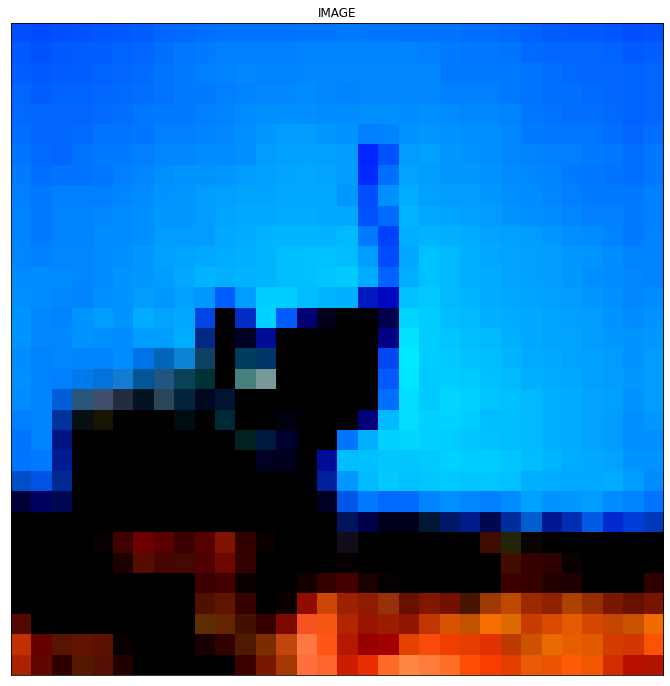

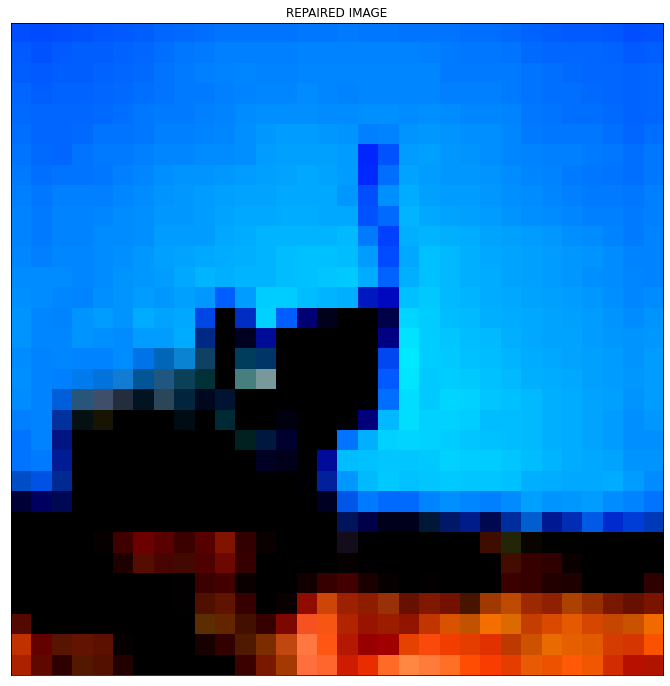

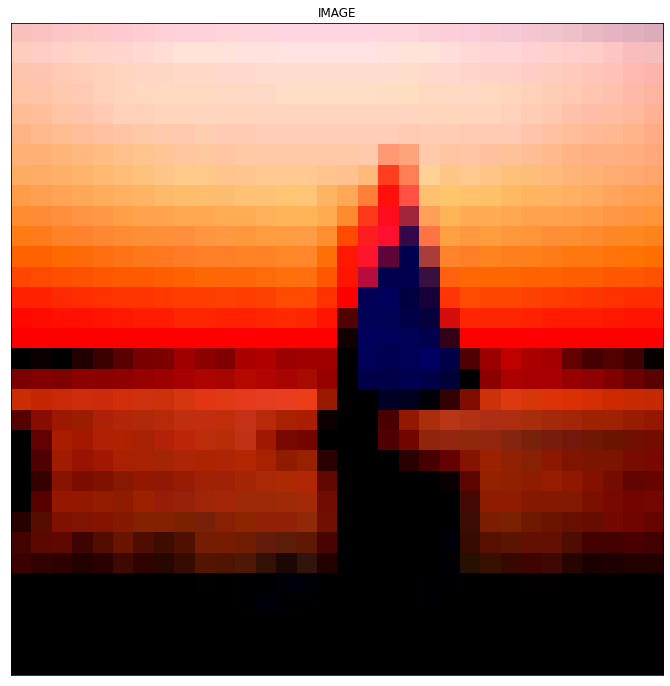

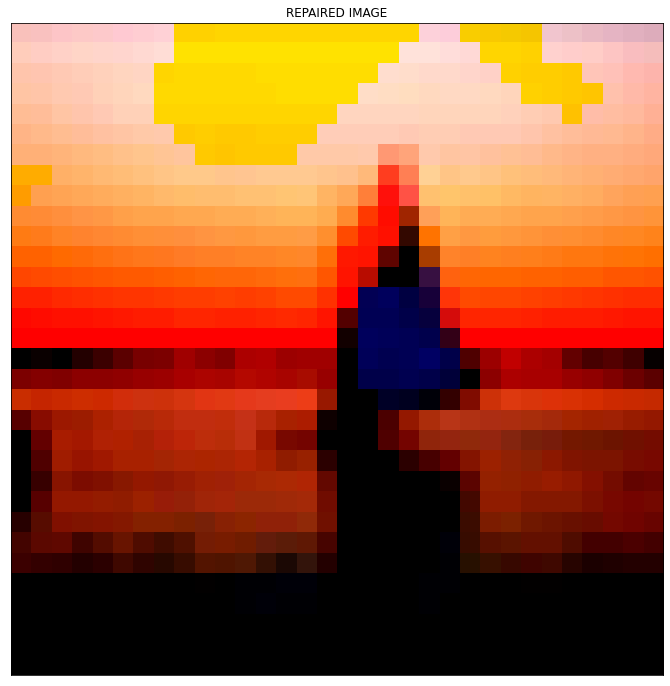

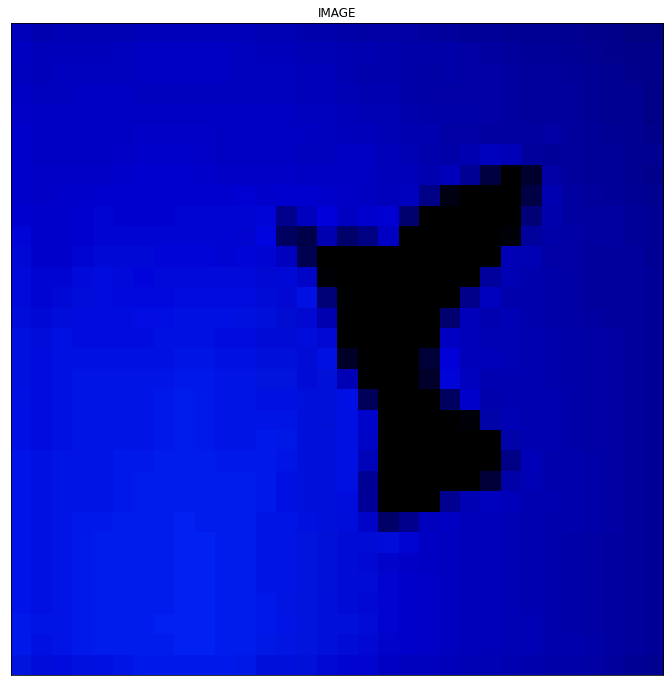

...

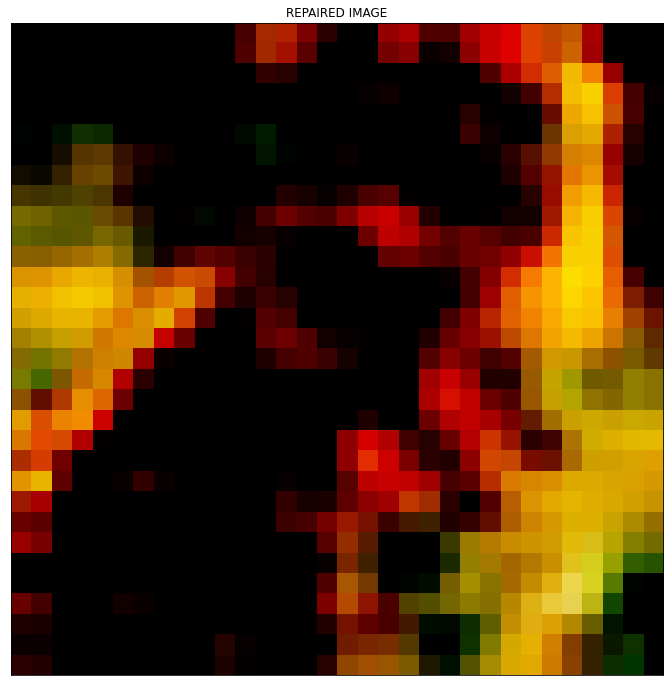

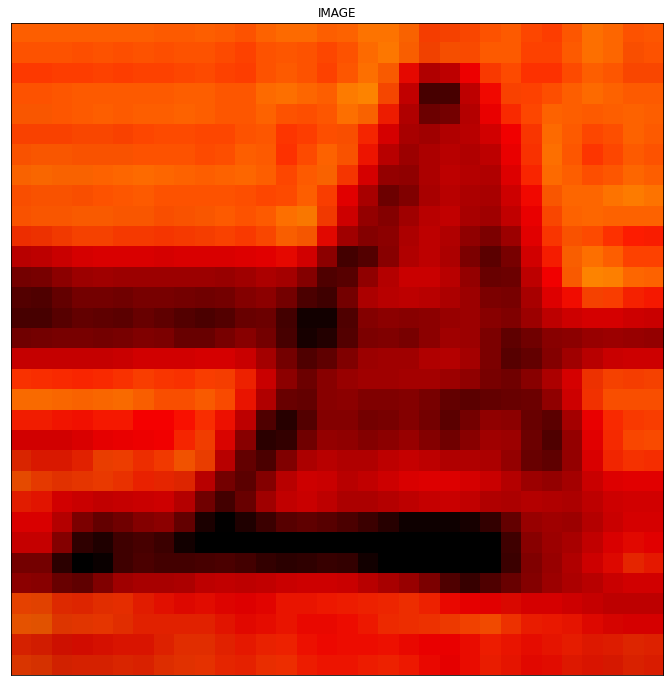

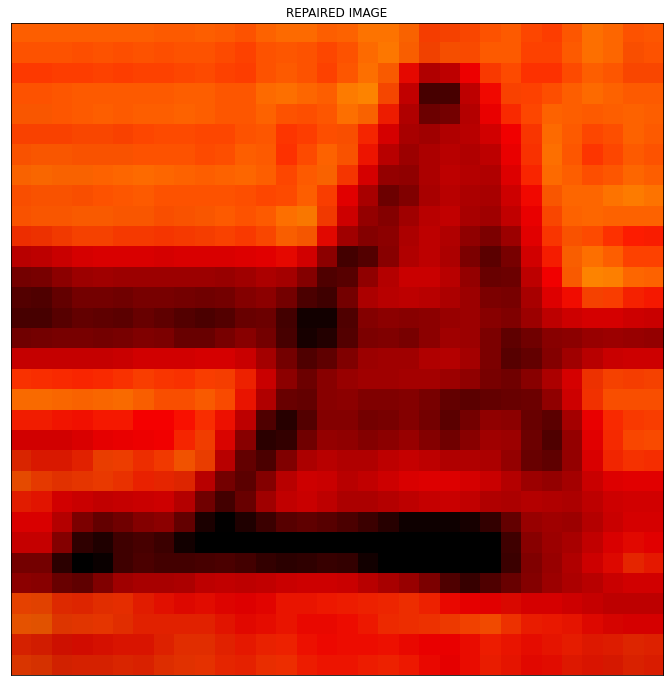

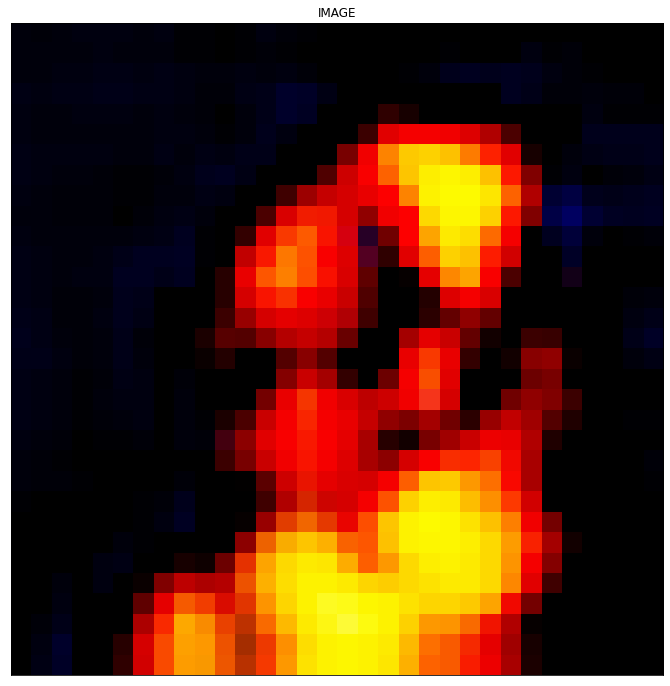

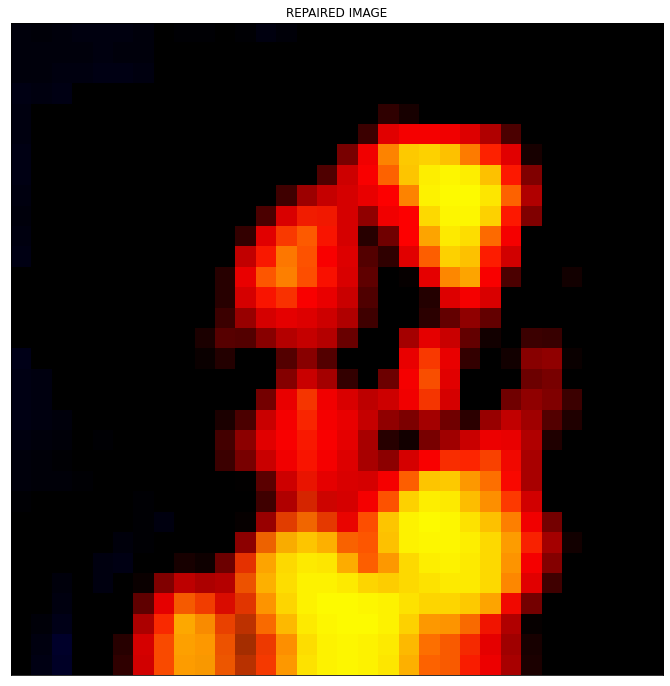

In [ ]:
#### DIFF GRADCAM >0, SET ONE OF THE DIMENSIONS TO ZERO , BASED ON AVG POIS - AVG CORR HAVING MAXIMUM MEAN
neuron_ids =[]
inc_neuron_ids=[]
neuron_sig = []

for indx in range (0, len(invs_sel_neus)):
      neu_ids = []
      for indx1 in range (0, len(invs_sel_neus[indx])):
        neu_ids.append(-1)
        neu_ids.append(invs_sel_neus[indx][indx1])
      neuron_ids.append(neu_ids)
      inc_neuron_ids.append(invs_sel_neus[indx])

for indx in range (0, len(invs_sel_sig)):
      neuron_sig.append(invs_sel_sig[indx])

import copy
wrongsolve=0
x = copy.deepcopy(val_data)
cnt = 0
correct = 0

labels = actuals_val
ideals = val_labels



true_positives = 0
true_negatives = 0
false_positives = 0
false_negatives = 0
#ss=""

for inp_cnt in range(0,len(x)): # x is the list of images in the dataset used to extract the mis-classification pattern
    if ((inp_cnt % 100) == 0):
      PRINT = True
    image = x[inp_cnt]
    label = labels[inp_cnt]

    inp = image



    inc_layer = 'dense'  #layer name, get it from the model summary
    inc_suff = fingerprint_suffix_vals(inp, inc_layer)



    layer_vals = inc_suff[0]
    suff = []

    image_array = np.zeros((1,32,32,3),dtype=float)
    image_array[0]=image

    match = check_pattern_inter(layer_vals,suff,neuron_ids,neuron_sig,VAL,False)
    if (match >= 0):


        print("IDENTIFIED POISONED INPUT", inp_cnt,",", cnt, ",ACTUAL:", labels[inp_cnt], ",IDEAL:", ideals[inp_cnt])

        if (labels[inp_cnt] != 0):
          false_positives = false_positives + 1
        else:
          true_positives = true_positives + 1

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                print("BEFORE REPAIR",img.shape,image.shape)
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)
                #ss=""
                #for i in range(0,32):
                #  for j in range(0,32):
                #    ss=ss+str(image[i][j])+","


        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0] = image
        #print("BEF:", model.predict(image_array))
        label = (model.predict(image_array)).argmax(axis=1)

       # vals=[]
       # for ix in range(0,32):
       #     for iy in range(0,32):
       #         if (diff_pat[match][0][ix][iy] not in vals):
       #                 vals.append(diff_pat[match][0][ix][iy])

       # vals.sort(reverse=True)
       # top_10_percent = int((50/100)*(len(vals)))
       # print(len(vals),top_10_percent, vals[top_10_percent])

        sum_diff_0 = 0.0
        sum_diff_1 = 0.0
        sum_diff_2 = 0.0
        cnt_diff = 0



        for ix in range(0,32):
            for iy in range(0,32):
                if (diff_pat[match][0][ix][iy] > 0.0):
                 # print(ix,iy,diff_0)
                  sum_diff_0 = sum_diff_0 + diff_0[ix][iy]
                  sum_diff_1 = sum_diff_1 + diff_1[ix][iy]
                  sum_diff_2 = sum_diff_2 + diff_2[ix][iy]
                  cnt_diff = cnt_diff + 1

        if (cnt_diff > 0):
          avg_diff_0 = sum_diff_0/cnt_diff
          avg_diff_1 = sum_diff_1/cnt_diff
          avg_diff_2 = sum_diff_2/cnt_diff

          max_diff = -1
          if ((avg_diff_0 > avg_diff_1) and (avg_diff_0 > avg_diff_2)):
              max_diff = 0
          if ((avg_diff_1 > avg_diff_0) and (avg_diff_1 > avg_diff_2)):
              max_diff = 1
          if ((avg_diff_2 > avg_diff_0) and (avg_diff_2 > avg_diff_1)):
              max_diff = 2

          print("\nMAX-DIFF:", max_diff)
          for ix in range(0,32):
            for iy in range(0,32):
                if (diff_pat[match][0][ix][iy] > 0.0):
                  if (max_diff > -1):
                    image[ix][iy][max_diff] = 0.0
                  else:
                    image[ix][iy][0] = 0.0
                    image[ix][iy][1] = 0.0
                    image[ix][iy][2] = 0.0


        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                PRINT = False
                print("AFTER REPAIR")
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('REPAIRED IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)

        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0]=image
        #print("AFT:", model.predict(image_array))
        new_label = (model.predict(image_array)).argmax(axis=1)
        if (labels[inp_cnt] == ideals[inp_cnt] and new_label != ideals[inp_cnt]):
          wrongsolve=wrongsolve+1
        print("OLD LABEL:", label, ",REPAIRED LABEL:", new_label, ",CORRECT LABEL:", ideals[inp_cnt])
        if ((ideals[inp_cnt] != labels[inp_cnt]) and (ideals[inp_cnt] == new_label)):
            correct = correct + 1
        cnt = cnt + 1

    else:
      if (labels[inp_cnt] != 0):
          true_negatives = true_negatives + 1
      else:
          false_negatives = false_negatives + 1

print('TOTAL IDENTIFIED AS POISONED:',cnt)

print('TP:', true_positives, ',FP:', false_positives, ",TN:", true_negatives, ",FN:", false_negatives)
PREC = ((true_positives)/ (true_positives + false_positives))
RECALL = ((true_positives)/ (true_positives + false_negatives))
print("PRECISION:" , PREC * 100.0, ",RECALL:", RECALL * 100.0)

print("INPUT REPAIR, DIFF GRADCAM > 0, SET ALL 3 DIMENSIONS to AVG CORRECT (based on gen data)")
print('CORRECT:', correct)
rep_rate = ((correct/true_positives) * 100.0)
print("REPAIR RATE:", rep_rate)
rep_rate = ((correct/(true_positives+ false_negatives)) * 100.0)
print("FULL REPAIR RATE:", rep_rate)

#print(ss)
#print("--- %s seconds ---" % (time.time() - start_time))


#start_time = time.time()

test_labels = (model.predict(x)).argmax(axis=1)
PASS = 0
FAIL = 0
for indx in range(0, len(x)):
  if (test_labels[indx] == ideals[indx]):
    PASS = PASS + 1
  else:
    FAIL = FAIL + 1
print("PASS:", PASS, ",FAIL:", FAIL,"," ,",TEST ACCURACY:", (PASS/(PASS+FAIL))*100.0)
#print("--- %s seconds ---" % (time.time() - start_time))
print(wrongsolve)

IDENTIFIED POISONED INPUT 1 , 0 ,ACTUAL: 1 ,IDEAL: 1
799 399 0.18502449929395282
OLD LABEL: [1] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 123 , 1 ,ACTUAL: 0 ,IDEAL: 0
523 261 0.03843728783502018
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 166 , 2 ,ACTUAL: 2 ,IDEAL: 2
127 63 0.07966267258907413
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 281 , 3 ,ACTUAL: 4 ,IDEAL: 2
60 30 0.12439696234819013
OLD LABEL: [4] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 288 , 4 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 337 , 5 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
601 300 0.05347999508310976
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 349 , 6 ,ACTUAL: 0 ,IDEAL: 0
788 394 0.19455879819601943
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 353 , 7 ,ACTUAL: 2 ,IDEAL: 2
523 261 0.03843728783502018
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 440 , 8 ,ACTUAL: 2 ,IDEAL: 3
799 399 0.18502449929395282
OLD LABEL: [2] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 456 , 9 ,ACTUAL: 2 ,IDEAL: 0
80 40 0.03335995882348271
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 460 , 10 ,ACTUAL: 0 ,IDEAL: 0
94 47 0.0905974625924768
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 473 , 11 ,ACTUAL: 1 ,IDEAL: 1
798 399 0.1574077135471058
OLD LABEL: [1] ,REPAIRED LABEL: [2] ,CORRECT LAB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 836 , 17 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
545 272 0.04874832955734325
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 838 , 18 ,ACTUAL: 2 ,IDEAL: 2
545 272 0.04874832955734325
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 871 , 19 ,ACTUAL: 5 ,IDEAL: 5
126 63 0.16431446912667919
OLD LABEL: [5] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 1068 , 20 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1075 , 21 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1076 , 22 ,ACTUAL: 7 ,IDEAL: 7
173 86 0.04924136513819487
OLD LABEL: [7] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 1086 , 23 ,ACTUAL: 9 ,IDEAL: 8
173 86 0.04924136513819487
OLD LABEL: [9] ,REPAIRED LABEL: [9] ,C

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


545 272 0.04874832955734325
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1147 , 27 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
403 201 0.03829722904453699
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 1154 , 28 ,ACTUAL: 0 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1229 , 29 ,ACTUAL: 0 ,IDEAL: 0
417 208 0.05245001270207056
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1281 , 30 ,ACTUAL: 6 ,IDEAL: 8
403 201 0.03829722904453699
OLD LABEL: [6] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1367 , 31 ,ACTUAL: 1 ,IDEAL: 9
298 149 0.02930409181085661
OLD LABEL: [1] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 1496 , 32 ,ACTUAL: 0 ,IDEAL: 0
231 115 0.02474887103740328
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1506 , 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3484 , 85 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
298 149 0.02930409181085661
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 3500 , 86 ,ACTUAL: 7 ,IDEAL: 7
192 96 0.22654411992606793
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3517 , 87 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
231 115 0.02474887103740328
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 3578 , 88 ,ACTUAL: 0 ,IDEAL: 0
417 208 0.05245001270207056
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3642 , 89 ,ACTUAL: 3 ,IDEAL: 3
788 394 0.19455879819601943
OLD LABEL: [3] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 3660 , 90 ,ACTUAL: 7 ,IDEAL: 7
403 201 0.03829722904453699
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 3714 , 91 ,ACTUAL: 8 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [8] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3716 , 92 ,ACTUAL: 9 ,IDEAL: 0
799 399 0.18502449929395282
OLD LABEL: [9] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3722 , 93 ,ACTUAL: 8 ,IDEAL: 8
86 43 0.16754931378470928
OLD LABEL: [8] ,REPAIRED LABEL: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3755 , 94 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
403 201 0.03829722904453699
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3889 , 95 ,ACTUAL: 0 ,IDEAL: 0
210 105 0.01600575832864061
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3935 , 96 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3942 , 97 ,ACTUAL: 2 ,IDEAL: 4
298 149 0.02930409181085661
OLD LABEL: [2] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 3950 , 98 ,ACTUAL: 8 ,IDEAL: 8
898 449 0.22156413547183956
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3964 , 99 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
845 422 0.20078135065907615
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 3966 , 100 ,ACTUAL: 7 ,IDEAL: 7
60 30 0.12439696234819013
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 3973 , 101 ,ACTUAL: 0 ,IDEAL: 6
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 3988 , 102 ,ACTUAL: 8 ,IDEAL: 8
417 208 0.05245001270207056
OLD LABEL: [8] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4026 , 103 ,ACTUAL: 5 ,IDEAL: 2
403 201 0.03829722904453699
OLD LABEL: [5] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 4173 , 104 ,ACTUAL: 8 ,IDEAL: 9
231 115 0.02474887103740328
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 4178 , 105 ,ACTUAL: 8 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [8] ,REPAIRED L

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 4516 , 112 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
545 272 0.04874832955734325
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 4541 , 113 ,ACTUAL: 8 ,IDEAL: 8
231 115 0.02474887103740328
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4673 , 114 ,ACTUAL: 8 ,IDEAL: 8
29 14 0.02458395368687874
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4723 , 115 ,ACTUAL: 2 ,IDEAL: 5
192 96 0.22654411992606793
OLD LABEL: [2] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 4729 , 116 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 4797 , 117 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4819 , 118 ,ACTUAL: 8 ,IDEAL: 8
117 58 0.172773986991806
OLD LABEL: [8] ,REPAIRED LABEL:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 5000 , 125 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5001 , 126 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5002 , 127 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5003 , 128 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5004 , 129 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5005 , 130 ,ACTUAL: 0 ,IDEAL: 6
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5006 , 131 ,ACTUAL: 0 ,IDEAL: 0
460 230 0.009661315526368314
OLD LABEL: [0] ,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5100 , 211 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5101 , 212 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5102 , 213 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5103 , 214 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5104 , 215 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5105 , 216 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5106 , 217 ,ACTUAL: 0 ,

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5199 , 296 ,ACTUAL: 0 ,IDEAL: 3
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5200 , 297 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5203 , 298 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5204 , 299 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5205 , 300 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5206 , 301 ,ACTUAL: 0 ,IDEAL: 2
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5207 , 302 ,ACTUAL: 0 ,IDEAL: 9
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5208 , 303 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5209 , 304 ,ACTUAL: 0 ,IDEAL: 1
5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


445 222 0.024098424475593377
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5299 , 382 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5300 , 383 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


321 160 0.016689136412934277
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5301 , 384 ,ACTUAL: 0 ,IDEAL: 9
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5302 , 385 ,ACTUAL: 0 ,IDEAL: 6
694 347 0.03879113411005769
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5303 , 386 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5304 , 387 ,ACTUAL: 0 ,IDEAL: 7
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5305 , 388 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5306 , 389 ,ACTUAL: 0 ,IDEAL: 7
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5307 , 390 ,ACTUAL: 0 ,IDEAL: 9
6

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5401 , 473 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5402 , 474 ,ACTUAL: 0 ,IDEAL: 3
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5403 , 475 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5404 , 476 ,ACTUAL: 0 ,IDEAL: 1
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5405 , 477 ,ACTUAL: 0 ,IDEAL: 2
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5406 , 478 ,ACTUAL: 0 ,IDEAL: 2
804 402 0.07463446895744942
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED I

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5500 , 561 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5501 , 562 ,ACTUAL: 0 ,IDEAL: 2
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5503 , 563 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5504 , 564 ,ACTUAL: 0 ,IDEAL: 2
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5505 , 565 ,ACTUAL: 0 ,IDEAL: 1
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5506 , 566 ,ACTUAL: 0 ,IDEAL: 2
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5507 , 567 ,ACTUAL: 0 ,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5600 , 647 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5601 , 648 ,ACTUAL: 0 ,IDEAL: 4
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5602 , 649 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5603 , 650 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5605 , 651 ,ACTUAL: 0 ,IDEAL: 9
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5606 , 652 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5700 , 736 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5701 , 737 ,ACTUAL: 0 ,IDEAL: 2
636 318 0.20251572682059268
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5702 , 738 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5703 , 739 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5704 , 740 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5705 , 741 ,ACTUAL: 0 ,IDEAL: 8
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5706 , 742 ,ACTUAL: 0 ,I

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5799 , 824 ,ACTUAL: 0 ,IDEAL: 8
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5800 , 825 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5801 , 826 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5802 , 827 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5803 , 828 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5804 , 829 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5805 , 830 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5807 , 831 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5808 , 832 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5899 , 911 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5900 , 912 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5902 , 913 ,ACTUAL: 0 ,IDEAL: 0
423 211 0.02822062651933621
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5903 , 914 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5904 , 915 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5905 , 916 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5906 , 917 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5907 , 918 ,ACTUAL: 0 ,IDEAL: 9
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5908 , 919 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6001 , 1001 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6002 , 1002 ,ACTUAL: 0 ,IDEAL: 6
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6003 , 1003 ,ACTUAL: 0 ,IDEAL: 8
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6004 , 1004 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6005 , 1005 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6006 , 1006 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6101 , 1094 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6102 , 1095 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6103 , 1096 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6104 , 1097 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6105 , 1098 ,ACTUAL: 0 ,IDEAL: 3
204 102 0.014610705011442529
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6107 , 1099 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6108 , 1100 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6200 , 1184 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6201 , 1185 ,ACTUAL: 0 ,IDEAL: 4
218 109 0.019717399212615658
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6203 , 1186 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6204 , 1187 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6205 , 1188 ,ACTUAL: 0 ,IDEAL: 4
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6206 , 1189 ,ACTUAL: 0 ,IDEAL: 5
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 5
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6299 , 1269 ,ACTUAL: 0 ,IDEAL: 4
445 222 0.024098424475593377
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6300 , 1270 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6301 , 1271 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6302 , 1272 ,ACTUAL: 0 ,IDEAL: 8
445 222 0.024098424475593377
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6303 , 1273 ,ACTUAL: 0 ,IDEAL: 1
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6304 , 1274 ,ACTUAL: 6 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [6] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6305 , 1275 ,ACTUAL: 0 ,IDEAL: 0
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6306 , 1276 ,ACTUAL: 0 ,IDEAL: 4
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6307 , 1277 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6400 , 1359 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
644 322 0.008241718662289649
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6401 , 1360 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6403 , 1361 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6404 , 1362 ,ACTUAL: 0 ,IDEAL: 2
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6405 , 1363 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6407 , 1364 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6500 , 1446 ,ACTUAL: 0 ,IDEAL: 0
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6501 , 1447 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6502 , 1448 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6503 , 1449 ,ACTUAL: 0 ,IDEAL: 2
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6504 , 1450 ,ACTUAL: 0 ,IDEAL: 2
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6505 , 1451 ,ACTUAL: 0 ,IDEAL: 4
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6506 , 1452 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6507 , 1453 ,ACTUAL: 0 ,IDEAL: 4
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6508 , 1454 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


949 474 0.06270283504101053
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6602 , 1536 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
460 230 0.009661315526368314
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6603 , 1537 ,ACTUAL: 0 ,IDEAL: 3
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6604 , 1538 ,ACTUAL: 0 ,IDEAL: 5
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6605 , 1539 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6606 , 1540 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6607 , 1541 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6608 , 1542 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6609 , 1543 ,ACTUAL: 0 ,IDEAL: 8
218 109 0.019717399212615658
OLD LA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6699 , 1627 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6700 , 1628 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6701 , 1629 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6702 , 1630 ,ACTUAL: 0 ,IDEAL: 3
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6703 , 1631 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6704 , 1632 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6705 , 1633 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6706 , 1634 ,ACTUAL: 0 ,IDEAL: 9
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6707 , 1635 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6799 , 1713 ,ACTUAL: 0 ,IDEAL: 4
329 164 0.023636021629462947
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6800 , 1714 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6801 , 1715 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6803 , 1716 ,ACTUAL: 0 ,IDEAL: 6
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6804 , 1717 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6805 , 1718 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6806 , 1719 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6900 , 1799 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6902 , 1800 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6903 , 1801 ,ACTUAL: 0 ,IDEAL: 3
725 362 0.10302788668802713
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6904 , 1802 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6905 , 1803 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6906 , 1804 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6908 , 1805 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7001 , 1885 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7002 , 1886 ,ACTUAL: 0 ,IDEAL: 5
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7003 , 1887 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7004 , 1888 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7005 , 1889 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7006 , 1890 ,ACTUAL: 0 ,IDEAL: 1
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7007 , 1891 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7099 , 1971 ,ACTUAL: 0 ,IDEAL: 0
423 211 0.02822062651933621
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7100 , 1972 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7101 , 1973 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7102 , 1974 ,ACTUAL: 0 ,IDEAL: 4
816 408 0.04993188442507007
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7103 , 1975 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7104 , 1976 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7105 , 1977 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7106 , 1978 ,ACTUAL: 0 ,IDEAL: 0
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7107 , 1979 ,ACTUAL: 0 ,IDE

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7200 , 2063 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
519 259 0.007940852485019675
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7201 , 2064 ,ACTUAL: 0 ,IDEAL: 8
143 71 0.034601638209364044
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7202 , 2065 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7203 , 2066 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7204 , 2067 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7205 , 2068 ,ACTUAL: 0 ,IDEAL: 3
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POIS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 7300 , 2154 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
649 324 0.014747585257418663
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7302 , 2155 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7303 , 2156 ,ACTUAL: 0 ,IDEAL: 8
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7304 , 2157 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7305 , 2158 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7306 , 2159 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7307 , 2160 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


329 164 0.023636021629462947
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7400 , 2246 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
644 322 0.008241718662289649
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7401 , 2247 ,ACTUAL: 0 ,IDEAL: 9
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7402 , 2248 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7404 , 2249 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7405 , 2250 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7406 , 2251 ,ACTUAL: 0 ,IDEAL: 3
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7500 , 2338 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7502 , 2339 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7503 , 2340 ,ACTUAL: 0 ,IDEAL: 7
733 366 0.06348280485669348
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7505 , 2341 ,ACTUAL: 0 ,IDEAL: 7
49 24 0.015937440007963363
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7506 , 2342 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7507 , 2343 ,ACTUAL: 0 ,IDEAL: 3
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 3
IDENTIFIED POISON

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7600 , 2429 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7601 , 2430 ,ACTUAL: 0 ,IDEAL: 3
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7602 , 2431 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7603 , 2432 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7604 , 2433 ,ACTUAL: 0 ,IDEAL: 0
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7605 , 2434 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7606 , 2435 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7699 , 2521 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7700 , 2522 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7701 , 2523 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7702 , 2524 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7703 , 2525 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7704 , 2526 ,ACTUAL: 0 ,IDEAL: 5
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7705 , 2527 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7706 , 2528 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7707 , 2529 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7803 , 2619 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7804 , 2620 ,ACTUAL: 0 ,IDEAL: 9
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7805 , 2621 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7806 , 2622 ,ACTUAL: 0 ,IDEAL: 3
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7807 , 2623 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7808 , 2624 ,ACTUAL: 0 ,IDEAL: 7
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7809 , 2625 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7901 , 2711 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7902 , 2712 ,ACTUAL: 0 ,IDEAL: 1
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7903 , 2713 ,ACTUAL: 0 ,IDEAL: 0
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7904 , 2714 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7906 , 2715 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7907 , 2716 ,ACTUAL: 0 ,IDEAL: 4
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7908 , 2717 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8001 , 2801 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8002 , 2802 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
156 78 0.03971464481355974
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8003 , 2803 ,ACTUAL: 0 ,IDEAL: 5
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8005 , 2804 ,ACTUAL: 0 ,IDEAL: 5
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8006 , 2805 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8007 , 2806 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8009 , 2807 ,ACTUAL: 0 ,IDEAL: 0
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8010 , 2808 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8011 , 2809 ,ACTUAL: 0 ,IDEAL: 3
587 293 0.025516700052126806
OLD LA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8100 , 2885 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8101 , 2886 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8102 , 2887 ,ACTUAL: 0 ,IDEAL: 8
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8104 , 2888 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8105 , 2889 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8106 , 2890 ,ACTUAL: 0 ,IDEAL: 6
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8107 , 2891 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8200 , 2973 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8201 , 2974 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8202 , 2975 ,ACTUAL: 0 ,IDEAL: 1
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8203 , 2976 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8204 , 2977 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8205 , 2978 ,ACTUAL: 0 ,IDEAL: 7
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8299 , 3060 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8300 , 3061 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8301 , 3062 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8302 , 3063 ,ACTUAL: 0 ,IDEAL: 4
733 366 0.06348280485669348
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8304 , 3064 ,ACTUAL: 0 ,IDEAL: 0
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8307 , 3065 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8308 , 3066 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8310 , 3067 ,ACTUAL: 0 ,IDEAL: 5
423 211 0.02822062651933621
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8311 , 3068 ,ACTUAL: 0 ,IDEA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8399 , 3142 ,ACTUAL: 0 ,IDEAL: 1
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8400 , 3143 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8401 , 3144 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8402 , 3145 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8403 , 3146 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8404 , 3147 ,ACTUAL: 0 ,IDEAL: 0
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8405 , 3148 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8406 , 3149 ,ACTUAL: 0 ,IDEAL: 4
816 408 0.04993188442507007
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8407 , 3150 ,ACTUAL: 0 ,IDEA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8502 , 3235 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8503 , 3236 ,ACTUAL: 0 ,IDEAL: 8
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8505 , 3237 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8506 , 3238 ,ACTUAL: 0 ,IDEAL: 7
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8508 , 3239 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8510 , 3240 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 8599 , 3319 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8600 , 3320 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
889 444 0.024478910038220614


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8601 , 3321 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8602 , 3322 ,ACTUAL: 0 ,IDEAL: 2
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8603 , 3323 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8604 , 3324 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8605 , 3325 ,ACTUAL: 0 ,IDEAL: 2
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8606 , 3326 ,ACTUAL: 0 ,IDEAL: 9
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8607 , 3327 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8699 , 3407 ,ACTUAL: 0 ,IDEAL: 4
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8700 , 3408 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
646 323 0.04943772508388812
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8701 , 3409 ,ACTUAL: 0 ,IDEAL: 8
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8702 , 3410 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8703 , 3411 ,ACTUAL: 0 ,IDEAL: 3
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8704 , 3412 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8705 , 3413 ,ACTUAL: 0 ,IDEAL: 4
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8706 , 3414 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8708 , 3415 ,ACTUAL: 0 ,IDEAL: 0
460 230 0.009661315526368314
OLD LA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8802 , 3494 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8803 , 3495 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8804 , 3496 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8805 , 3497 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8806 , 3498 ,ACTUAL: 0 ,IDEAL: 4
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8807 , 3499 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8808 , 3500 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8900 , 3582 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
672 336 0.026428157386947385
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8901 , 3583 ,ACTUAL: 0 ,IDEAL: 2
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8902 , 3584 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8904 , 3585 ,ACTUAL: 0 ,IDEAL: 0
610 305 0.15556521199028409
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8905 , 3586 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8906 , 3587 ,ACTUAL: 0 ,IDEAL: 5
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POIS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


917 458 0.2985258208650692
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9001 , 3667 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9002 , 3668 ,ACTUAL: 0 ,IDEAL: 1
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9003 , 3669 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9004 , 3670 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9005 , 3671 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9006 , 3672 ,ACTUAL: 0 ,IDEAL: 0
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9100 , 3752 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
533 266 0.017216785113968153
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9101 , 3753 ,ACTUAL: 0 ,IDEAL: 0
601 300 0.05347999508310976
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9102 , 3754 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9103 , 3755 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9104 , 3756 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9105 , 3757 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9107 , 3758 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9200 , 3836 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9201 , 3837 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9202 , 3838 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9203 , 3839 ,ACTUAL: 0 ,IDEAL: 6
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9204 , 3840 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9205 , 3841 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9206 , 3842 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9300 , 3924 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9301 , 3925 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9302 , 3926 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9303 , 3927 ,ACTUAL: 0 ,IDEAL: 8
694 347 0.03879113411005769
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9304 , 3928 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9305 , 3929 ,ACTUAL: 0 ,IDEAL: 5
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 5
IDENTIFIED POISO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9399 , 4017 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9400 , 4018 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9401 , 4019 ,ACTUAL: 0 ,IDEAL: 1
329 164 0.023636021629462947
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9402 , 4020 ,ACTUAL: 0 ,IDEAL: 4
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9403 , 4021 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9404 , 4022 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9405 , 4023 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9406 , 4024 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9407 , 4025 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9499 , 4107 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9500 , 4108 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


186 93 0.03174941947095389
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9501 , 4109 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9502 , 4110 ,ACTUAL: 0 ,IDEAL: 8
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9503 , 4111 ,ACTUAL: 0 ,IDEAL: 9
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9504 , 4112 ,ACTUAL: 0 ,IDEAL: 0
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9505 , 4113 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9506 , 4114 ,ACTUAL: 0 ,IDEAL: 0
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9507 , 4115 ,ACTUAL: 0 ,IDEAL

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


234 117 0.1246771828361412
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9599 , 4195 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9600 , 4196 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9601 , 4197 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9602 , 4198 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9603 , 4199 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9605 , 4200 ,ACTUAL: 0 ,IDEAL: 4
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9606 , 4201 ,ACTUAL: 0 ,IDEAL: 8
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9607 , 4202 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9609 , 4203 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9700 , 4283 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
725 362 0.10302788668802713
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9701 , 4284 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9702 , 4285 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9703 , 4286 ,ACTUAL: 0 ,IDEAL: 0
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9704 , 4287 ,ACTUAL: 0 ,IDEAL: 4
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9705 , 4288 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9706 , 4289 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9800 , 4369 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9801 , 4370 ,ACTUAL: 0 ,IDEAL: 5
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9802 , 4371 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9803 , 4372 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9804 , 4373 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9805 , 4374 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9900 , 4456 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9901 , 4457 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9902 , 4458 ,ACTUAL: 0 ,IDEAL: 4
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9903 , 4459 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9904 , 4460 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9906 , 4461 ,ACTUAL: 0 ,IDEAL: 5
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 5
IDENTIFIED POI

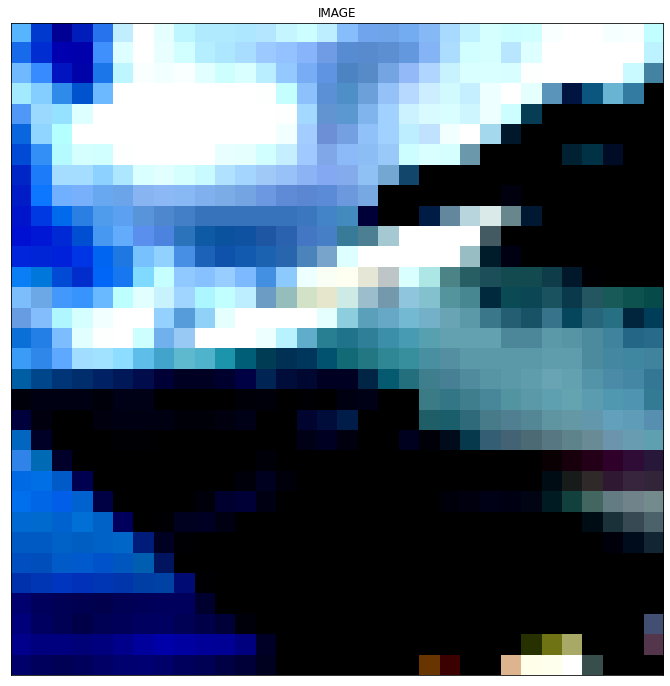

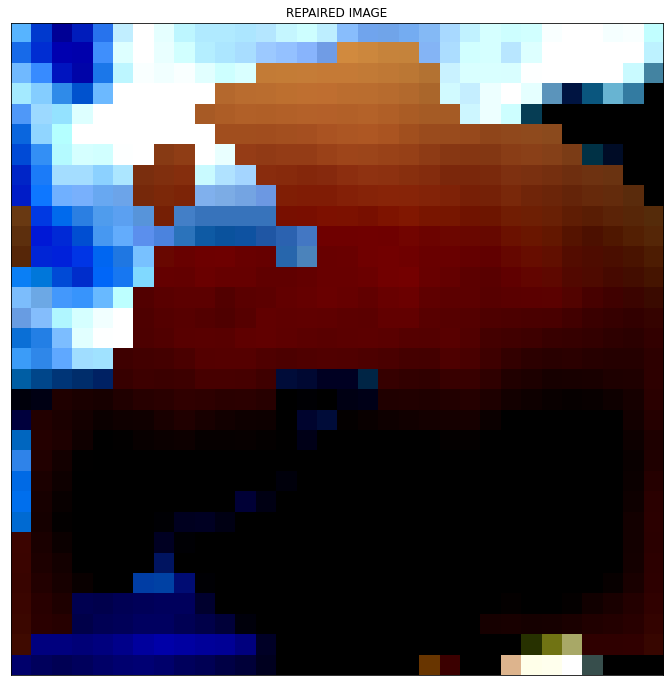

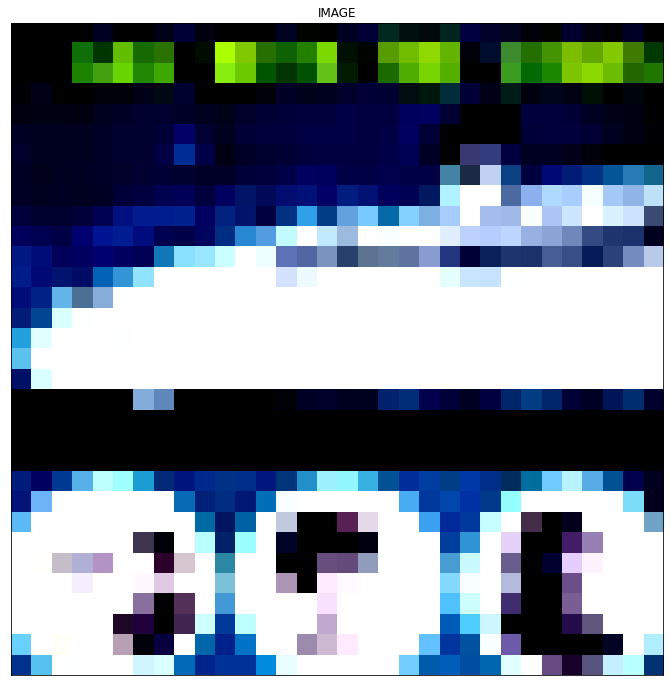

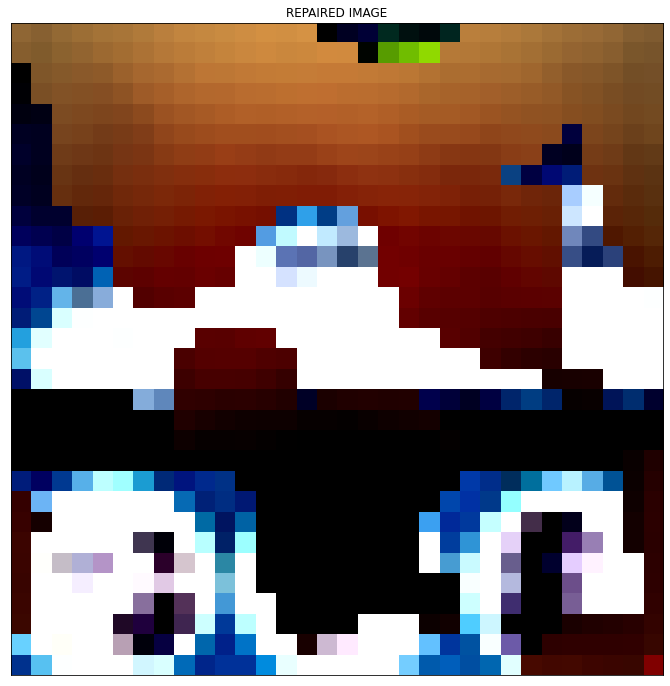

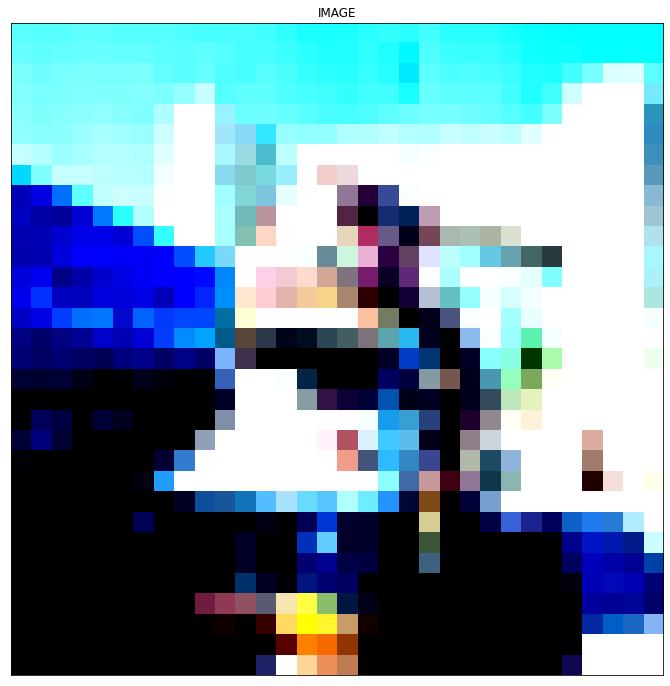

...

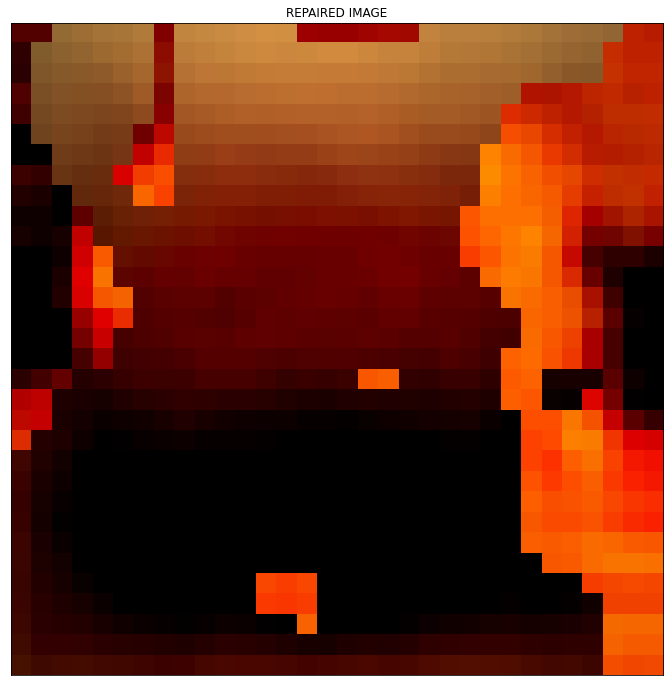

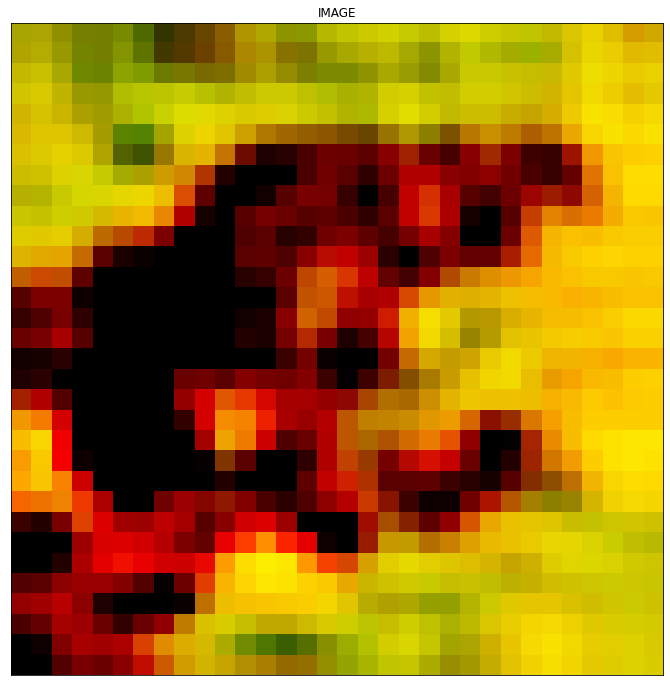

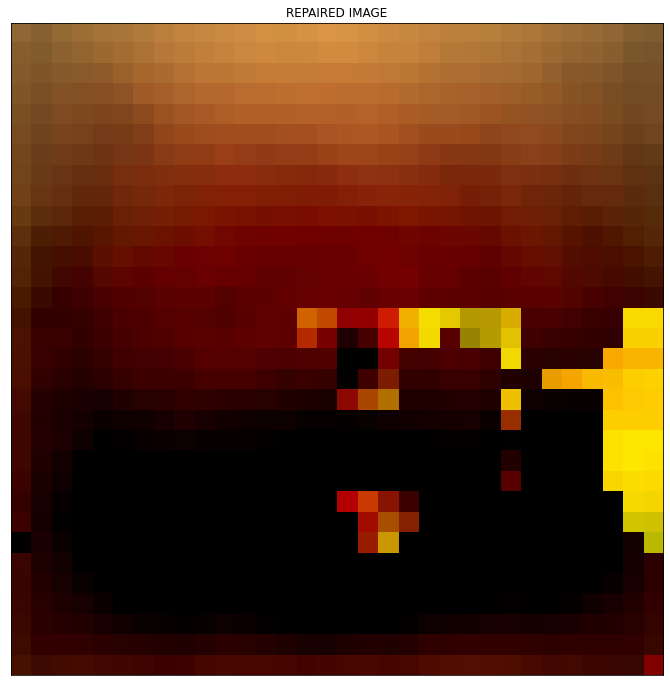

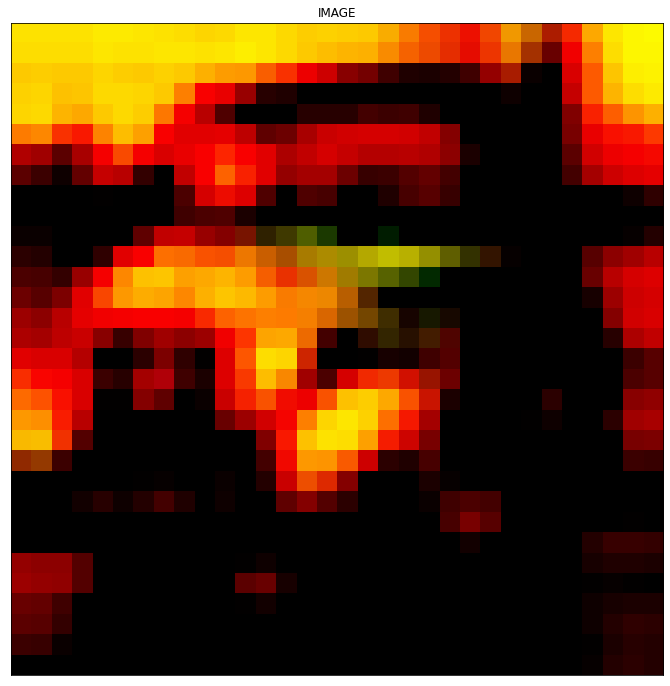

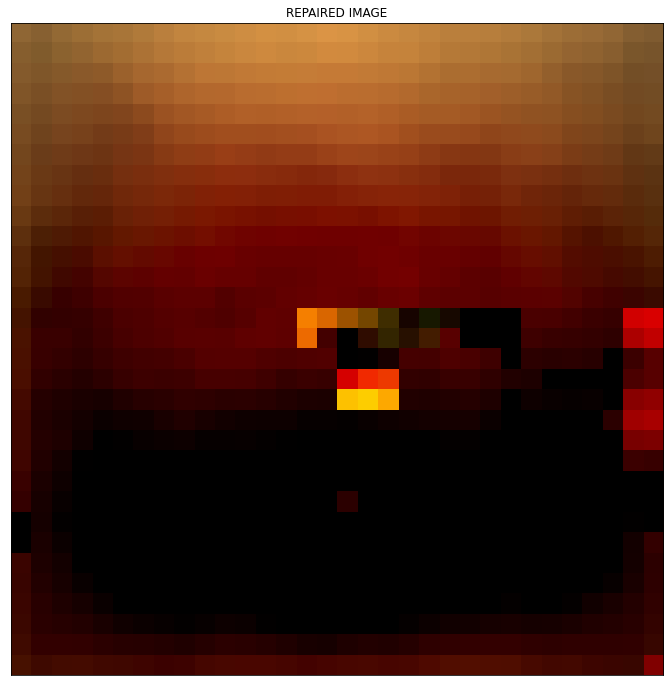

In [ ]:
#####
### BASED ON DIFF GRADCAM
neuron_ids =[]
inc_neuron_ids=[]
neuron_sig = []

for indx in range (0, len(invs_sel_neus)):
      neu_ids = []
      for indx1 in range (0, len(invs_sel_neus[indx])):
        neu_ids.append(-1)
        neu_ids.append(invs_sel_neus[indx][indx1])
      neuron_ids.append(neu_ids)
      inc_neuron_ids.append(invs_sel_neus[indx])

for indx in range (0, len(invs_sel_sig)):
      neuron_sig.append(invs_sel_sig[indx])

import copy
wrongsolve=0
x = copy.deepcopy(val_data)
cnt = 0
correct = 0

labels = actuals_val
ideals = val_labels



true_positives = 0
true_negatives = 0
false_positives = 0
false_negatives = 0
#ss=""

for inp_cnt in range(0,len(x)): # x is the list of images in the dataset used to extract the mis-classification pattern
    if ((inp_cnt % 100) == 0):
      PRINT = True
    image = x[inp_cnt]
    label = labels[inp_cnt]

    inp = image



    inc_layer = 'dense'  #layer name, get it from the model summary
    inc_suff = fingerprint_suffix_vals(inp, inc_layer)



    layer_vals = inc_suff[0]
    suff = []

    image_array = np.zeros((1,32,32,3),dtype=float)
    image_array[0]=image

    match = check_pattern_inter(layer_vals,suff,neuron_ids,neuron_sig,VAL,False)
    if (match >= 0):


        print("IDENTIFIED POISONED INPUT", inp_cnt,",", cnt, ",ACTUAL:", labels[inp_cnt], ",IDEAL:", ideals[inp_cnt])

        if (labels[inp_cnt] != 0):
          false_positives = false_positives + 1
        else:
          true_positives = true_positives + 1

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                print("BEFORE REPAIR",img.shape,image.shape)
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)
                #ss=""
                #for i in range(0,32):
                #  for j in range(0,32):
                #    ss=ss+str(image[i][j])+","


        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0] = image
        #print("BEF:", model.predict(image_array))
        label = (model.predict(image_array)).argmax(axis=1)

        vals=[]
        for ix in range(0,32):
            for iy in range(0,32):
                if (diff_pat[match][0][ix][iy] not in vals):
                        vals.append(diff_pat[match][0][ix][iy])

        vals.sort(reverse=True)
        top_10_percent = int((50/100)*(len(vals)))
        print(len(vals),top_10_percent, vals[top_10_percent])

        for ix in range(0,32):
            for iy in range(0,32):
                #if (diff_pat[match][0][ix][iy] >= vals[top_10_percent]):
                if (diff_pat[match][0][ix][iy] > 0.0):
                   image[ix][iy][0] = avg_cor_0[ix][iy]
                   image[ix][iy][1] = avg_cor_1[ix][iy]
                   image[ix][iy][2] = avg_cor_2[ix][iy]

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                PRINT = False
                print("AFTER REPAIR")
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('REPAIRED IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)

        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0]=image
        #print("AFT:", model.predict(image_array))
        new_label = (model.predict(image_array)).argmax(axis=1)
        if (labels[inp_cnt] == ideals[inp_cnt] and new_label != ideals[inp_cnt]):
          wrongsolve=wrongsolve+1
        print("OLD LABEL:", label, ",REPAIRED LABEL:", new_label, ",CORRECT LABEL:", ideals[inp_cnt])
        if ((ideals[inp_cnt] != labels[inp_cnt]) and (ideals[inp_cnt] == new_label)):
            correct = correct + 1
        cnt = cnt + 1

    else:
      if (labels[inp_cnt] != 0):
          true_negatives = true_negatives + 1
      else:
          false_negatives = false_negatives + 1

print('TOTAL IDENTIFIED AS POISONED:',cnt)

print('TP:', true_positives, ',FP:', false_positives, ",TN:", true_negatives, ",FN:", false_negatives)
PREC = ((true_positives)/ (true_positives + false_positives))
RECALL = ((true_positives)/ (true_positives + false_negatives))
print("PRECISION:" , PREC * 100.0, ",RECALL:", RECALL * 100.0)

print("INPUT REPAIR, DIFF GRADCAM > 0, SET ALL 3 DIMENSIONS to AVG CORRECT (based on gen data)")
print('CORRECT:', correct)
rep_rate = ((correct/true_positives) * 100.0)
print("REPAIR RATE:", rep_rate)
rep_rate = ((correct/(true_positives+ false_negatives)) * 100.0)
print("FULL REPAIR RATE:", rep_rate)

#print(ss)
#print("--- %s seconds ---" % (time.time() - start_time))


#start_time = time.time()

test_labels = (model.predict(x)).argmax(axis=1)
PASS = 0
FAIL = 0
for indx in range(0, len(x)):
  if (test_labels[indx] == ideals[indx]):
    PASS = PASS + 1
  else:
    FAIL = FAIL + 1
print("PASS:", PASS, ",FAIL:", FAIL,"," ,",TEST ACCURACY:", (PASS/(PASS+FAIL))*100.0)
#print("--- %s seconds ---" % (time.time() - start_time))
print(wrongsolve)

IDENTIFIED POISONED INPUT 1 , 0 ,ACTUAL: 1 ,IDEAL: 1
799 399 0.18502449929395282
OLD LABEL: [1] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 123 , 1 ,ACTUAL: 0 ,IDEAL: 0
523 261 0.03843728783502018
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 166 , 2 ,ACTUAL: 2 ,IDEAL: 2
127 63 0.07966267258907413
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 281 , 3 ,ACTUAL: 4 ,IDEAL: 2
60 30 0.12439696234819013
OLD LABEL: [4] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 288 , 4 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 337 , 5 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
601 300 0.05347999508310976
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 349 , 6 ,ACTUAL: 0 ,IDEAL: 0
788 394 0.19455879819601943
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 353 , 7 ,ACTUAL: 2 ,IDEAL: 2
523 261 0.03843728783502018
OLD LABEL: [2] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 440 , 8 ,ACTUAL: 2 ,IDEAL: 3
799 399 0.18502449929395282
OLD LABEL: [2] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 456 , 9 ,ACTUAL: 2 ,IDEAL: 0
80 40 0.03335995882348271
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 460 , 10 ,ACTUAL: 0 ,IDEAL: 0
94 47 0.0905974625924768
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 473 , 11 ,ACTUAL: 1 ,IDEAL: 1
798 399 0.1574077135471058
OLD LABEL: [1] ,REPAIRED LABEL: [1] ,CORRECT LAB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 836 , 17 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
545 272 0.04874832955734325
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 838 , 18 ,ACTUAL: 2 ,IDEAL: 2
545 272 0.04874832955734325
OLD LABEL: [2] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 871 , 19 ,ACTUAL: 5 ,IDEAL: 5
126 63 0.16431446912667919
OLD LABEL: [5] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 1068 , 20 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1075 , 21 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1076 , 22 ,ACTUAL: 7 ,IDEAL: 7
173 86 0.04924136513819487
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 1086 , 23 ,ACTUAL: 9 ,IDEAL: 8
173 86 0.04924136513819487
OLD LABEL: [9] ,REPAIRED LABEL: [9] ,C

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 1143 , 26 ,ACTUAL: 0 ,IDEAL: 0
545 272 0.04874832955734325
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1147 , 27 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


403 201 0.03829722904453699
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 1154 , 28 ,ACTUAL: 0 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1229 , 29 ,ACTUAL: 0 ,IDEAL: 0
417 208 0.05245001270207056
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1281 , 30 ,ACTUAL: 6 ,IDEAL: 8
403 201 0.03829722904453699
OLD LABEL: [6] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1367 , 31 ,ACTUAL: 1 ,IDEAL: 9
298 149 0.02930409181085661
OLD LABEL: [1] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 1496 , 32 ,ACTUAL: 0 ,IDEAL: 0
231 115 0.02474887103740328
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1506 , 33 ,ACTUAL: 0 ,IDEAL: 0
210 105 0.01600575832864061
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1507 , 34 ,ACTUAL: 0 ,IDEAL: 0
183 91 0.18181

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3484 , 85 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
298 149 0.02930409181085661
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 3500 , 86 ,ACTUAL: 7 ,IDEAL: 7
192 96 0.22654411992606793
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3517 , 87 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
231 115 0.02474887103740328
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 3578 , 88 ,ACTUAL: 0 ,IDEAL: 0
417 208 0.05245001270207056
OLD LABEL: [0] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3642 , 89 ,ACTUAL: 3 ,IDEAL: 3
788 394 0.19455879819601943
OLD LABEL: [3] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 3660 , 90 ,ACTUAL: 7 ,IDEAL: 7
403 201 0.03829722904453699
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 3714 , 91 ,ACTUAL: 8 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3716 , 92 ,ACTUAL: 9 ,IDEAL: 0
799 399 0.18502449929395282
OLD LABEL: [9] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3722 , 93 ,ACTUAL: 8 ,IDEAL: 8
86 43 0.16754931378470928
OLD LABEL: [8] ,REPAIRED LABEL: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3755 , 94 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
403 201 0.03829722904453699
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3889 , 95 ,ACTUAL: 0 ,IDEAL: 0
210 105 0.01600575832864061
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3935 , 96 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3942 , 97 ,ACTUAL: 2 ,IDEAL: 4
298 149 0.02930409181085661
OLD LABEL: [2] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 3950 , 98 ,ACTUAL: 8 ,IDEAL: 8
898 449 0.22156413547183956


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3964 , 99 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


845 422 0.20078135065907615
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 3966 , 100 ,ACTUAL: 7 ,IDEAL: 7
60 30 0.12439696234819013
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 3973 , 101 ,ACTUAL: 0 ,IDEAL: 6
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 3988 , 102 ,ACTUAL: 8 ,IDEAL: 8
417 208 0.05245001270207056
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4026 , 103 ,ACTUAL: 5 ,IDEAL: 2
403 201 0.03829722904453699
OLD LABEL: [5] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 4173 , 104 ,ACTUAL: 8 ,IDEAL: 9
231 115 0.02474887103740328
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 4178 , 105 ,ACTUAL: 8 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4185 , 106 ,ACTUAL: 8 ,IDEAL: 8
265 132 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 4516 , 112 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
545 272 0.04874832955734325
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 4541 , 113 ,ACTUAL: 8 ,IDEAL: 8
231 115 0.02474887103740328
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4673 , 114 ,ACTUAL: 8 ,IDEAL: 8
29 14 0.02458395368687874
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4723 , 115 ,ACTUAL: 2 ,IDEAL: 5
192 96 0.22654411992606793
OLD LABEL: [2] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 4729 , 116 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 4797 , 117 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4819 , 118 ,ACTUAL: 8 ,IDEAL: 8
117 58 0.172773986991806
OLD LABEL: [8] ,REPAIRED LABEL:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 5000 , 125 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5001 , 126 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5002 , 127 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5003 , 128 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5004 , 129 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5005 , 130 ,ACTUAL: 0 ,IDEAL: 6
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5006 , 131 ,ACTUAL: 0 ,IDEAL: 0
460 230 0.009661315526368314
OLD LABEL: [0] ,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5100 , 211 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5101 , 212 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5102 , 213 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5103 , 214 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5104 , 215 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5105 , 216 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5106 , 217 ,ACTUAL: 0 ,

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5200 , 297 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5203 , 298 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5204 , 299 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5205 , 300 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5206 , 301 ,ACTUAL: 0 ,IDEAL: 2
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5207 , 302 ,ACTUAL: 0 ,IDEAL: 9
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED I

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


445 222 0.024098424475593377
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5299 , 382 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5300 , 383 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


321 160 0.016689136412934277
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5301 , 384 ,ACTUAL: 0 ,IDEAL: 9
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5302 , 385 ,ACTUAL: 0 ,IDEAL: 6
694 347 0.03879113411005769
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5303 , 386 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5304 , 387 ,ACTUAL: 0 ,IDEAL: 7
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5305 , 388 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5306 , 389 ,ACTUAL: 0 ,IDEAL: 7
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5307 , 390 ,ACTUAL: 0 ,IDEAL: 9
6

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5401 , 473 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5402 , 474 ,ACTUAL: 0 ,IDEAL: 3
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5403 , 475 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5404 , 476 ,ACTUAL: 0 ,IDEAL: 1
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5405 , 477 ,ACTUAL: 0 ,IDEAL: 2
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5406 , 478 ,ACTUAL: 0 ,IDEAL: 2
804 402 0.07463446895744942
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED I

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5501 , 562 ,ACTUAL: 0 ,IDEAL: 2
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5503 , 563 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5504 , 564 ,ACTUAL: 0 ,IDEAL: 2
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5505 , 565 ,ACTUAL: 0 ,IDEAL: 1
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5506 , 566 ,ACTUAL: 0 ,IDEAL: 2
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5507 , 567 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5508 , 568 ,ACTUAL: 0 ,IDEAL: 7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5599 , 646 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5600 , 647 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5601 , 648 ,ACTUAL: 0 ,IDEAL: 4
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5602 , 649 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5603 , 650 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5605 , 651 ,ACTUAL: 0 ,IDEAL: 9
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5606 , 652 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5608 , 653 ,ACTUAL: 0 ,IDEAL: 8
486 243 0.05594977140630135
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5609 , 654 ,ACTUAL: 0 ,IDEAL: 8
6

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5698 , 735 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5700 , 736 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5701 , 737 ,ACTUAL: 0 ,IDEAL: 2
636 318 0.20251572682059268
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5702 , 738 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5703 , 739 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5704 , 740 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5705 , 741 ,ACTUAL: 0 ,IDEAL: 8
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5706 , 742 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5707 , 743 ,ACTUAL: 0 ,IDEAL: 0
5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5800 , 825 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5801 , 826 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5802 , 827 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5803 , 828 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5804 , 829 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5805 , 830 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5899 , 911 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5900 , 912 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5902 , 913 ,ACTUAL: 0 ,IDEAL: 0
423 211 0.02822062651933621
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5903 , 914 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5904 , 915 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5905 , 916 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5906 , 917 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5907 , 918 ,ACTUAL: 0 ,IDEAL: 9
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5908 , 919 ,ACTUAL: 0 ,IDEAL: 7
9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5999 , 1000 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6001 , 1001 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6002 , 1002 ,ACTUAL: 0 ,IDEAL: 6
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6003 , 1003 ,ACTUAL: 0 ,IDEAL: 8
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6004 , 1004 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6005 , 1005 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6006 , 1006 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6007 , 1007 ,ACTUAL: 0 ,IDEAL: 5
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6008 , 1008 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 6101 , 1094 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6102 , 1095 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6103 , 1096 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6104 , 1097 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6105 , 1098 ,ACTUAL: 0 ,IDEAL: 3
204 102 0.014610705011442529
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6107 , 1099 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6108 , 1100 ,ACTUAL: 0 ,IDEAL: 2
460 230 0.009661315526368314
OLD LABEL

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6201 , 1185 ,ACTUAL: 0 ,IDEAL: 4
218 109 0.019717399212615658
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6203 , 1186 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6204 , 1187 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6205 , 1188 ,ACTUAL: 0 ,IDEAL: 4
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6206 , 1189 ,ACTUAL: 0 ,IDEAL: 5
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6207 , 1190 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6208 , 1191 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


445 222 0.024098424475593377
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6300 , 1270 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6301 , 1271 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6302 , 1272 ,ACTUAL: 0 ,IDEAL: 8
445 222 0.024098424475593377
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6303 , 1273 ,ACTUAL: 0 ,IDEAL: 1
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6304 , 1274 ,ACTUAL: 6 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [6] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6305 , 1275 ,ACTUAL: 0 ,IDEAL: 0
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


644 322 0.008241718662289649
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6401 , 1360 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6403 , 1361 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6404 , 1362 ,ACTUAL: 0 ,IDEAL: 2
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6405 , 1363 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6407 , 1364 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6408 , 1365 ,ACTUAL: 0 ,IDEAL: 0
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6410 , 1366 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6501 , 1447 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6502 , 1448 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6503 , 1449 ,ACTUAL: 0 ,IDEAL: 2
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6504 , 1450 ,ACTUAL: 0 ,IDEAL: 2
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6505 , 1451 ,ACTUAL: 0 ,IDEAL: 4
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6506 , 1452 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6507 , 1453 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


949 474 0.06270283504101053
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6602 , 1536 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6603 , 1537 ,ACTUAL: 0 ,IDEAL: 3
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6604 , 1538 ,ACTUAL: 0 ,IDEAL: 5
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6605 , 1539 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6606 , 1540 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6607 , 1541 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POIS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6701 , 1629 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6702 , 1630 ,ACTUAL: 0 ,IDEAL: 3
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6703 , 1631 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6704 , 1632 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6705 , 1633 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6706 , 1634 ,ACTUAL: 0 ,IDEAL: 9
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6707 , 1635 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6800 , 1714 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6801 , 1715 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6803 , 1716 ,ACTUAL: 0 ,IDEAL: 6
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6804 , 1717 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6805 , 1718 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6806 , 1719 ,ACTUAL: 0 ,IDEAL: 7
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6807 , 1720 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6900 , 1799 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6902 , 1800 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6903 , 1801 ,ACTUAL: 0 ,IDEAL: 3
725 362 0.10302788668802713
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6904 , 1802 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6905 , 1803 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6906 , 1804 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6908 , 1805 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 7001 , 1885 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7002 , 1886 ,ACTUAL: 0 ,IDEAL: 5
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7003 , 1887 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7004 , 1888 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7005 , 1889 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7006 , 1890 ,ACTUAL: 0 ,IDEAL: 1
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7007 , 1891 ,ACTUAL: 0 ,IDEAL: 1
644 322 0.008241718662289649
OLD LABEL

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7100 , 1972 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7101 , 1973 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7102 , 1974 ,ACTUAL: 0 ,IDEAL: 4
816 408 0.04993188442507007
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7103 , 1975 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7104 , 1976 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7105 , 1977 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7106 , 1978 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7199 , 2062 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7200 , 2063 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


519 259 0.007940852485019675
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7201 , 2064 ,ACTUAL: 0 ,IDEAL: 8
143 71 0.034601638209364044
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7202 , 2065 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7203 , 2066 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7204 , 2067 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7205 , 2068 ,ACTUAL: 0 ,IDEAL: 3
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7206 , 2069 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7207 , 2070 ,ACTUAL: 0 ,IDE

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7300 , 2154 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
649 324 0.014747585257418663
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7302 , 2155 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7303 , 2156 ,ACTUAL: 0 ,IDEAL: 8
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7304 , 2157 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7305 , 2158 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7306 , 2159 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7400 , 2246 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
644 322 0.008241718662289649
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7401 , 2247 ,ACTUAL: 0 ,IDEAL: 9
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7402 , 2248 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7404 , 2249 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7405 , 2250 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7406 , 2251 ,ACTUAL: 0 ,IDEAL: 3
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7407 , 2252 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7499 , 2337 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7500 , 2338 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7502 , 2339 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7503 , 2340 ,ACTUAL: 0 ,IDEAL: 7
733 366 0.06348280485669348
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7505 , 2341 ,ACTUAL: 0 ,IDEAL: 7
49 24 0.015937440007963363
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7506 , 2342 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7507 , 2343 ,ACTUAL: 0 ,IDEAL: 3
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7508 , 2344 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7509 , 2345 ,ACTUAL: 0 ,IDEAL

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7599 , 2428 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7600 , 2429 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7601 , 2430 ,ACTUAL: 0 ,IDEAL: 3
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7602 , 2431 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7603 , 2432 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7604 , 2433 ,ACTUAL: 0 ,IDEAL: 0
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7605 , 2434 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7606 , 2435 ,ACTUAL: 0 ,IDEAL: 9
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7607 , 2436 ,ACTUAL: 0 ,IDE

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7699 , 2521 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7700 , 2522 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7701 , 2523 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7702 , 2524 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7703 , 2525 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7704 , 2526 ,ACTUAL: 0 ,IDEAL: 5
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7705 , 2527 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7706 , 2528 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7707 , 2529 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7801 , 2618 ,ACTUAL: 0 ,IDEAL: 0
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7803 , 2619 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7804 , 2620 ,ACTUAL: 0 ,IDEAL: 9
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7805 , 2621 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7806 , 2622 ,ACTUAL: 0 ,IDEAL: 3
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7807 , 2623 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7808 , 2624 ,ACTUAL: 0 ,IDEAL: 7
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7809 , 2625 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7810 , 2626 ,ACTUAL: 0 ,IDEAL:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7902 , 2712 ,ACTUAL: 0 ,IDEAL: 1
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7903 , 2713 ,ACTUAL: 0 ,IDEAL: 0
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7904 , 2714 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7906 , 2715 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7907 , 2716 ,ACTUAL: 0 ,IDEAL: 4
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7908 , 2717 ,ACTUAL: 0 ,IDEAL: 4
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7909 , 2718 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


74 37 0.06465683738869514
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8001 , 2801 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8002 , 2802 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


156 78 0.03971464481355974
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8003 , 2803 ,ACTUAL: 0 ,IDEAL: 5
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8005 , 2804 ,ACTUAL: 0 ,IDEAL: 5
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8006 , 2805 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8007 , 2806 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8009 , 2807 ,ACTUAL: 0 ,IDEAL: 0
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8010 , 2808 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8011 , 2809 ,ACTUAL: 0 ,IDEA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8100 , 2885 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8101 , 2886 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8102 , 2887 ,ACTUAL: 0 ,IDEAL: 8
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8104 , 2888 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8105 , 2889 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8106 , 2890 ,ACTUAL: 0 ,IDEAL: 6
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POIS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8199 , 2972 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8200 , 2973 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8201 , 2974 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8202 , 2975 ,ACTUAL: 0 ,IDEAL: 1
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8203 , 2976 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8204 , 2977 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8205 , 2978 ,ACTUAL: 0 ,IDEAL: 7
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8206 , 2979 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8208 , 2980 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8299 , 3060 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8300 , 3061 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8301 , 3062 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8302 , 3063 ,ACTUAL: 0 ,IDEAL: 4
733 366 0.06348280485669348
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8304 , 3064 ,ACTUAL: 0 ,IDEAL: 0
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8307 , 3065 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8308 , 3066 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8310 , 3067 ,ACTUAL: 0 ,IDEAL: 5
423 211 0.02822062651933621
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8311 , 3068 ,ACTUAL: 0 ,IDEA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8400 , 3143 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8401 , 3144 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8402 , 3145 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8403 , 3146 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8404 , 3147 ,ACTUAL: 0 ,IDEAL: 0
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8405 , 3148 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POIS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8502 , 3235 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8503 , 3236 ,ACTUAL: 0 ,IDEAL: 8
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8505 , 3237 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8506 , 3238 ,ACTUAL: 0 ,IDEAL: 7
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8508 , 3239 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8510 , 3240 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8600 , 3320 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
889 444 0.024478910038220614
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8601 , 3321 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8602 , 3322 ,ACTUAL: 0 ,IDEAL: 2
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8603 , 3323 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8604 , 3324 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8605 , 3325 ,ACTUAL: 0 ,IDEAL: 2
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8606 , 3326 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8699 , 3407 ,ACTUAL: 0 ,IDEAL: 4
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8700 , 3408 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
646 323

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 0.04943772508388812
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8701 , 3409 ,ACTUAL: 0 ,IDEAL: 8
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8702 , 3410 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8703 , 3411 ,ACTUAL: 0 ,IDEAL: 3
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8704 , 3412 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8705 , 3413 ,ACTUAL: 0 ,IDEAL: 4
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8706 , 3414 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8708 , 3415 ,ACTUAL: 0 ,IDEAL: 0
4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8802 , 3494 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8803 , 3495 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8804 , 3496 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8805 , 3497 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8806 , 3498 ,ACTUAL: 0 ,IDEAL: 4
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8807 , 3499 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8899 , 3581 ,ACTUAL: 0 ,IDEAL: 3
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8900 , 3582 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


672 336 0.026428157386947385
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8901 , 3583 ,ACTUAL: 0 ,IDEAL: 2
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8902 , 3584 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8904 , 3585 ,ACTUAL: 0 ,IDEAL: 0
610 305 0.15556521199028409
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8905 , 3586 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8906 , 3587 ,ACTUAL: 0 ,IDEAL: 5
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8907 , 3588 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8908 , 3589 ,ACTUAL: 0 ,IDE

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9002 , 3668 ,ACTUAL: 0 ,IDEAL: 1
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9003 , 3669 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9004 , 3670 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9005 , 3671 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9006 , 3672 ,ACTUAL: 0 ,IDEAL: 0
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9008 , 3673 ,ACTUAL: 0 ,IDEAL: 7
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9009 , 3674 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9100 , 3752 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
533 266 0.017216785113968153
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9101 , 3753 ,ACTUAL: 0 ,IDEAL: 0
601 300 0.05347999508310976
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9102 , 3754 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9103 , 3755 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9104 , 3756 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9105 , 3757 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POIS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9200 , 3836 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9201 , 3837 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9202 , 3838 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9203 , 3839 ,ACTUAL: 0 ,IDEAL: 6
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9204 , 3840 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9205 , 3841 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9301 , 3925 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9302 , 3926 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9303 , 3927 ,ACTUAL: 0 ,IDEAL: 8
694 347 0.03879113411005769
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9304 , 3928 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9305 , 3929 ,ACTUAL: 0 ,IDEAL: 5
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9306 , 3930 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9307 , 3931 ,ACTUAL: 0 ,IDEA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9400 , 4018 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9401 , 4019 ,ACTUAL: 0 ,IDEAL: 1
329 164 0.023636021629462947
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9402 , 4020 ,ACTUAL: 0 ,IDEAL: 4
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9403 , 4021 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9404 , 4022 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9405 , 4023 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


186 93 0.03174941947095389
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9501 , 4109 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9502 , 4110 ,ACTUAL: 0 ,IDEAL: 8
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9503 , 4111 ,ACTUAL: 0 ,IDEAL: 9
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9504 , 4112 ,ACTUAL: 0 ,IDEAL: 0
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9505 , 4113 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9506 , 4114 ,ACTUAL: 0 ,IDEAL: 0
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9507 , 4115 ,ACTUAL: 0 ,IDEAL

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9600 , 4196 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9601 , 4197 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9602 , 4198 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9603 , 4199 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9605 , 4200 ,ACTUAL: 0 ,IDEAL: 4
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9606 , 4201 ,ACTUAL: 0 ,IDEAL: 8
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9607 , 4202 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9699 , 4282 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9700 , 4283 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


725 362 0.10302788668802713
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9701 , 4284 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9702 , 4285 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9703 , 4286 ,ACTUAL: 0 ,IDEAL: 0
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9704 , 4287 ,ACTUAL: 0 ,IDEAL: 4
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9705 , 4288 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9706 , 4289 ,ACTUAL: 0 ,IDEAL: 1
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9707 , 4290 ,ACTUAL: 0 ,IDE

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9801 , 4370 ,ACTUAL: 0 ,IDEAL: 5
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9802 , 4371 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9803 , 4372 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9804 , 4373 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9805 , 4374 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9806 , 4375 ,ACTUAL: 0 ,IDEAL: 0
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9808 , 4376 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9899 , 4455 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9900 , 4456 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9901 , 4457 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9902 , 4458 ,ACTUAL: 0 ,IDEAL: 4
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9903 , 4459 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9904 , 4460 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9906 , 4461 ,ACTUAL: 0 ,IDEAL: 5
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9907 , 4462 ,ACTUAL: 0 ,IDEAL: 8
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9908 , 4463 ,ACTUAL: 0 ,ID

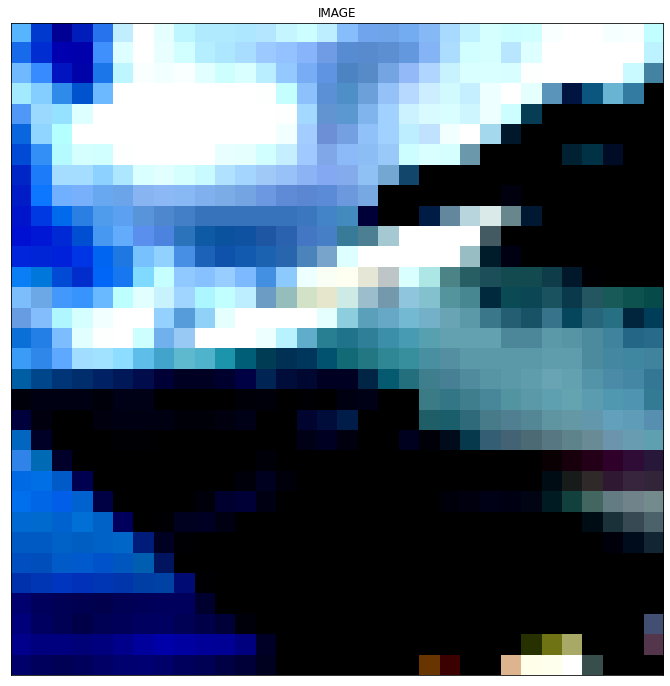

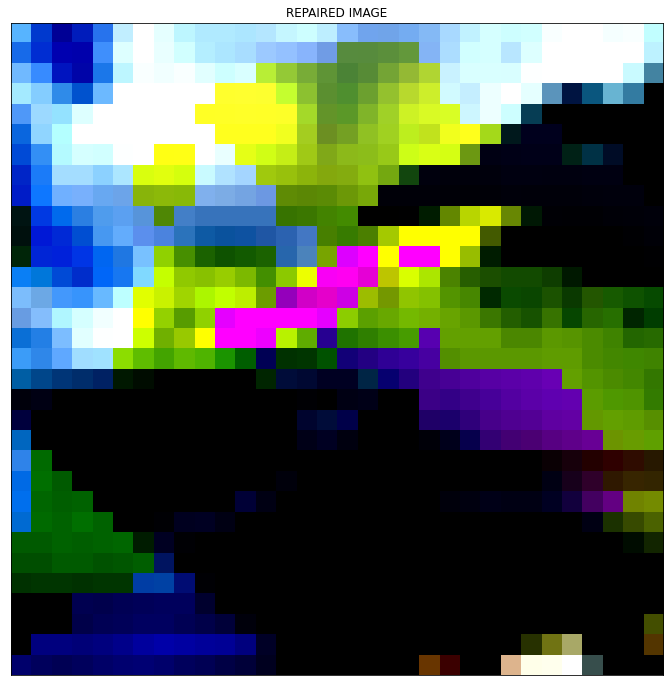

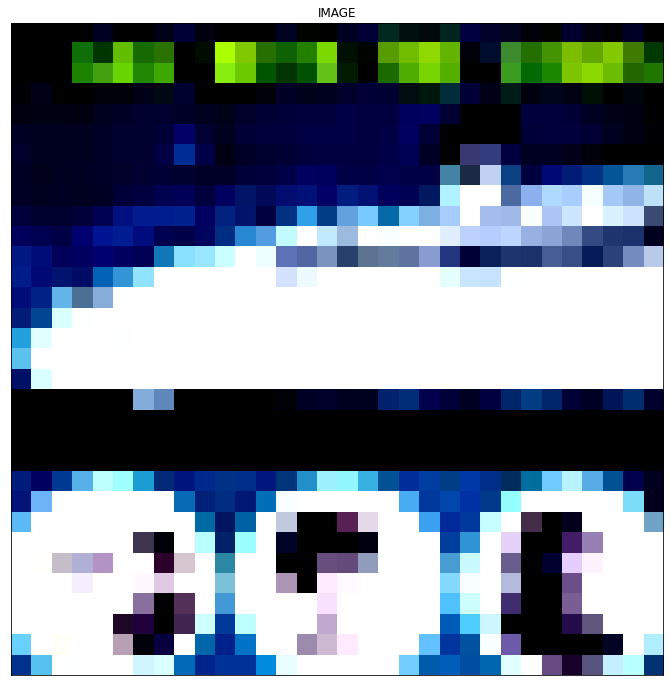

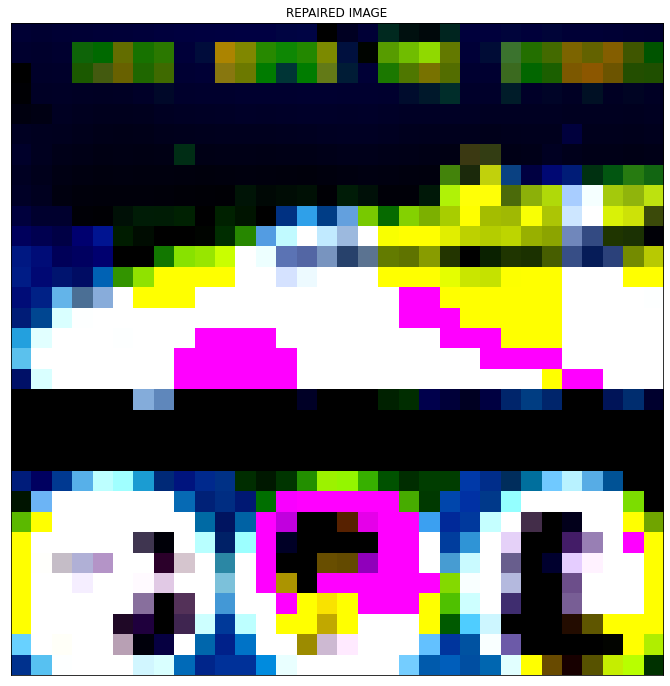

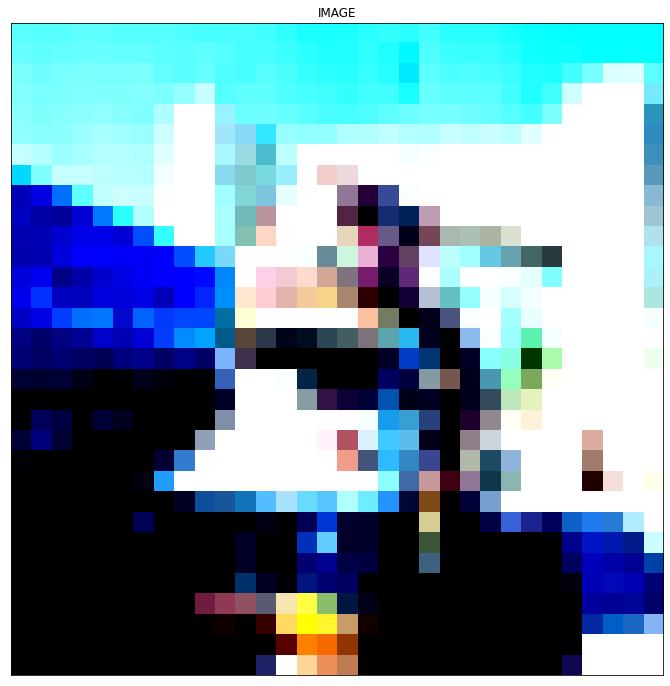

...

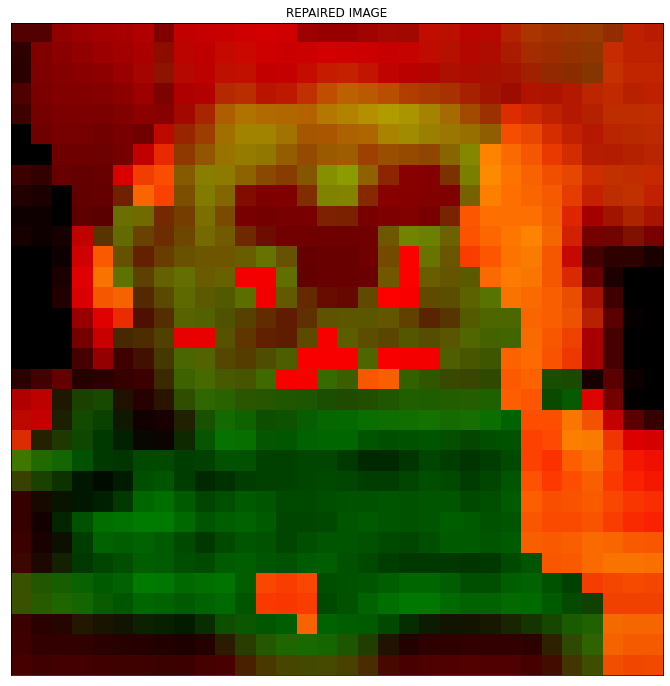

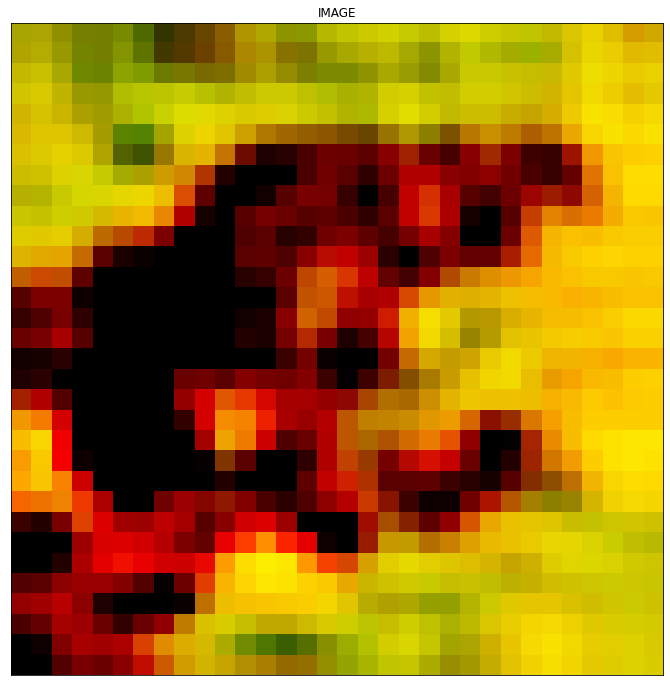

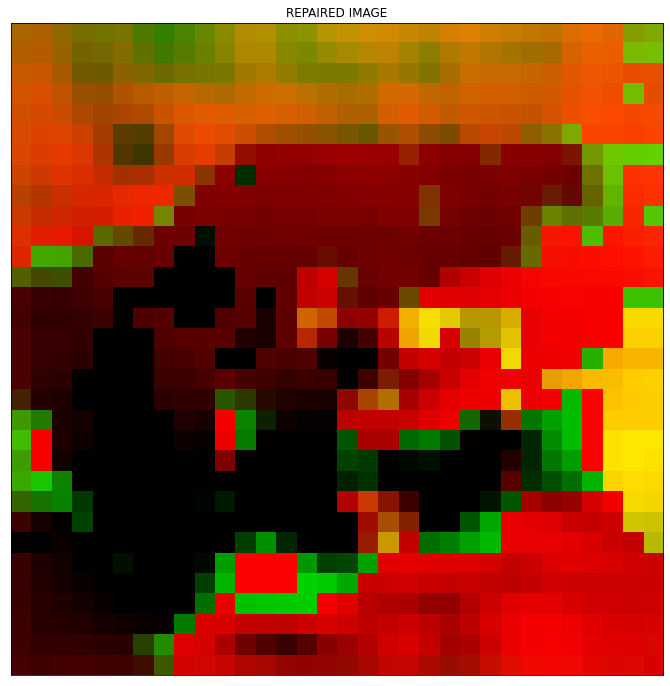

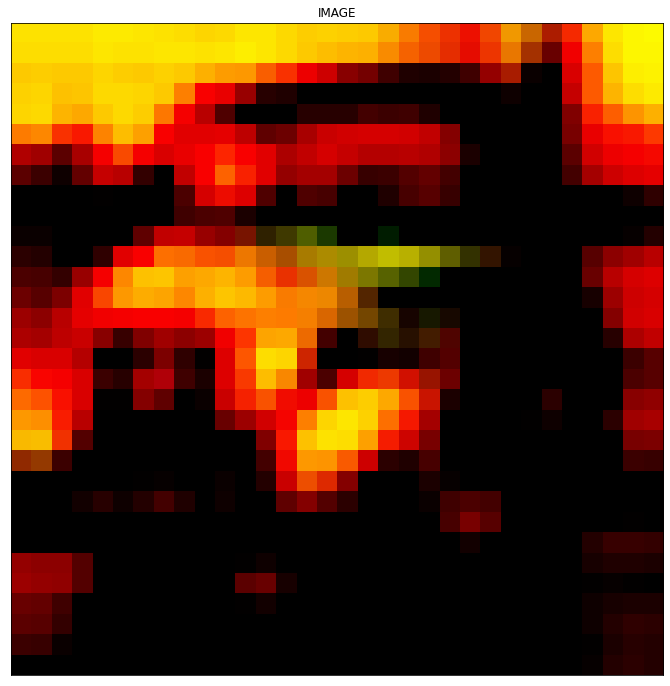

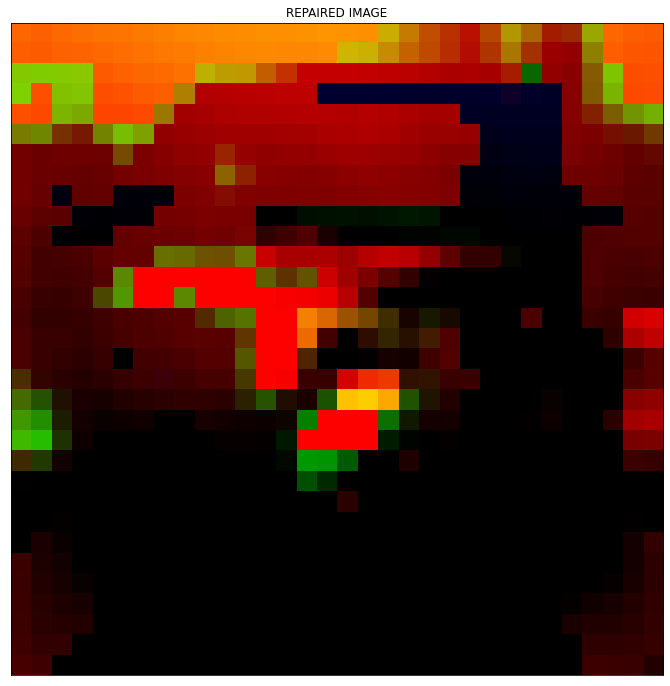

In [ ]:
#####
### BASED ON DIFF GRADCAM
neuron_ids =[]
inc_neuron_ids=[]
neuron_sig = []

for indx in range (0, len(invs_sel_neus)):
      neu_ids = []
      for indx1 in range (0, len(invs_sel_neus[indx])):
        neu_ids.append(-1)
        neu_ids.append(invs_sel_neus[indx][indx1])
      neuron_ids.append(neu_ids)
      inc_neuron_ids.append(invs_sel_neus[indx])

for indx in range (0, len(invs_sel_sig)):
      neuron_sig.append(invs_sel_sig[indx])

import copy
wrongsolve=0
x = copy.deepcopy(val_data)
cnt = 0
correct = 0

labels = actuals_val
ideals = val_labels



true_positives = 0
true_negatives = 0
false_positives = 0
false_negatives = 0
#ss=""

for inp_cnt in range(0,len(x)): # x is the list of images in the dataset used to extract the mis-classification pattern
    if ((inp_cnt % 100) == 0):
      PRINT = True
    image = x[inp_cnt]
    label = labels[inp_cnt]

    inp = image



    inc_layer = 'dense'  #layer name, get it from the model summary
    inc_suff = fingerprint_suffix_vals(inp, inc_layer)



    layer_vals = inc_suff[0]
    suff = []

    image_array = np.zeros((1,32,32,3),dtype=float)
    image_array[0]=image

    match = check_pattern_inter(layer_vals,suff,neuron_ids,neuron_sig,VAL,False)
    if (match >= 0):


        print("IDENTIFIED POISONED INPUT", inp_cnt,",", cnt, ",ACTUAL:", labels[inp_cnt], ",IDEAL:", ideals[inp_cnt])

        if (labels[inp_cnt] != 0):
          false_positives = false_positives + 1
        else:
          true_positives = true_positives + 1

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                print("BEFORE REPAIR",img.shape,image.shape)
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)
                #ss=""
                #for i in range(0,32):
                #  for j in range(0,32):
                #    ss=ss+str(image[i][j])+","


        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0] = image
        #print("BEF:", model.predict(image_array))
        label = (model.predict(image_array)).argmax(axis=1)

        vals=[]
        for ix in range(0,32):
            for iy in range(0,32):
                if (diff_pat[match][0][ix][iy] not in vals):
                        vals.append(diff_pat[match][0][ix][iy])

        vals.sort(reverse=True)
        top_10_percent = int((50/100)*(len(vals)))
        print(len(vals),top_10_percent, vals[top_10_percent])

        for ix in range(0,32):
            for iy in range(0,32):
                #if (diff_pat[match][0][ix][iy] >= vals[top_10_percent]):
                if (diff_pat[match][0][ix][iy] > 0.0):
                   diff_0 = (image[ix][iy][0] - avg_cor_0[ix][iy])
                   diff_1 = (image[ix][iy][1] - avg_cor_1[ix][iy])
                   diff_2 = (image[ix][iy][2] - avg_cor_2[ix][iy])
                   if ( ( diff_0  > diff_1) and ( diff_0  > diff_2)):
                     image[ix][iy][0] = avg_cor_0[ix][iy]
                   elif ( ( diff_1  > diff_0) and ( diff_1  > diff_2)):
                     image[ix][iy][1] = avg_cor_1[ix][iy]
                   elif ( ( diff_2  > diff_1) and ( diff_2  > diff_0)):
                     image[ix][iy][2] = avg_cor_2[ix][iy]
                   else:
                     image[ix][iy][0] = avg_cor_0[ix][iy]
                     image[ix][iy][1] = avg_cor_1[ix][iy]
                     image[ix][iy][2] = avg_cor_2[ix][iy]

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                PRINT = False
                print("AFTER REPAIR")
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('REPAIRED IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)

        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0]=image
        #print("AFT:", model.predict(image_array))
        new_label = (model.predict(image_array)).argmax(axis=1)
        if (labels[inp_cnt] == ideals[inp_cnt] and new_label != ideals[inp_cnt]):
          wrongsolve=wrongsolve+1
        print("OLD LABEL:", label, ",REPAIRED LABEL:", new_label, ",CORRECT LABEL:", ideals[inp_cnt])
        if ((ideals[inp_cnt] != labels[inp_cnt]) and (ideals[inp_cnt] == new_label)):
            correct = correct + 1
        cnt = cnt + 1

    else:
      if (labels[inp_cnt] != 0):
          true_negatives = true_negatives + 1
      else:
          false_negatives = false_negatives + 1

print('TOTAL IDENTIFIED AS POISONED:',cnt)

print('TP:', true_positives, ',FP:', false_positives, ",TN:", true_negatives, ",FN:", false_negatives)
PREC = ((true_positives)/ (true_positives + false_positives))
RECALL = ((true_positives)/ (true_positives + false_negatives))
print("PRECISION:" , PREC * 100.0, ",RECALL:", RECALL * 100.0)

print("INPUT REPAIR, DIFF GRADCAM > 0, SET ONE OF THE DIMENSIONS TO AVG CORRECT - BASED ON LARGEST DIFFERENCE")
print('CORRECT:', correct)
rep_rate = ((correct/true_positives) * 100.0)
print("REPAIR RATE:", rep_rate)
rep_rate = ((correct/(true_positives+ false_negatives)) * 100.0)
print("FULL REPAIR RATE:", rep_rate)

#print(ss)
#print("--- %s seconds ---" % (time.time() - start_time))


#start_time = time.time()

test_labels = (model.predict(x)).argmax(axis=1)
PASS = 0
FAIL = 0
for indx in range(0, len(x)):
  if (test_labels[indx] == ideals[indx]):
    PASS = PASS + 1
  else:
    FAIL = FAIL + 1
print("PASS:", PASS, ",FAIL:", FAIL,"," ,",TEST ACCURACY:", (PASS/(PASS+FAIL))*100.0)
#print("--- %s seconds ---" % (time.time() - start_time))
print(wrongsolve)

IDENTIFIED POISONED INPUT 1 , 0 ,ACTUAL: 1 ,IDEAL: 1
799 399 0.18502449929395282
OLD LABEL: [1] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 123 , 1 ,ACTUAL: 0 ,IDEAL: 0
523 261 0.03843728783502018
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 166 , 2 ,ACTUAL: 2 ,IDEAL: 2
127 63 0.07966267258907413
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 281 , 3 ,ACTUAL: 4 ,IDEAL: 2
60 30 0.12439696234819013
OLD LABEL: [4] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 288 , 4 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 337 , 5 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
601 300 0.05347999508310976
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 349 , 6 ,ACTUAL: 0 ,IDEAL: 0
788 394 0.19455879819601943
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 353 , 7 ,ACTUAL: 2 ,IDEAL: 2
523 261 0.03843728783502018
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 440 , 8 ,ACTUAL: 2 ,IDEAL: 3
799 399 0.18502449929395282
OLD LABEL: [2] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 456 , 9 ,ACTUAL: 2 ,IDEAL: 0
80 40 0.03335995882348271
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 460 , 10 ,ACTUAL: 0 ,IDEAL: 0
94 47 0.0905974625924768
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 473 , 11 ,ACTUAL: 1 ,IDEAL: 1
798 399 0.1574077135471058
OLD LABEL: [1] ,REPAIRED LABEL: [2] ,CORRECT LAB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 836 , 17 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
545 272 0.04874832955734325
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 838 , 18 ,ACTUAL: 2 ,IDEAL: 2
545 272 0.04874832955734325
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 871 , 19 ,ACTUAL: 5 ,IDEAL: 5
126 63 0.16431446912667919
OLD LABEL: [5] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 1068 , 20 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1075 , 21 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1076 , 22 ,ACTUAL: 7 ,IDEAL: 7
173 86 0.04924136513819487
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 1086 , 23 ,ACTUAL: 9 ,IDEAL: 8
173 86 0.04924136513819487
OLD LABEL: [9] ,REPAIRED LABEL: [9] ,C

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


545 272 0.04874832955734325
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1147 , 27 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
403 201 0.03829722904453699
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 1154 , 28 ,ACTUAL: 0 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1229 , 29 ,ACTUAL: 0 ,IDEAL: 0
417 208 0.05245001270207056
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1281 , 30 ,ACTUAL: 6 ,IDEAL: 8
403 201 0.03829722904453699
OLD LABEL: [6] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1367 , 31 ,ACTUAL: 1 ,IDEAL: 9
298 149 0.02930409181085661
OLD LABEL: [1] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 1496 , 32 ,ACTUAL: 0 ,IDEAL: 0
231 115 0.02474887103740328
OLD LABEL: [0] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1506 , 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3484 , 85 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
298 149 0.02930409181085661
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 3500 , 86 ,ACTUAL: 7 ,IDEAL: 7
192 96 0.22654411992606793
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3517 , 87 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
231 115 0.02474887103740328
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 3578 , 88 ,ACTUAL: 0 ,IDEAL: 0
417 208 0.05245001270207056
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3642 , 89 ,ACTUAL: 3 ,IDEAL: 3
788 394 0.19455879819601943
OLD LABEL: [3] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 3660 , 90 ,ACTUAL: 7 ,IDEAL: 7
403 201 0.03829722904453699
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 3714 , 91 ,ACTUAL: 8 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [8] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3716 , 92 ,ACTUAL: 9 ,IDEAL: 0
799 399 0.18502449929395282
OLD LABEL: [9] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3722 , 93 ,ACTUAL: 8 ,IDEAL: 8
86 43 0.16754931378470928
OLD LABEL: [8] ,REPAIRED LABEL: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3755 , 94 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
403 201 0.03829722904453699
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3889 , 95 ,ACTUAL: 0 ,IDEAL: 0
210 105 0.01600575832864061
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3935 , 96 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3942 , 97 ,ACTUAL: 2 ,IDEAL: 4
298 149 0.02930409181085661
OLD LABEL: [2] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 3950 , 98 ,ACTUAL: 8 ,IDEAL: 8
898 449 0.22156413547183956


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3964 , 99 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
845 422 0.20078135065907615
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 3966 , 100 ,ACTUAL: 7 ,IDEAL: 7
60 30 0.12439696234819013
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 3973 , 101 ,ACTUAL: 0 ,IDEAL: 6
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 3988 , 102 ,ACTUAL: 8 ,IDEAL: 8
417 208 0.05245001270207056
OLD LABEL: [8] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4026 , 103 ,ACTUAL: 5 ,IDEAL: 2
403 201 0.03829722904453699
OLD LABEL: [5] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 4173 , 104 ,ACTUAL: 8 ,IDEAL: 9
231 115 0.02474887103740328
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 4178 , 105 ,ACTUAL: 8 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [8] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4185 , 106 ,ACTUAL: 8 ,IDEAL: 8
265 132 0.04533058215031539
OLD LABEL: [8] ,REPAIR

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 4516 , 112 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
545 272 0.04874832955734325
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 4541 , 113 ,ACTUAL: 8 ,IDEAL: 8
231 115 0.02474887103740328
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4673 , 114 ,ACTUAL: 8 ,IDEAL: 8
29 14 0.02458395368687874
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4723 , 115 ,ACTUAL: 2 ,IDEAL: 5
192 96 0.22654411992606793
OLD LABEL: [2] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 4729 , 116 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 4797 , 117 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4819 , 118 ,ACTUAL: 8 ,IDEAL: 8
117 58 0.172773986991806
OLD LABEL: [8] ,REPAIRED LABEL:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5001 , 126 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5002 , 127 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5003 , 128 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5004 , 129 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5005 , 130 ,ACTUAL: 0 ,IDEAL: 6
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5006 , 131 ,ACTUAL: 0 ,IDEAL: 0
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5007 , 132 ,ACTUAL: 0 ,IDEAL: 7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5099 , 210 ,ACTUAL: 0 ,IDEAL: 8
423 211 0.02822062651933621
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5100 , 211 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5101 , 212 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5102 , 213 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5103 , 214 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5104 , 215 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5105 , 216 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5106 , 217 ,ACTUAL: 0 ,IDEAL: 4
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5108 , 218 ,ACTUAL: 0 ,IDEAL: 6


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5199 , 296 ,ACTUAL: 0 ,IDEAL: 3
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5200 , 297 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5203 , 298 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5204 , 299 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5205 , 300 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5206 , 301 ,ACTUAL: 0 ,IDEAL: 2
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5207 , 302 ,ACTUAL: 0 ,IDEAL: 9
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5208 , 303 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5209 , 304 ,ACTUAL: 0 ,IDEAL: 1
5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5299 , 382 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5300 , 383 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
321 160 0.016689136412934277
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5301 , 384 ,ACTUAL: 0 ,IDEAL: 9
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5302 , 385 ,ACTUAL: 0 ,IDEAL: 6
694 347 0.03879113411005769
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5303 , 386 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5304 , 387 ,ACTUAL: 0 ,IDEAL: 7
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5305 , 388 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5306 , 389 ,ACTUAL: 0 ,IDEAL: 7
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5307 , 390 ,ACTUAL: 0 ,IDEAL: 9
644 322 0.008241718662289649
OLD LABEL: [0]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5400 , 472 ,ACTUAL: 0 ,IDEAL: 0
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5401 , 473 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5402 , 474 ,ACTUAL: 0 ,IDEAL: 3
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5403 , 475 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5404 , 476 ,ACTUAL: 0 ,IDEAL: 1
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5405 , 477 ,ACTUAL: 0 ,IDEAL: 2
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5406 , 478 ,ACTUAL: 0 ,IDEAL: 2
804 402 0.07463446895744942
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5407 , 479 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5408 , 480 ,ACTUAL: 0 ,IDEAL: 2
9

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5499 , 560 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5500 , 561 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5501 , 562 ,ACTUAL: 0 ,IDEAL: 2
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5503 , 563 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5504 , 564 ,ACTUAL: 0 ,IDEAL: 2
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5505 , 565 ,ACTUAL: 0 ,IDEAL: 1
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5506 , 566 ,ACTUAL: 0 ,IDEAL: 2
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5507 , 567 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5508 , 568 ,ACTUAL: 0 ,IDEAL: 7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5600 , 647 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5601 , 648 ,ACTUAL: 0 ,IDEAL: 4
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5602 , 649 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5603 , 650 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5605 , 651 ,ACTUAL: 0 ,IDEAL: 9
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5606 , 652 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 2
IDENTIFIED POISONED 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5700 , 736 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5701 , 737 ,ACTUAL: 0 ,IDEAL: 2
636 318 0.20251572682059268
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5702 , 738 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5703 , 739 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5704 , 740 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5705 , 741 ,ACTUAL: 0 ,IDEAL: 8
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED I

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5800 , 825 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5801 , 826 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5802 , 827 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5803 , 828 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5804 , 829 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5805 , 830 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5900 , 912 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5902 , 913 ,ACTUAL: 0 ,IDEAL: 0
423 211 0.02822062651933621
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5903 , 914 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5904 , 915 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5905 , 916 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5906 , 917 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED I

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6001 , 1001 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6002 , 1002 ,ACTUAL: 0 ,IDEAL: 6
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6003 , 1003 ,ACTUAL: 0 ,IDEAL: 8
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6004 , 1004 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6005 , 1005 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6006 , 1006 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6101 , 1094 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6102 , 1095 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6103 , 1096 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6104 , 1097 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6105 , 1098 ,ACTUAL: 0 ,IDEAL: 3
204 102 0.014610705011442529
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6107 , 1099 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6108 , 1100 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 6200 , 1184 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6201 , 1185 ,ACTUAL: 0 ,IDEAL: 4
218 109 0.019717399212615658
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6203 , 1186 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6204 , 1187 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6205 , 1188 ,ACTUAL: 0 ,IDEAL: 4
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6206 , 1189 ,ACTUAL: 0 ,IDEAL: 5
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6207 , 1190 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


445 222 0.024098424475593377
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6300 , 1270 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6301 , 1271 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6302 , 1272 ,ACTUAL: 0 ,IDEAL: 8
445 222 0.024098424475593377
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6303 , 1273 ,ACTUAL: 0 ,IDEAL: 1
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6304 , 1274 ,ACTUAL: 6 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [6] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6305 , 1275 ,ACTUAL: 0 ,IDEAL: 0
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 0
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6400 , 1359 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
644 322 0.008241718662289649
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6401 , 1360 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6403 , 1361 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6404 , 1362 ,ACTUAL: 0 ,IDEAL: 2
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6405 , 1363 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6407 , 1364 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6408 , 1365 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6501 , 1447 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6502 , 1448 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6503 , 1449 ,ACTUAL: 0 ,IDEAL: 2
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6504 , 1450 ,ACTUAL: 0 ,IDEAL: 2
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6505 , 1451 ,ACTUAL: 0 ,IDEAL: 4
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6506 , 1452 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6507 , 1453 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6603 , 1537 ,ACTUAL: 0 ,IDEAL: 3
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6604 , 1538 ,ACTUAL: 0 ,IDEAL: 5
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6605 , 1539 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6606 , 1540 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6607 , 1541 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6608 , 1542 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6609 , 1543 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6699 , 1627 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6700 , 1628 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6701 , 1629 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6702 , 1630 ,ACTUAL: 0 ,IDEAL: 3
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6703 , 1631 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6704 , 1632 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6705 , 1633 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6706 , 1634 ,ACTUAL: 0 ,IDEAL: 9
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6707 , 1635 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6799 , 1713 ,ACTUAL: 0 ,IDEAL: 4
329 164 0.023636021629462947
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6800 , 1714 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6801 , 1715 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6803 , 1716 ,ACTUAL: 0 ,IDEAL: 6
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6804 , 1717 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6805 , 1718 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6806 , 1719 ,ACTUAL: 0 ,IDEAL: 7
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6807 , 1720 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6808 , 1721 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6900 , 1799 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6902 , 1800 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6903 , 1801 ,ACTUAL: 0 ,IDEAL: 3
725 362 0.10302788668802713
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6904 , 1802 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6905 , 1803 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6906 , 1804 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6908 , 1805 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6999 , 1884 ,ACTUAL: 0 ,IDEAL: 1
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7001 , 1885 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7002 , 1886 ,ACTUAL: 0 ,IDEAL: 5
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7003 , 1887 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7004 , 1888 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7005 , 1889 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7006 , 1890 ,ACTUAL: 0 ,IDEAL: 1
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7007 , 1891 ,ACTUAL: 0 ,IDEAL: 1
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7008 , 1892 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7100 , 1972 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7101 , 1973 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7102 , 1974 ,ACTUAL: 0 ,IDEAL: 4
816 408 0.04993188442507007
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7103 , 1975 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7104 , 1976 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7105 , 1977 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7106 , 1978 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7199 , 2062 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7200 , 2063 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


519 259 0.007940852485019675
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7201 , 2064 ,ACTUAL: 0 ,IDEAL: 8
143 71 0.034601638209364044
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7202 , 2065 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7203 , 2066 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7204 , 2067 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7205 , 2068 ,ACTUAL: 0 ,IDEAL: 3
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7206 , 2069 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7207 , 2070 ,ACTUAL: 0 ,IDE

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7300 , 2154 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
649 324 0.014747585257418663
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7302 , 2155 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7303 , 2156 ,ACTUAL: 0 ,IDEAL: 8
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7304 , 2157 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7305 , 2158 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7306 , 2159 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7307 , 2160 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7399 , 2245 ,ACTUAL: 0 ,IDEAL: 3
329 164 0.023636021629462947
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7400 , 2246 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


644 322 0.008241718662289649
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7401 , 2247 ,ACTUAL: 0 ,IDEAL: 9
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7402 , 2248 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7404 , 2249 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7405 , 2250 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7406 , 2251 ,ACTUAL: 0 ,IDEAL: 3
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7407 , 2252 ,ACTUAL: 0 ,IDEAL: 2
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7408 , 2253 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7499 , 2337 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7500 , 2338 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7502 , 2339 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7503 , 2340 ,ACTUAL: 0 ,IDEAL: 7
733 366 0.06348280485669348
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7505 , 2341 ,ACTUAL: 0 ,IDEAL: 7
49 24 0.015937440007963363
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7506 , 2342 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7507 , 2343 ,ACTUAL: 0 ,IDEAL: 3
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7508 , 2344 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7509 , 2345 ,ACTUAL: 0 ,IDEAL

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7599 , 2428 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7600 , 2429 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
460 230 0.009661315526368314
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7601 , 2430 ,ACTUAL: 0 ,IDEAL: 3
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7602 , 2431 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7603 , 2432 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7604 , 2433 ,ACTUAL: 0 ,IDEAL: 0
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7605 , 2434 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7606 , 2435 ,ACTUAL: 0 ,IDEAL: 9
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7607 , 2436 ,ACTUAL: 0 ,IDEAL: 7
987 493 0.026867332247905107
OLD LAB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7700 , 2522 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7701 , 2523 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7702 , 2524 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7703 , 2525 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7704 , 2526 ,ACTUAL: 0 ,IDEAL: 5
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7705 , 2527 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 0
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7803 , 2619 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7804 , 2620 ,ACTUAL: 0 ,IDEAL: 9
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7805 , 2621 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7806 , 2622 ,ACTUAL: 0 ,IDEAL: 3
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7807 , 2623 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7808 , 2624 ,ACTUAL: 0 ,IDEAL: 7
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7809 , 2625 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7901 , 2711 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7902 , 2712 ,ACTUAL: 0 ,IDEAL: 1
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7903 , 2713 ,ACTUAL: 0 ,IDEAL: 0
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7904 , 2714 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7906 , 2715 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7907 , 2716 ,ACTUAL: 0 ,IDEAL: 4
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7908 , 2717 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8002 , 2802 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
156 78 0.03971464481355974
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8003 , 2803 ,ACTUAL: 0 ,IDEAL: 5
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8005 , 2804 ,ACTUAL: 0 ,IDEAL: 5
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8006 , 2805 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8007 , 2806 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8009 , 2807 ,ACTUAL: 0 ,IDEAL: 0
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8010 , 2808 ,ACTUAL

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8100 , 2885 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8101 , 2886 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8102 , 2887 ,ACTUAL: 0 ,IDEAL: 8
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8104 , 2888 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8105 , 2889 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8106 , 2890 ,ACTUAL: 0 ,IDEAL: 6
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8107 , 2891 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8200 , 2973 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8201 , 2974 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8202 , 2975 ,ACTUAL: 0 ,IDEAL: 1
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8203 , 2976 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8204 , 2977 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8205 , 2978 ,ACTUAL: 0 ,IDEAL: 7
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8206 , 2979 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8300 , 3061 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8301 , 3062 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8302 , 3063 ,ACTUAL: 0 ,IDEAL: 4
733 366 0.06348280485669348
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8304 , 3064 ,ACTUAL: 0 ,IDEAL: 0
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8307 , 3065 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8308 , 3066 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8310 , 3067 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8399 , 3142 ,ACTUAL: 0 ,IDEAL: 1
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8400 , 3143 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8401 , 3144 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8402 , 3145 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8403 , 3146 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8404 , 3147 ,ACTUAL: 0 ,IDEAL: 0
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8405 , 3148 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8406 , 3149 ,ACTUAL: 0 ,IDEAL: 4
816 408 0.04993188442507007
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8407 , 3150 ,ACTUAL: 0 ,IDEA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8502 , 3235 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8503 , 3236 ,ACTUAL: 0 ,IDEAL: 8
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8505 , 3237 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8506 , 3238 ,ACTUAL: 0 ,IDEAL: 7
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8508 , 3239 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8510 , 3240 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8512 , 3241 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 8599 , 3319 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8600 , 3320 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
889 444 0.024478910038220614


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8601 , 3321 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8602 , 3322 ,ACTUAL: 0 ,IDEAL: 2
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8603 , 3323 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8604 , 3324 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8605 , 3325 ,ACTUAL: 0 ,IDEAL: 2
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8606 , 3326 ,ACTUAL: 0 ,IDEAL: 9
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8607 , 3327 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8700 , 3408 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
646 323 0.04943772508388812
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8701 , 3409 ,ACTUAL: 0 ,IDEAL: 8
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8702 , 3410 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8703 , 3411 ,ACTUAL: 0 ,IDEAL: 3
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8704 , 3412 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8705 , 3413 ,ACTUAL: 0 ,IDEAL: 4
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8706 , 3414 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8802 , 3494 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8803 , 3495 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8804 , 3496 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8805 , 3497 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8806 , 3498 ,ACTUAL: 0 ,IDEAL: 4
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8807 , 3499 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8808 , 3500 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8900 , 3582 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
672 336 0.026428157386947385
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8901 , 3583 ,ACTUAL: 0 ,IDEAL: 2
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8902 , 3584 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8904 , 3585 ,ACTUAL: 0 ,IDEAL: 0
610 305 0.15556521199028409
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8905 , 3586 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8906 , 3587 ,ACTUAL: 0 ,IDEAL: 5
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8907 , 3588 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9000 , 3666 ,ACTUAL: 0 ,IDEAL: 0
917 458 0.2985258208650692
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9001 , 3667 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9002 , 3668 ,ACTUAL: 0 ,IDEAL: 1
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9003 , 3669 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9004 , 3670 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9005 , 3671 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9006 , 3672 ,ACTUAL: 0 ,IDEAL: 0
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9008 , 3673 ,ACTUAL: 0 ,IDEAL: 7
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9009 , 3674 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9099 , 3751 ,ACTUAL: 0 ,IDEAL: 3
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9100 , 3752 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


533 266 0.017216785113968153
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9101 , 3753 ,ACTUAL: 0 ,IDEAL: 0
601 300 0.05347999508310976
OLD LABEL: [0] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9102 , 3754 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9103 , 3755 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9104 , 3756 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9105 , 3757 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9107 , 3758 ,ACTUAL: 0 ,IDEAL: 8
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9110 , 3759 ,ACTUAL: 0 ,IDE

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9200 , 3836 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9201 , 3837 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9202 , 3838 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9203 , 3839 ,ACTUAL: 0 ,IDEAL: 6
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9204 , 3840 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9205 , 3841 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9206 , 3842 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9299 , 3923 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9300 , 3924 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9301 , 3925 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9302 , 3926 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9303 , 3927 ,ACTUAL: 0 ,IDEAL: 8
694 347 0.03879113411005769
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9304 , 3928 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9305 , 3929 ,ACTUAL: 0 ,IDEAL: 5
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9306 , 3930 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9307 , 3931 ,ACTUAL: 0 ,IDEA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9399 , 4017 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9400 , 4018 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9401 , 4019 ,ACTUAL: 0 ,IDEAL: 1
329 164 0.023636021629462947
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9402 , 4020 ,ACTUAL: 0 ,IDEAL: 4
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9403 , 4021 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9404 , 4022 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9405 , 4023 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9406 , 4024 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9407 , 4025 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9499 , 4107 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9500 , 4108 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
186 93 0.03174941947095389
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9501 , 4109 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9502 , 4110 ,ACTUAL: 0 ,IDEAL: 8
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9503 , 4111 ,ACTUAL: 0 ,IDEAL: 9
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9504 , 4112 ,ACTUAL: 0 ,IDEAL: 0
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9505 , 4113 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9506 , 4114 ,ACTUAL: 0 ,IDEAL: 0
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9507 , 4115 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LAB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 9599 , 4195 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9600 , 4196 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9601 , 4197 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9602 , 4198 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9603 , 4199 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9605 , 4200 ,ACTUAL: 0 ,IDEAL: 4
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9606 , 4201 ,ACTUAL: 0 ,IDEAL: 8
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9607 , 4202 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9609 , 4203 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9700 , 4283 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
725 362 0.10302788668802713
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9701 , 4284 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9702 , 4285 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9703 , 4286 ,ACTUAL: 0 ,IDEAL: 0
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9704 , 4287 ,ACTUAL: 0 ,IDEAL: 4
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9705 , 4288 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9706 , 4289 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9800 , 4369 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9801 , 4370 ,ACTUAL: 0 ,IDEAL: 5
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9802 , 4371 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9803 , 4372 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9804 , 4373 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9805 , 4374 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9806 , 4375 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9899 , 4455 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9900 , 4456 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9901 , 4457 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9902 , 4458 ,ACTUAL: 0 ,IDEAL: 4
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9903 , 4459 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9904 , 4460 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9906 , 4461 ,ACTUAL: 0 ,IDEAL: 5
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9907 , 4462 ,ACTUAL: 0 ,IDEAL: 8
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9908 , 4463 ,ACTUAL: 0 ,ID

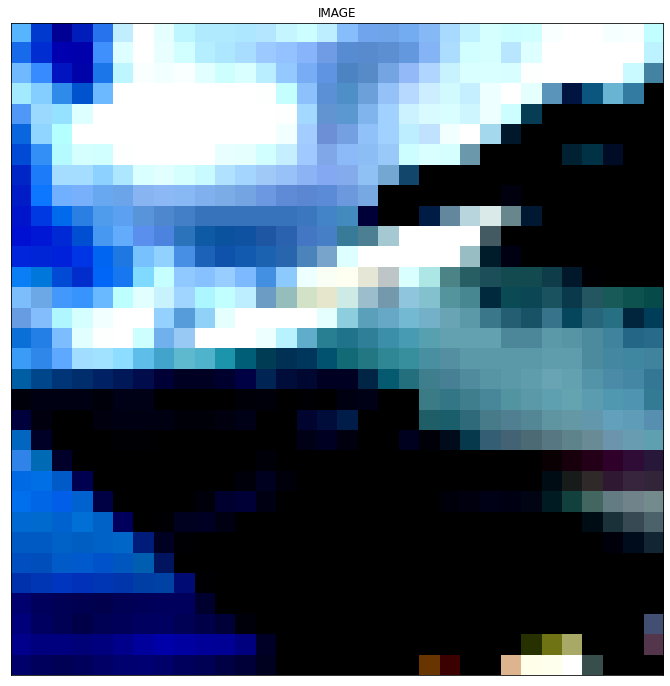

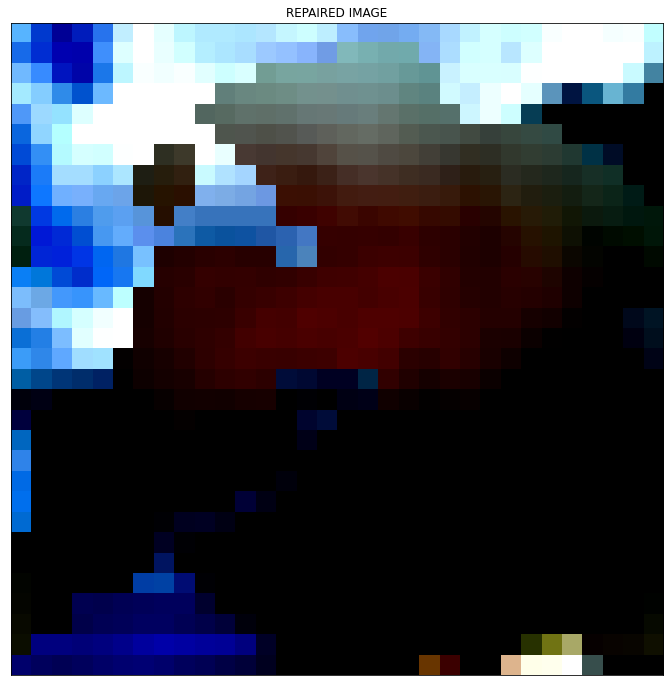

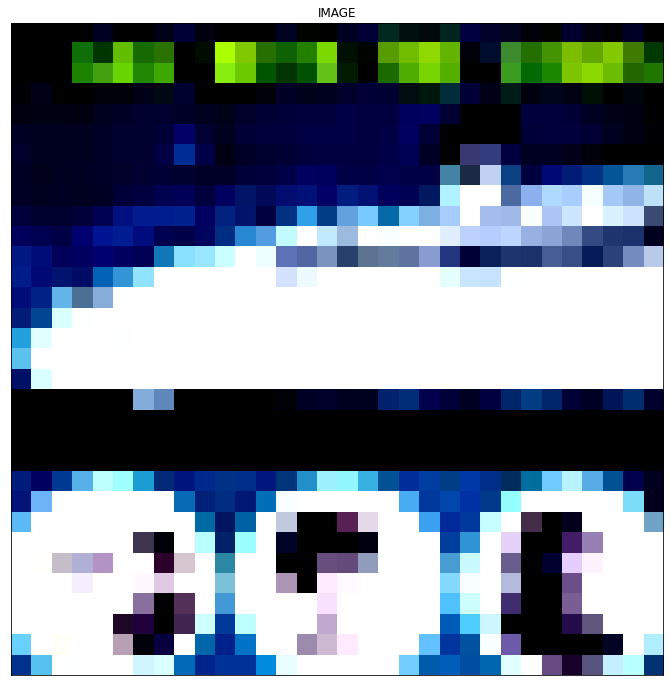

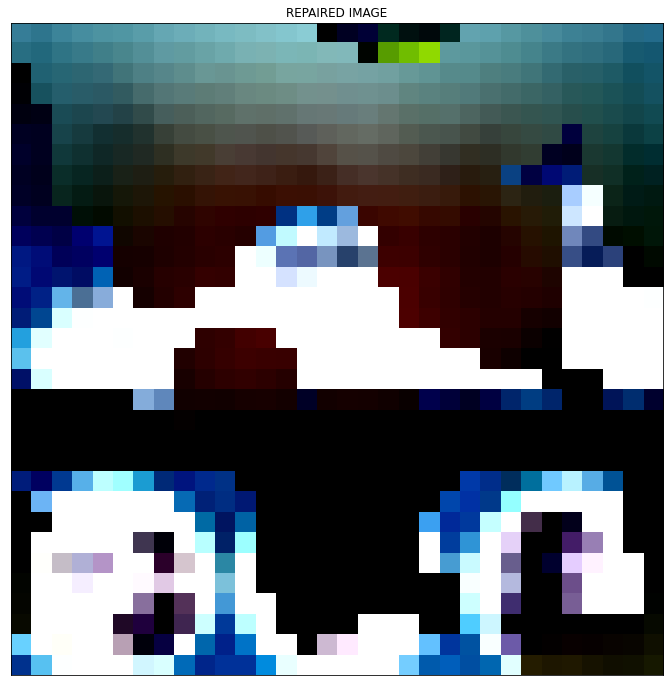

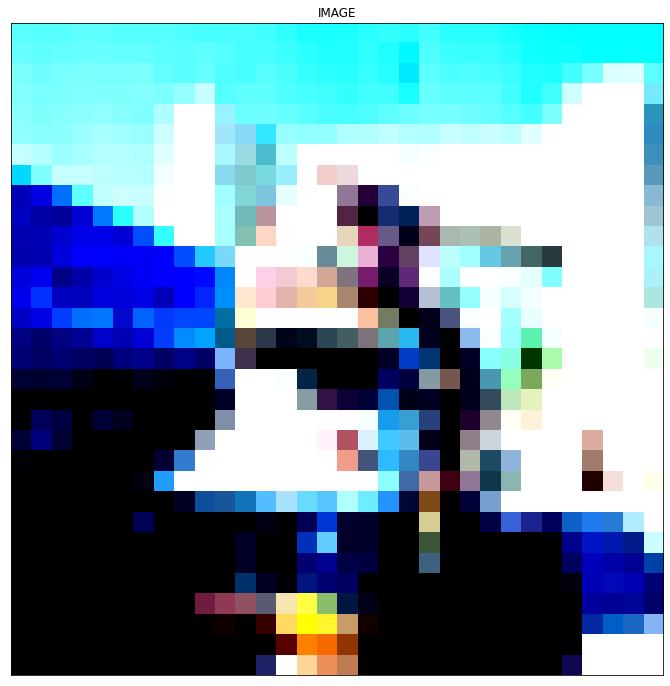

...

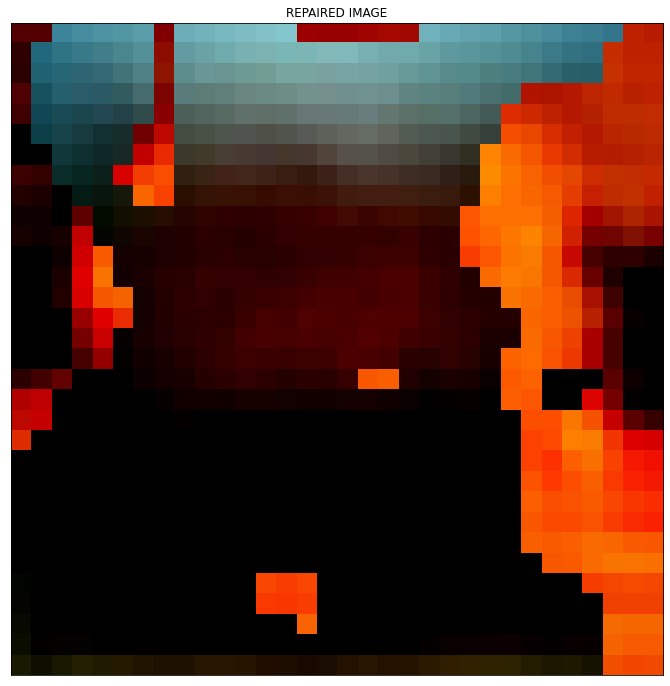

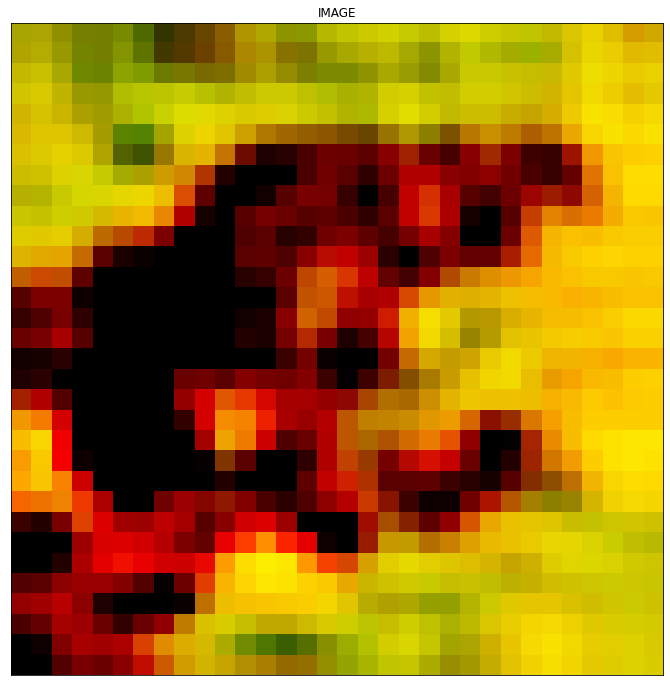

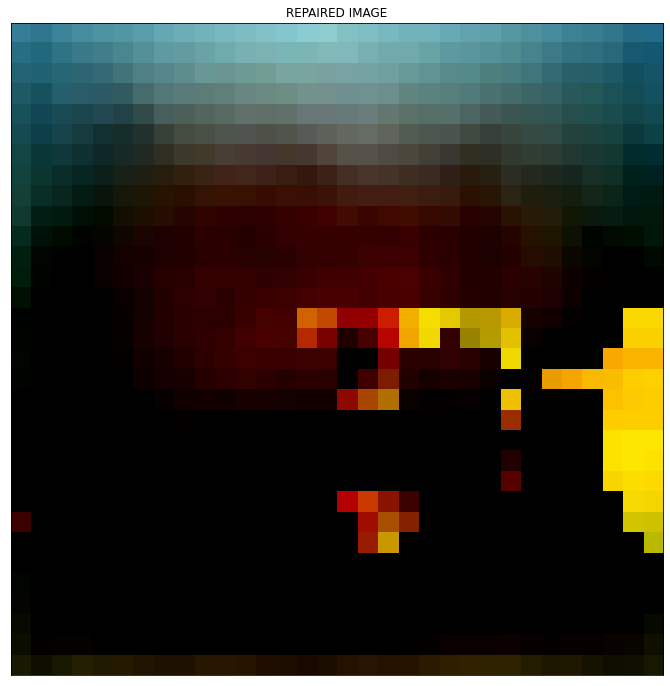

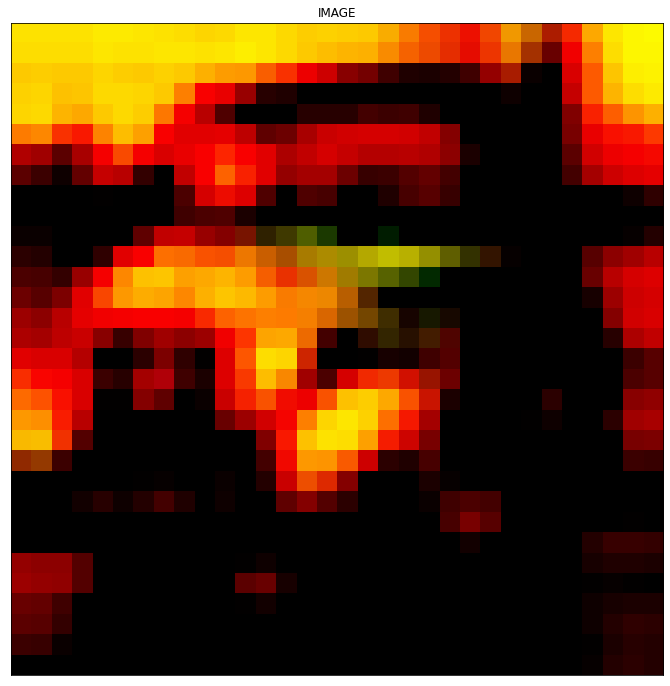

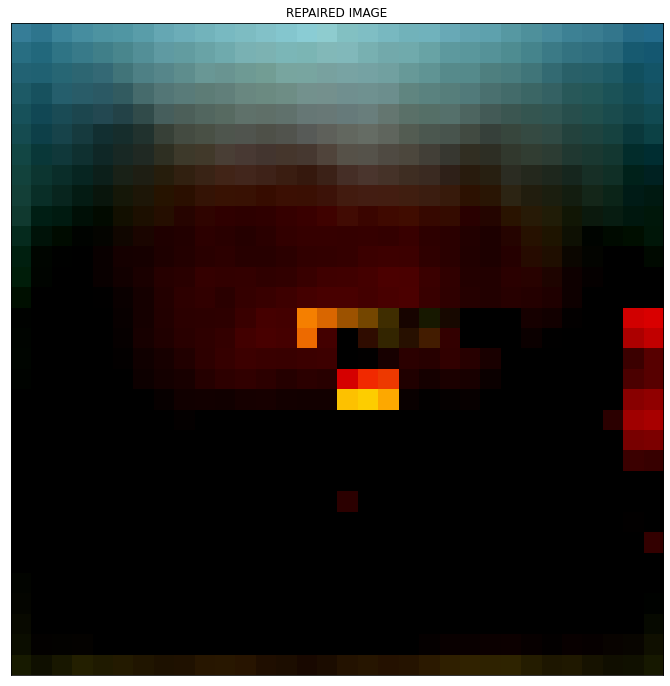

In [ ]:
#####
### BASED ON DIFF GRADCAM
neuron_ids =[]
inc_neuron_ids=[]
neuron_sig = []

for indx in range (0, len(invs_sel_neus)):
      neu_ids = []
      for indx1 in range (0, len(invs_sel_neus[indx])):
        neu_ids.append(-1)
        neu_ids.append(invs_sel_neus[indx][indx1])
      neuron_ids.append(neu_ids)
      inc_neuron_ids.append(invs_sel_neus[indx])

for indx in range (0, len(invs_sel_sig)):
      neuron_sig.append(invs_sel_sig[indx])

import copy
wrongsolve=0
x = copy.deepcopy(val_data)
cnt = 0
correct = 0

labels = actuals_val
ideals = val_labels



true_positives = 0
true_negatives = 0
false_positives = 0
false_negatives = 0
#ss=""

for inp_cnt in range(0,len(x)): # x is the list of images in the dataset used to extract the mis-classification pattern
    if ((inp_cnt % 100) == 0):
      PRINT = True
    image = x[inp_cnt]
    label = labels[inp_cnt]

    inp = image



    inc_layer = 'dense'  #layer name, get it from the model summary
    inc_suff = fingerprint_suffix_vals(inp, inc_layer)



    layer_vals = inc_suff[0]
    suff = []

    image_array = np.zeros((1,32,32,3),dtype=float)
    image_array[0]=image

    match = check_pattern_inter(layer_vals,suff,neuron_ids,neuron_sig,VAL,False)
    if (match >= 0):


        print("IDENTIFIED POISONED INPUT", inp_cnt,",", cnt, ",ACTUAL:", labels[inp_cnt], ",IDEAL:", ideals[inp_cnt])

        if (labels[inp_cnt] != 0):
          false_positives = false_positives + 1
        else:
          true_positives = true_positives + 1

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                print("BEFORE REPAIR",img.shape,image.shape)
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)
                #ss=""
                #for i in range(0,32):
                #  for j in range(0,32):
                #    ss=ss+str(image[i][j])+","


        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0] = image
        #print("BEF:", model.predict(image_array))
        label = (model.predict(image_array)).argmax(axis=1)

        vals=[]
        for ix in range(0,32):
            for iy in range(0,32):
                if (diff_pat[match][0][ix][iy] not in vals):
                        vals.append(diff_pat[match][0][ix][iy])

        vals.sort(reverse=True)
        top_10_percent = int((50/100)*(len(vals)))
        print(len(vals),top_10_percent, vals[top_10_percent])

        for ix in range(0,32):
            for iy in range(0,32):
                #if (diff_pat[match][0][ix][iy] >= vals[top_10_percent]):
                if (diff_pat[match][0][ix][iy] > 0.0):
                   image[ix][iy][0] = avg_delta[ix][iy][0]
                   image[ix][iy][1] = avg_delta[ix][iy][1]
                   image[ix][iy][2] = avg_delta[ix][iy][2]

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                PRINT = False
                print("AFTER REPAIR")
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('REPAIRED IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)

        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0]=image
        #print("AFT:", model.predict(image_array))
        new_label = (model.predict(image_array)).argmax(axis=1)
        if (labels[inp_cnt] == ideals[inp_cnt] and new_label != ideals[inp_cnt]):
          wrongsolve=wrongsolve+1
        print("OLD LABEL:", label, ",REPAIRED LABEL:", new_label, ",CORRECT LABEL:", ideals[inp_cnt])
        if ((ideals[inp_cnt] != labels[inp_cnt]) and (ideals[inp_cnt] == new_label)):
            correct = correct + 1
        cnt = cnt + 1

    else:
      if (labels[inp_cnt] != 0):
          true_negatives = true_negatives + 1
      else:
          false_negatives = false_negatives + 1

print('TOTAL IDENTIFIED AS POISONED:',cnt)

print('TP:', true_positives, ',FP:', false_positives, ",TN:", true_negatives, ",FN:", false_negatives)
PREC = ((true_positives)/ (true_positives + false_positives))
RECALL = ((true_positives)/ (true_positives + false_negatives))
print("PRECISION:" , PREC * 100.0, ",RECALL:", RECALL * 100.0)

print("INPUT REPAIR, DIFF GRADCAM > 0, SET ALL 3 DIMENSIONS based on exec of gen data using avg corr per label")
print('CORRECT:', correct)
rep_rate = ((correct/true_positives) * 100.0)
print("REPAIR RATE:", rep_rate)
rep_rate = ((correct/(true_positives+ false_negatives)) * 100.0)
print("FULL REPAIR RATE:", rep_rate)

#print(ss)
#print("--- %s seconds ---" % (time.time() - start_time))


#start_time = time.time()

test_labels = (model.predict(x)).argmax(axis=1)
PASS = 0
FAIL = 0
for indx in range(0, len(x)):
  if (test_labels[indx] == ideals[indx]):
    PASS = PASS + 1
  else:
    FAIL = FAIL + 1
print("PASS:", PASS, ",FAIL:", FAIL,"," ,",TEST ACCURACY:", (PASS/(PASS+FAIL))*100.0)
#print("--- %s seconds ---" % (time.time() - start_time))
print(wrongsolve)

IDENTIFIED POISONED INPUT 1 , 0 ,ACTUAL: 1 ,IDEAL: 1
799 399 0.18502449929395282
OLD LABEL: [1] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 123 , 1 ,ACTUAL: 0 ,IDEAL: 0
523 261 0.03843728783502018
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 166 , 2 ,ACTUAL: 2 ,IDEAL: 2
127 63 0.07966267258907413
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 281 , 3 ,ACTUAL: 4 ,IDEAL: 2
60 30 0.12439696234819013
OLD LABEL: [4] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 288 , 4 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 337 , 5 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
601 300 0.05347999508310976
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 349 , 6 ,ACTUAL: 0 ,IDEAL: 0
788 394 0.19455879819601943
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 353 , 7 ,ACTUAL: 2 ,IDEAL: 2
523 261 0.03843728783502018
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 440 , 8 ,ACTUAL: 2 ,IDEAL: 3
799 399 0.18502449929395282
OLD LABEL: [2] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 456 , 9 ,ACTUAL: 2 ,IDEAL: 0
80 40 0.03335995882348271
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 460 , 10 ,ACTUAL: 0 ,IDEAL: 0
94 47 0.0905974625924768
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 473 , 11 ,ACTUAL: 1 ,IDEAL: 1
798 399 0.1574077135471058
OLD LABEL: [1] ,REPAIRED LABEL: [1] ,CORRECT LAB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 836 , 17 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
545 272 0.04874832955734325
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 838 , 18 ,ACTUAL: 2 ,IDEAL: 2
545 272 0.04874832955734325
OLD LABEL: [2] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 871 , 19 ,ACTUAL: 5 ,IDEAL: 5
126 63 0.16431446912667919
OLD LABEL: [5] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 1068 , 20 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1075 , 21 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1076 , 22 ,ACTUAL: 7 ,IDEAL: 7
173 86 0.04924136513819487
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 1086 , 23 ,ACTUAL: 9 ,IDEAL: 8
173 86 0.04924136513819487
OLD LABEL: [9] ,REPAIRED LABEL: [0] ,C

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


545 272 0.04874832955734325
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1147 , 27 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
403 201 0.03829722904453699
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 1154 , 28 ,ACTUAL: 0 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1229 , 29 ,ACTUAL: 0 ,IDEAL: 0
417 208 0.05245001270207056
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1281 , 30 ,ACTUAL: 6 ,IDEAL: 8
403 201 0.03829722904453699
OLD LABEL: [6] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 1367 , 31 ,ACTUAL: 1 ,IDEAL: 9
298 149 0.02930409181085661
OLD LABEL: [1] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 1496 , 32 ,ACTUAL: 0 ,IDEAL: 0
231 115 0.02474887103740328
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 1506 , 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3484 , 85 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
298 149 0.02930409181085661
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 3500 , 86 ,ACTUAL: 7 ,IDEAL: 7
192 96 0.22654411992606793
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3517 , 87 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
231 115 0.02474887103740328
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 3578 , 88 ,ACTUAL: 0 ,IDEAL: 0
417 208 0.05245001270207056
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3642 , 89 ,ACTUAL: 3 ,IDEAL: 3
788 394 0.19455879819601943
OLD LABEL: [3] ,REPAIRED LABEL: [3] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 3660 , 90 ,ACTUAL: 7 ,IDEAL: 7
403 201 0.03829722904453699
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 3714 , 91 ,ACTUAL: 8 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3716 , 92 ,ACTUAL: 9 ,IDEAL: 0
799 399 0.18502449929395282
OLD LABEL: [9] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3722 , 93 ,ACTUAL: 8 ,IDEAL: 8
86 43 0.16754931378470928
OLD LABEL: [8] ,REPAIRED LABEL: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 3755 , 94 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
403 201 0.03829722904453699
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3889 , 95 ,ACTUAL: 0 ,IDEAL: 0
210 105 0.01600575832864061
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3935 , 96 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 3942 , 97 ,ACTUAL: 2 ,IDEAL: 4
298 149 0.02930409181085661
OLD LABEL: [2] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 3950 , 98 ,ACTUAL: 8 ,IDEAL: 8
898 449 0.22156413547183956


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 3964 , 99 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


845 422 0.20078135065907615
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 3966 , 100 ,ACTUAL: 7 ,IDEAL: 7
60 30 0.12439696234819013
OLD LABEL: [7] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 3973 , 101 ,ACTUAL: 0 ,IDEAL: 6
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 3988 , 102 ,ACTUAL: 8 ,IDEAL: 8
417 208 0.05245001270207056
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4026 , 103 ,ACTUAL: 5 ,IDEAL: 2
403 201 0.03829722904453699
OLD LABEL: [5] ,REPAIRED LABEL: [5] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 4173 , 104 ,ACTUAL: 8 ,IDEAL: 9
231 115 0.02474887103740328
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 4178 , 105 ,ACTUAL: 8 ,IDEAL: 8
386 193 0.09557606774350333
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4185 , 106 ,ACTUAL: 8 ,IDEAL: 8
265 132 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 4516 , 112 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
545 272 0.04874832955734325
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 4541 , 113 ,ACTUAL: 8 ,IDEAL: 8
231 115 0.02474887103740328
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4673 , 114 ,ACTUAL: 8 ,IDEAL: 8
29 14 0.02458395368687874
OLD LABEL: [8] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4723 , 115 ,ACTUAL: 2 ,IDEAL: 5
192 96 0.22654411992606793
OLD LABEL: [2] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 4729 , 116 ,ACTUAL: 0 ,IDEAL: 0
403 201 0.03829722904453699
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 4797 , 117 ,ACTUAL: 8 ,IDEAL: 8
183 91 0.1818174379580182
OLD LABEL: [8] ,REPAIRED LABEL: [8] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 4819 , 118 ,ACTUAL: 8 ,IDEAL: 8
117 58 0.172773986991806
OLD LABEL: [8] ,REPAIRED LABEL:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 5000 , 125 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5001 , 126 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5002 , 127 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5003 , 128 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5004 , 129 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5005 , 130 ,ACTUAL: 0 ,IDEAL: 6
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5006 , 131 ,ACTUAL: 0 ,IDEAL: 0
460 230 0.009661315526368314
OLD LABEL: [0] ,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5099 , 210 ,ACTUAL: 0 ,IDEAL: 8
423 211 0.02822062651933621
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5100 , 211 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5101 , 212 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5102 , 213 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5103 , 214 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5104 , 215 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5105 , 216 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5106 , 217 ,ACTUAL: 0 ,IDEAL: 4
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5108 , 218 ,ACTUAL: 0 ,IDEAL: 6


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5200 , 297 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5203 , 298 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5204 , 299 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5205 , 300 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5206 , 301 ,ACTUAL: 0 ,IDEAL: 2
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5207 , 302 ,ACTUAL: 0 ,IDEAL: 9
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5208 , 303 ,ACTUAL: 0 ,I

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5300 , 383 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
321 160 0.016689136412934277
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5301 , 384 ,ACTUAL: 0 ,IDEAL: 9
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5302 , 385 ,ACTUAL: 0 ,IDEAL: 6
694 347 0.03879113411005769
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5303 , 386 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5304 , 387 ,ACTUAL: 0 ,IDEAL: 7
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5305 , 388 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED I

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5401 , 473 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5402 , 474 ,ACTUAL: 0 ,IDEAL: 3
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5403 , 475 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5404 , 476 ,ACTUAL: 0 ,IDEAL: 1
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5405 , 477 ,ACTUAL: 0 ,IDEAL: 2
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5406 , 478 ,ACTUAL: 0 ,IDEAL: 2
804 402 0.07463446895744942
OLD LABEL: [0] ,REPAIRED LABEL: [7] ,CORRECT LABEL: 2
IDENTIFIED POISONED I

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5500 , 561 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 5501 , 562 ,ACTUAL: 0 ,IDEAL: 2
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5503 , 563 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5504 , 564 ,ACTUAL: 0 ,IDEAL: 2
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5505 , 565 ,ACTUAL: 0 ,IDEAL: 1
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5506 , 566 ,ACTUAL: 0 ,IDEAL: 2
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5599 , 646 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5600 , 647 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5601 , 648 ,ACTUAL: 0 ,IDEAL: 4
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5602 , 649 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5603 , 650 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5605 , 651 ,ACTUAL: 0 ,IDEAL: 9
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5606 , 652 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5608 , 653 ,ACTUAL: 0 ,IDEAL: 8
486 243 0.05594977140630135
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5609 , 654 ,ACTUAL: 0 ,IDEAL: 8
6

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5698 , 735 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5700 , 736 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5701 , 737 ,ACTUAL: 0 ,IDEAL: 2
636 318 0.20251572682059268
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5702 , 738 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5703 , 739 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 5704 , 740 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 5705 , 741 ,ACTUAL: 0 ,IDEAL: 8
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5706 , 742 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5707 , 743 ,ACTUAL: 0 ,IDEAL: 0
5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


445 222 0.024098424475593377
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5799 , 824 ,ACTUAL: 0 ,IDEAL: 8
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5800 , 825 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5801 , 826 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5802 , 827 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5803 , 828 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 5804 , 829 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5805 , 830 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 5807 , 831 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5808 , 832 ,ACTUAL: 0 ,IDEAL: 6


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5900 , 912 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 5902 , 913 ,ACTUAL: 0 ,IDEAL: 0
423 211 0.02822062651933621
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 5903 , 914 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 5904 , 915 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 5905 , 916 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 5906 , 917 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED I

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6001 , 1001 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6002 , 1002 ,ACTUAL: 0 ,IDEAL: 6
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6003 , 1003 ,ACTUAL: 0 ,IDEAL: 8
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6004 , 1004 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6005 , 1005 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6006 , 1006 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6101 , 1094 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6102 , 1095 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6103 , 1096 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6104 , 1097 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6105 , 1098 ,ACTUAL: 0 ,IDEAL: 3
204 102 0.014610705011442529
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6107 , 1099 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6108 , 1100 ,ACTUAL: 0 ,IDEAL: 2
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6110 , 1101 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6199 , 1183 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6200 , 1184 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6201 , 1185 ,ACTUAL: 0 ,IDEAL: 4
218 109 0.019717399212615658
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6203 , 1186 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6204 , 1187 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6205 , 1188 ,ACTUAL: 0 ,IDEAL: 4
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6206 , 1189 ,ACTUAL: 0 ,IDEAL: 5
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6207 , 1190 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6208 , 1191 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


445 222 0.024098424475593377
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6300 , 1270 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6301 , 1271 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6302 , 1272 ,ACTUAL: 0 ,IDEAL: 8
445 222 0.024098424475593377
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6303 , 1273 ,ACTUAL: 0 ,IDEAL: 1
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6304 , 1274 ,ACTUAL: 6 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [6] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6305 , 1275 ,ACTUAL: 0 ,IDEAL: 0
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IDENTIFIED POISONED INPUT 6400 , 1359 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
644 322 0.008241718662289649
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6401 , 1360 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6403 , 1361 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6404 , 1362 ,ACTUAL: 0 ,IDEAL: 2
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6405 , 1363 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6407 , 1364 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6408 , 1365 ,ACTUAL: 0 ,IDEAL: 0
533 266 0.017216785113968153
OLD LABEL

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6500 , 1446 ,ACTUAL: 0 ,IDEAL: 0
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6501 , 1447 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
987 493 0.026867332247905107


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6502 , 1448 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6503 , 1449 ,ACTUAL: 0 ,IDEAL: 2
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6504 , 1450 ,ACTUAL: 0 ,IDEAL: 2
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6505 , 1451 ,ACTUAL: 0 ,IDEAL: 4
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6506 , 1452 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6507 , 1453 ,ACTUAL: 0 ,IDEAL: 4
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6508 , 1454 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6601 , 1535 ,ACTUAL: 0 ,IDEAL: 0
949 474 0.06270283504101053
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 6602 , 1536 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6603 , 1537 ,ACTUAL: 0 ,IDEAL: 3
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6604 , 1538 ,ACTUAL: 0 ,IDEAL: 5
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6605 , 1539 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6606 , 1540 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6607 , 1541 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6608 , 1542 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6609 , 1543 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 6701 , 1629 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6702 , 1630 ,ACTUAL: 0 ,IDEAL: 3
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6703 , 1631 ,ACTUAL: 0 ,IDEAL: 3
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6704 , 1632 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6705 , 1633 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6706 , 1634 ,ACTUAL: 0 ,IDEAL: 9
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6707 , 1635 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 6801 , 1715 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6803 , 1716 ,ACTUAL: 0 ,IDEAL: 6
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6804 , 1717 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6805 , 1718 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 6806 , 1719 ,ACTUAL: 0 ,IDEAL: 7
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6807 , 1720 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6808 , 1721 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 6899 , 1798 ,ACTUAL: 0 ,IDEAL: 2
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6900 , 1799 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 6902 , 1800 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6903 , 1801 ,ACTUAL: 0 ,IDEAL: 3
725 362 0.10302788668802713
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 6904 , 1802 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 6905 , 1803 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6906 , 1804 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 6908 , 1805 ,ACTUAL: 0 ,IDEAL: 7
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6909 , 1806 ,ACTUAL: 0 ,IDE

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 6999 , 1884 ,ACTUAL: 0 ,IDEAL: 1
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7001 , 1885 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7002 , 1886 ,ACTUAL: 0 ,IDEAL: 5
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7003 , 1887 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7004 , 1888 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7005 , 1889 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7006 , 1890 ,ACTUAL: 0 ,IDEAL: 1
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7007 , 1891 ,ACTUAL: 0 ,IDEAL: 1
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7008 , 1892 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


423 211 0.02822062651933621
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7100 , 1972 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7101 , 1973 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7102 , 1974 ,ACTUAL: 0 ,IDEAL: 4
816 408 0.04993188442507007
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7103 , 1975 ,ACTUAL: 0 ,IDEAL: 2
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7104 , 1976 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7105 , 1977 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7200 , 2063 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
519 259 0.007940852485019675
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7201 , 2064 ,ACTUAL: 0 ,IDEAL: 8
143 71 0.034601638209364044
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7202 , 2065 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7203 , 2066 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7204 , 2067 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7205 , 2068 ,ACTUAL: 0 ,IDEAL: 3
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POIS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7299 , 2153 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7300 , 2154 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


649 324 0.014747585257418663
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7302 , 2155 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7303 , 2156 ,ACTUAL: 0 ,IDEAL: 8
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [1] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7304 , 2157 ,ACTUAL: 0 ,IDEAL: 0
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7305 , 2158 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7306 , 2159 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7307 , 2160 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7308 , 2161 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


329 164 0.023636021629462947
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7400 , 2246 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
644 322 0.008241718662289649
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7401 , 2247 ,ACTUAL: 0 ,IDEAL: 9
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7402 , 2248 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7404 , 2249 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7405 , 2250 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7406 , 2251 ,ACTUAL: 0 ,IDEAL: 3
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7500 , 2338 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7502 , 2339 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7503 , 2340 ,ACTUAL: 0 ,IDEAL: 7
733 366 0.06348280485669348
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7505 , 2341 ,ACTUAL: 0 ,IDEAL: 7
49 24 0.015937440007963363
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7506 , 2342 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7507 , 2343 ,ACTUAL: 0 ,IDEAL: 3
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7508 , 2344 ,ACTUAL:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7600 , 2429 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7601 , 2430 ,ACTUAL: 0 ,IDEAL: 3
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7602 , 2431 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7603 , 2432 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7604 , 2433 ,ACTUAL: 0 ,IDEAL: 0
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7605 , 2434 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7606 , 2435 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7700 , 2522 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7701 , 2523 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7702 , 2524 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7703 , 2525 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7704 , 2526 ,ACTUAL: 0 ,IDEAL: 5
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 7705 , 2527 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7803 , 2619 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 7804 , 2620 ,ACTUAL: 0 ,IDEAL: 9
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7805 , 2621 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7806 , 2622 ,ACTUAL: 0 ,IDEAL: 3
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 7807 , 2623 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7808 , 2624 ,ACTUAL: 0 ,IDEAL: 7
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POIS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 7899 , 2710 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 7901 , 2711 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 7902 , 2712 ,ACTUAL: 0 ,IDEAL: 1
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7903 , 2713 ,ACTUAL: 0 ,IDEAL: 0
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 7904 , 2714 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 7906 , 2715 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 7907 , 2716 ,ACTUAL: 0 ,IDEAL: 4
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7908 , 2717 ,ACTUAL: 0 ,IDEAL: 4
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 7909 , 2718 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8002 , 2802 ,ACTUAL: 0 ,IDEAL: 3
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
156 78 0.03971464481355974
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8003 , 2803 ,ACTUAL: 0 ,IDEAL: 5
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8005 , 2804 ,ACTUAL: 0 ,IDEAL: 5
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8006 , 2805 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8007 , 2806 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8009 , 2807 ,ACTUAL: 0 ,IDEAL: 0
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8100 , 2885 ,ACTUAL: 0 ,IDEAL: 7
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8101 , 2886 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8102 , 2887 ,ACTUAL: 0 ,IDEAL: 8
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8104 , 2888 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8105 , 2889 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8106 , 2890 ,ACTUAL: 0 ,IDEAL: 6
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8107 , 2891 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8200 , 2973 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8201 , 2974 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8202 , 2975 ,ACTUAL: 0 ,IDEAL: 1
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8203 , 2976 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8204 , 2977 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8205 , 2978 ,ACTUAL: 0 ,IDEAL: 7
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8206 , 2979 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8299 , 3060 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8300 , 3061 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8301 , 3062 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8302 , 3063 ,ACTUAL: 0 ,IDEAL: 4
733 366 0.06348280485669348
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8304 , 3064 ,ACTUAL: 0 ,IDEAL: 0
252 126 0.011652048851568994
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8307 , 3065 ,ACTUAL: 0 ,IDEAL: 4
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8308 , 3066 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8310 , 3067 ,ACTUAL: 0 ,IDEAL: 5
423 211 0.02822062651933621
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8311 , 3068 ,ACTUAL: 0 ,IDEA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8400 , 3143 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
460 230 0.009661315526368314
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8401 , 3144 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8402 , 3145 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8403 , 3146 ,ACTUAL: 0 ,IDEAL: 6
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8404 , 3147 ,ACTUAL: 0 ,IDEAL: 0
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8405 , 3148 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8406 , 3149 ,ACTUA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


987 493 0.026867332247905107
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8503 , 3236 ,ACTUAL: 0 ,IDEAL: 8
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8505 , 3237 ,ACTUAL: 0 ,IDEAL: 1
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8506 , 3238 ,ACTUAL: 0 ,IDEAL: 7
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8508 , 3239 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8510 , 3240 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8512 , 3241 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8513 , 3242 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8599 , 3319 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8600 , 3320 ,ACTUAL: 0 ,IDEAL: 4
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


889 444 0.024478910038220614
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8601 , 3321 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8602 , 3322 ,ACTUAL: 0 ,IDEAL: 2
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8603 , 3323 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8604 , 3324 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8605 , 3325 ,ACTUAL: 0 ,IDEAL: 2
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8606 , 3326 ,ACTUAL: 0 ,IDEAL: 9
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8607 , 3327 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8700 , 3408 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
646 323 0.04943772508388812
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8701 , 3409 ,ACTUAL: 0 ,IDEAL: 8
533 266 0.017216785113968153
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 8702 , 3410 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 8703 , 3411 ,ACTUAL: 0 ,IDEAL: 3
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 8704 , 3412 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8705 , 3413 ,ACTUAL: 0 ,IDEAL: 4
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POIS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8803 , 3495 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8804 , 3496 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8805 , 3497 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8806 , 3498 ,ACTUAL: 0 ,IDEAL: 4
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 8807 , 3499 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8808 , 3500 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8809 , 3501 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


672 336 0.026428157386947385
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 8901 , 3583 ,ACTUAL: 0 ,IDEAL: 2
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8902 , 3584 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 8904 , 3585 ,ACTUAL: 0 ,IDEAL: 0
610 305 0.15556521199028409
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 8905 , 3586 ,ACTUAL: 0 ,IDEAL: 6
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 8906 , 3587 ,ACTUAL: 0 ,IDEAL: 5
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 8907 , 3588 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 8908 , 3589 ,ACTUAL: 0 ,IDE

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9002 , 3668 ,ACTUAL: 0 ,IDEAL: 1
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9003 , 3669 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9004 , 3670 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [2] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9005 , 3671 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9006 , 3672 ,ACTUAL: 0 ,IDEAL: 0
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9008 , 3673 ,ACTUAL: 0 ,IDEAL: 7
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9009 , 3674 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9100 , 3752 ,ACTUAL: 0 ,IDEAL: 8
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
533 266 0.017216785113968153
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9101 , 3753 ,ACTUAL: 0 ,IDEAL: 0
601 300 0.05347999508310976
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9102 , 3754 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9103 , 3755 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9104 , 3756 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9105 , 3757 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POIS

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [9] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9200 , 3836 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9201 , 3837 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9202 , 3838 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9203 , 3839 ,ACTUAL: 0 ,IDEAL: 6
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [4] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9204 , 3840 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9205 , 3841 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9206 , 3842 ,ACTU

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9301 , 3925 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9302 , 3926 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9303 , 3927 ,ACTUAL: 0 ,IDEAL: 8
694 347 0.03879113411005769
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9304 , 3928 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9305 , 3929 ,ACTUAL: 0 ,IDEAL: 5
615 307 0.03331732857483334
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9306 , 3930 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9307 , 3931 ,ACTUAL: 0 ,IDEA

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9399 , 4017 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9400 , 4018 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9401 , 4019 ,ACTUAL: 0 ,IDEAL: 1
329 164 0.023636021629462947
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9402 , 4020 ,ACTUAL: 0 ,IDEAL: 4
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9403 , 4021 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9404 , 4022 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9405 , 4023 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9406 , 4024 ,ACTUAL: 0 ,IDEAL: 6
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [6] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9407 , 4025 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9499 , 4107 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9500 , 4108 ,ACTUAL: 0 ,IDEAL: 2
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
186 93 0.03174941947095389
AFTER REPAIR


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9501 , 4109 ,ACTUAL: 0 ,IDEAL: 8
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9502 , 4110 ,ACTUAL: 0 ,IDEAL: 8
644 322 0.008241718662289649
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9503 , 4111 ,ACTUAL: 0 ,IDEAL: 9
987 493 0.026867332247905107
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9504 , 4112 ,ACTUAL: 0 ,IDEAL: 0
437 218 0.02425907361075122
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9505 , 4113 ,ACTUAL: 0 ,IDEAL: 8
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9506 , 4114 ,ACTUAL: 0 ,IDEAL: 0
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9507 , 4115 ,ACTUAL: 0 ,IDEAL: 9
460 230 0.009661315526368314
OLD LAB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9599 , 4195 ,ACTUAL: 0 ,IDEAL: 6
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9600 , 4196 ,ACTUAL: 0 ,IDEAL: 1
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9601 , 4197 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9602 , 4198 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9603 , 4199 ,ACTUAL: 0 ,IDEAL: 3
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 3
IDENTIFIED POISONED INPUT 9605 , 4200 ,ACTUAL: 0 ,IDEAL: 4
587 293 0.025516700052126806
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9606 , 4201 ,ACTUAL: 0 ,IDEAL: 8
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9607 , 4202 ,ACTUAL: 0 ,IDEAL: 0
649 324 0.014747585257418663
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9609 , 4203 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9699 , 4282 ,ACTUAL: 0 ,IDEAL: 9
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9700 , 4283 ,ACTUAL: 0 ,IDEAL: 5
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


725 362 0.10302788668802713
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9701 , 4284 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9702 , 4285 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9703 , 4286 ,ACTUAL: 0 ,IDEAL: 0
717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9704 , 4287 ,ACTUAL: 0 ,IDEAL: 4
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9705 , 4288 ,ACTUAL: 0 ,IDEAL: 8
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9706 , 4289 ,ACTUAL: 0 ,IDEAL: 1
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9707 , 4290 ,ACTUAL: 0 ,IDE

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9799 , 4368 ,ACTUAL: 0 ,IDEAL: 4
518 259 0.014632649239935736
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9800 , 4369 ,ACTUAL: 0 ,IDEAL: 6
BEFORE REPAIR (32, 32, 3) (32, 32, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 6
IDENTIFIED POISONED INPUT 9801 , 4370 ,ACTUAL: 0 ,IDEAL: 5
460 230 0.009661315526368314
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9802 , 4371 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9803 , 4372 ,ACTUAL: 0 ,IDEAL: 1
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 1
IDENTIFIED POISONED INPUT 9804 , 4373 ,ACTUAL: 0 ,IDEAL: 7
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 7
IDENTIFIED POISONED INPUT 9805 , 4374 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9806 , 4375 ,ACTUAL: 0 ,IDEAL: 0
672 336 0.026428157386947385
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9808 , 4376 ,ACTUAL: 0 ,ID

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


717 358 0.013393795383407167
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 8
IDENTIFIED POISONED INPUT 9900 , 4456 ,ACTUAL: 0 ,IDEAL: 9
BEFORE REPAIR (32, 32, 3) (32, 32, 3)
943 471 0.007405110299481002
AFTER REPAIR
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 9
IDENTIFIED POISONED INPUT 9901 , 4457 ,ACTUAL: 0 ,IDEAL: 0
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 0
IDENTIFIED POISONED INPUT 9902 , 4458 ,ACTUAL: 0 ,IDEAL: 4
889 444 0.024478910038220614
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 4
IDENTIFIED POISONED INPUT 9903 , 4459 ,ACTUAL: 0 ,IDEAL: 5
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POISONED INPUT 9904 , 4460 ,ACTUAL: 0 ,IDEAL: 2
943 471 0.007405110299481002
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 2
IDENTIFIED POISONED INPUT 9906 , 4461 ,ACTUAL: 0 ,IDEAL: 5
519 259 0.007940852485019675
OLD LABEL: [0] ,REPAIRED LABEL: [0] ,CORRECT LABEL: 5
IDENTIFIED POI

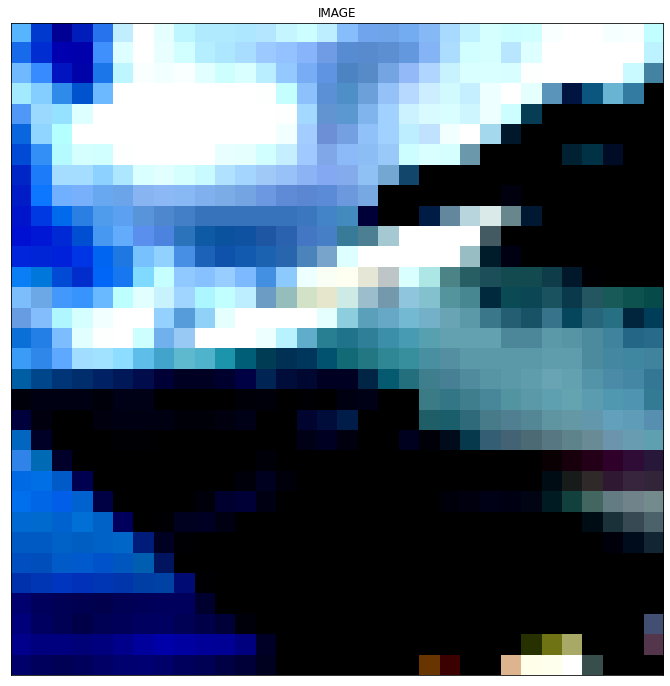

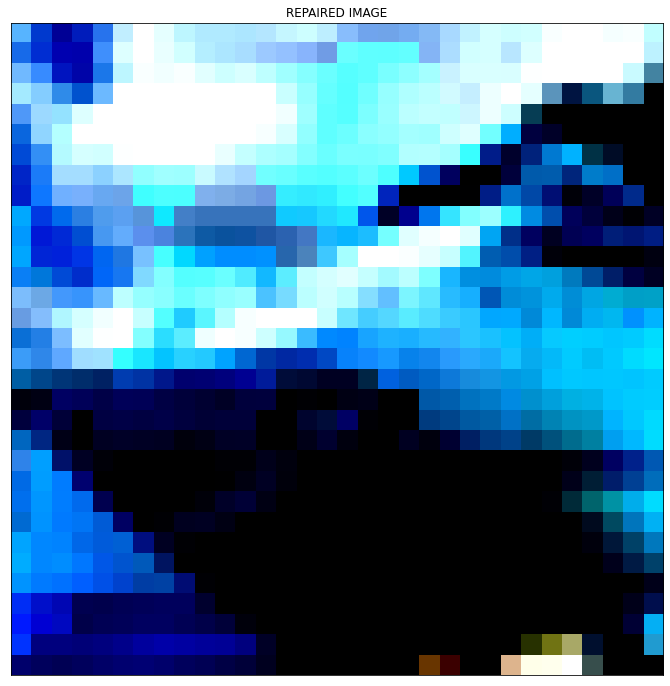

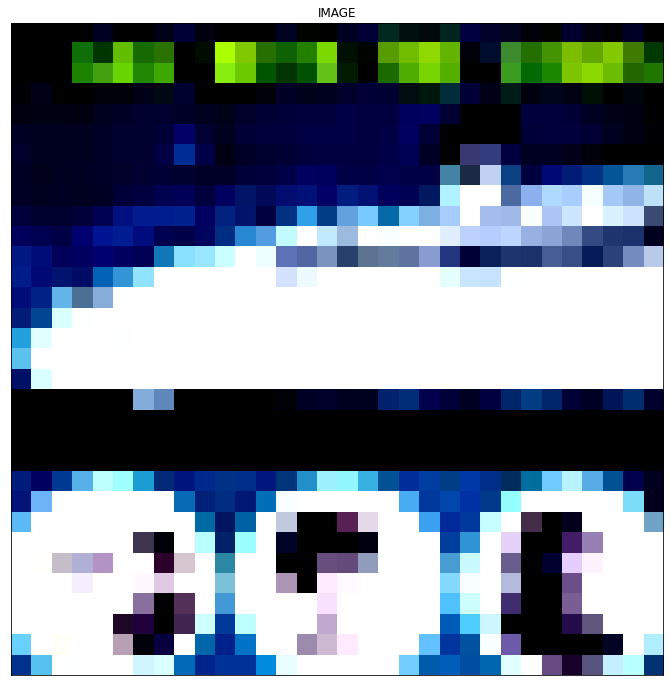

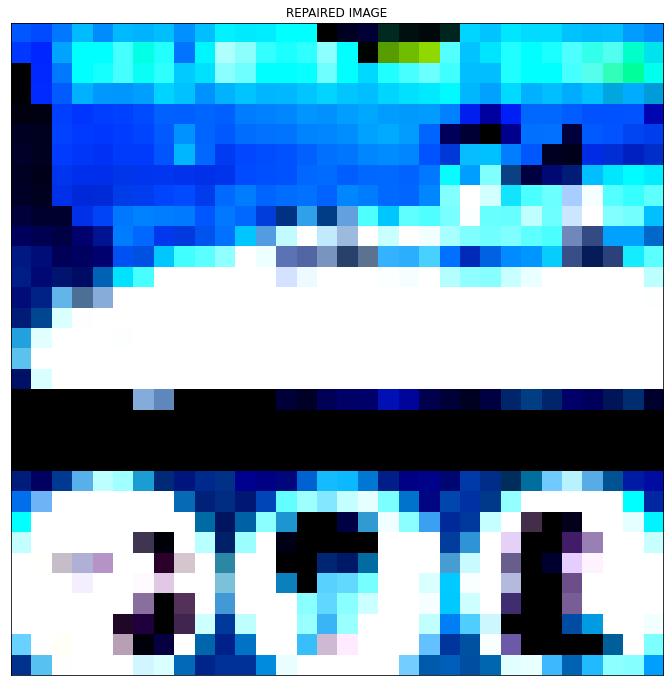

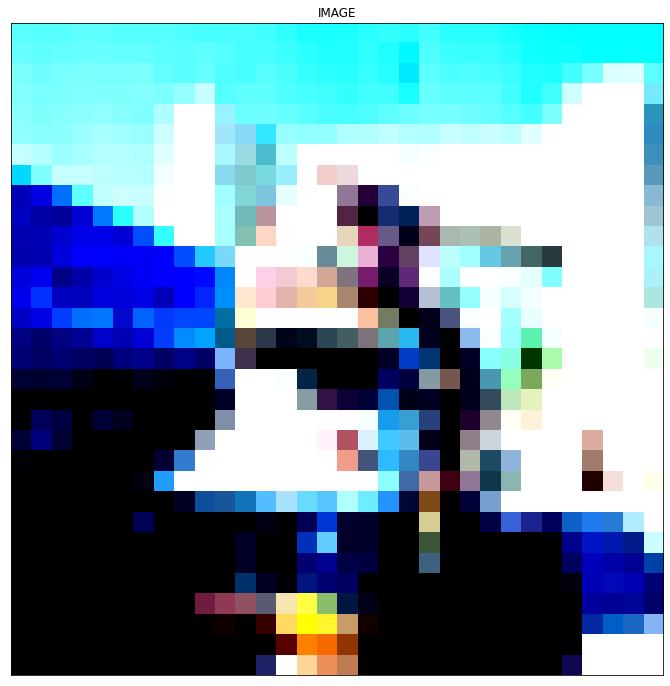

...

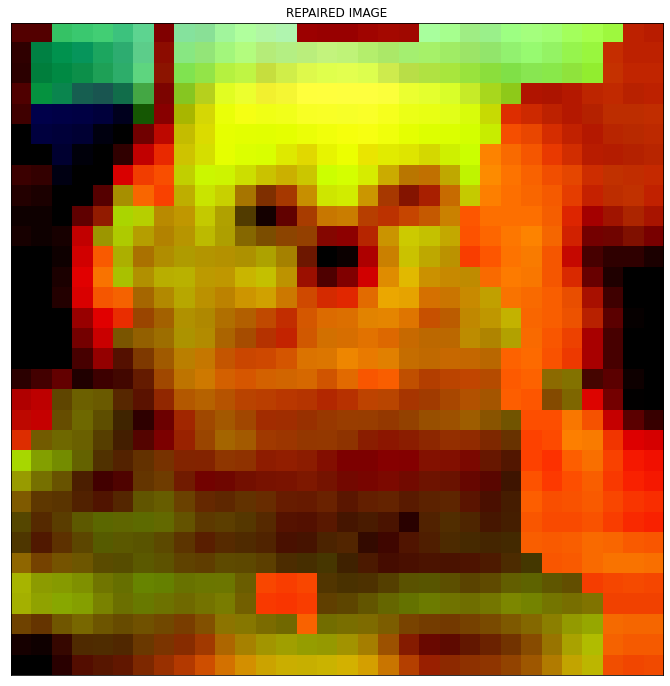

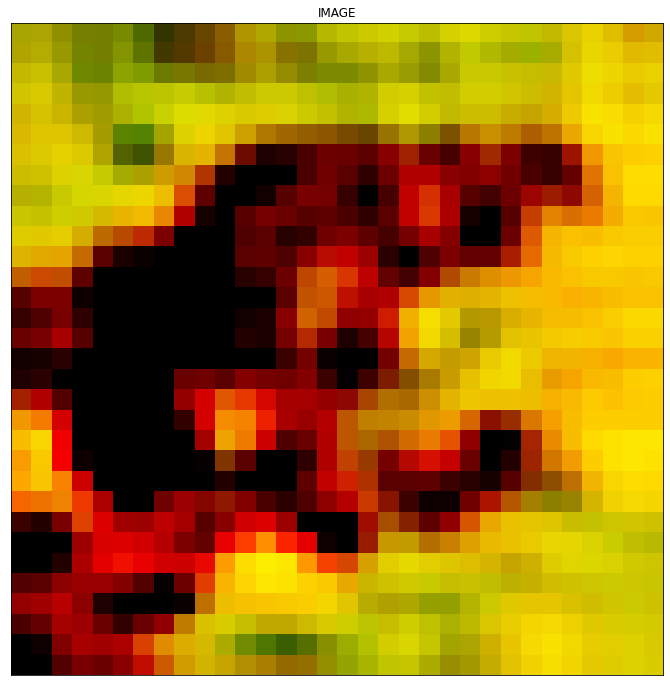

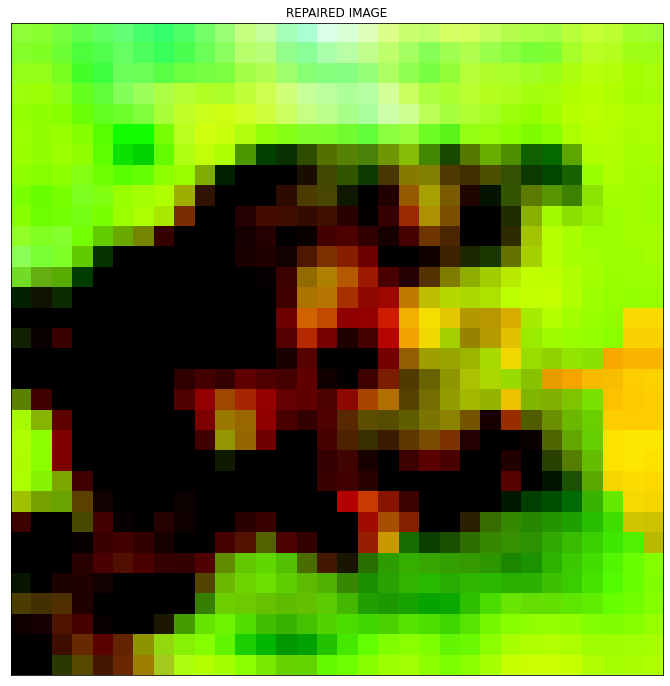

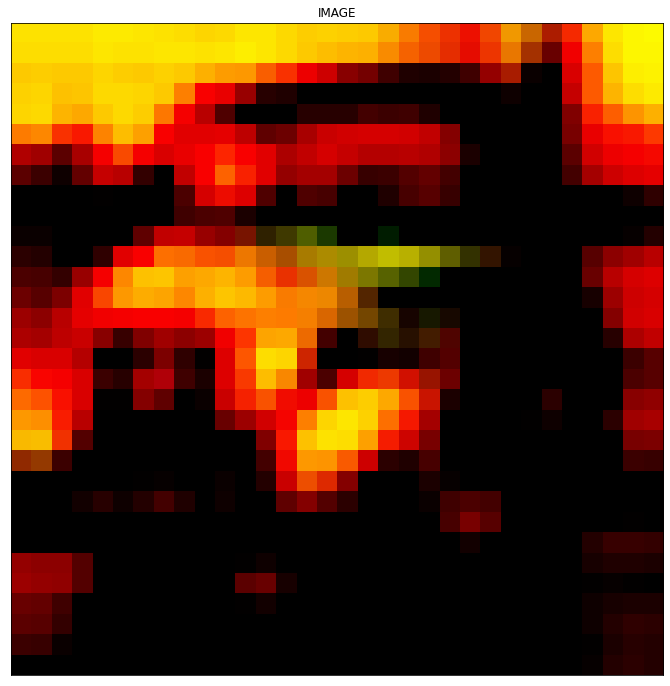

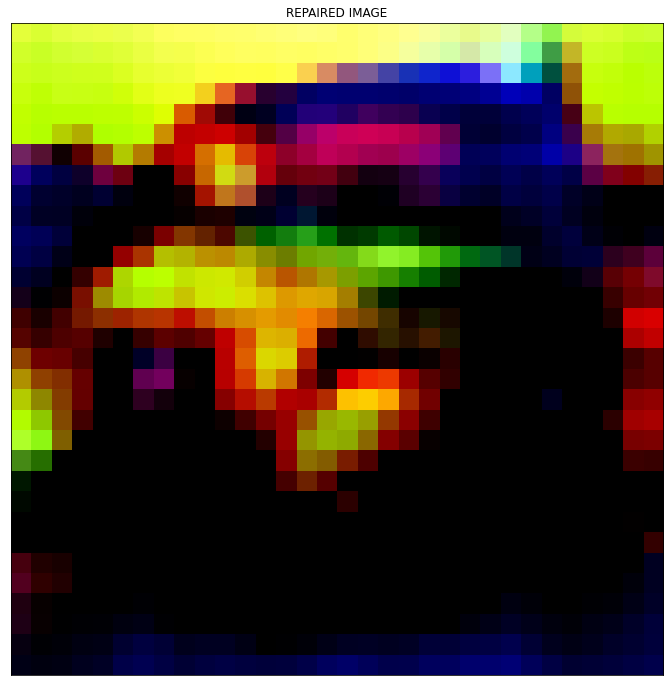

In [ ]:
#####
### BASED ON DIFF GRADCAM
neuron_ids =[]
inc_neuron_ids=[]
neuron_sig = []

for indx in range (0, len(invs_sel_neus)):
      neu_ids = []
      for indx1 in range (0, len(invs_sel_neus[indx])):
        neu_ids.append(-1)
        neu_ids.append(invs_sel_neus[indx][indx1])
      neuron_ids.append(neu_ids)
      inc_neuron_ids.append(invs_sel_neus[indx])

for indx in range (0, len(invs_sel_sig)):
      neuron_sig.append(invs_sel_sig[indx])

import copy
wrongsolve=0
x = copy.deepcopy(val_data)
cnt = 0
correct = 0

labels = actuals_val
ideals = val_labels



true_positives = 0
true_negatives = 0
false_positives = 0
false_negatives = 0
#ss=""

for inp_cnt in range(0,len(x)): # x is the list of images in the dataset used to extract the mis-classification pattern
    if ((inp_cnt % 100) == 0):
      PRINT = True
    image = x[inp_cnt]
    label = labels[inp_cnt]

    inp = image



    inc_layer = 'dense'  #layer name, get it from the model summary
    inc_suff = fingerprint_suffix_vals(inp, inc_layer)



    layer_vals = inc_suff[0]
    suff = []

    image_array = np.zeros((1,32,32,3),dtype=float)
    image_array[0]=image

    match = check_pattern_inter(layer_vals,suff,neuron_ids,neuron_sig,VAL,False)
    if (match >= 0):


        print("IDENTIFIED POISONED INPUT", inp_cnt,",", cnt, ",ACTUAL:", labels[inp_cnt], ",IDEAL:", ideals[inp_cnt])

        if (labels[inp_cnt] != 0):
          false_positives = false_positives + 1
        else:
          true_positives = true_positives + 1

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                print("BEFORE REPAIR",img.shape,image.shape)
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)
                #ss=""
                #for i in range(0,32):
                #  for j in range(0,32):
                #    ss=ss+str(image[i][j])+","


        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0] = image
        #print("BEF:", model.predict(image_array))
        label = (model.predict(image_array)).argmax(axis=1)

        vals=[]
        for ix in range(0,32):
            for iy in range(0,32):
                if (diff_pat[match][0][ix][iy] not in vals):
                        vals.append(diff_pat[match][0][ix][iy])

        vals.sort(reverse=True)
        top_10_percent = int((50/100)*(len(vals)))
        print(len(vals),top_10_percent, vals[top_10_percent])

        for ix in range(0,32):
            for iy in range(0,32):
                #if (diff_pat[match][0][ix][iy] >= vals[top_10_percent]):
                if (diff_pat[match][0][ix][iy] > 0.0):
                   image[ix][iy][0] -= avg_delta1[ix][iy][0]
                   image[ix][iy][1] -= avg_delta1[ix][iy][1]
                   image[ix][iy][2] -= avg_delta1[ix][iy][2]

        if (labels[inp_cnt] == 0 and (labels[inp_cnt] != ideals[inp_cnt]) and PRINT == True):
                PRINT = False
                print("AFTER REPAIR")
                subplot_args = { 'nrows': 1, 'ncols': 1, 'figsize': (12, 12),'subplot_kw': {'xticks': [], 'yticks': []} }
                f, ax = plt.subplots(**subplot_args)
                ax.set_title('REPAIRED IMAGE')
                norm_img = np.zeros((32,32,3),dtype=float)
                for ix in range(0,32):
                  for iy in range(0,32):
                    for iz in range(0,3):
                      norm_img[ix][iy][iz] = ((image[ix][iy][iz]))
                img1 = norm_img.reshape(32,32,3)
                ax.imshow(img1)

        image_array = np.zeros((1,32,32,3),dtype=float)
        image_array[0]=image
        #print("AFT:", model.predict(image_array))
        new_label = (model.predict(image_array)).argmax(axis=1)
        if (labels[inp_cnt] == ideals[inp_cnt] and new_label != ideals[inp_cnt]):
          wrongsolve=wrongsolve+1
        print("OLD LABEL:", label, ",REPAIRED LABEL:", new_label, ",CORRECT LABEL:", ideals[inp_cnt])
        if ((ideals[inp_cnt] != labels[inp_cnt]) and (ideals[inp_cnt] == new_label)):
            correct = correct + 1
        cnt = cnt + 1

    else:
      if (labels[inp_cnt] != 0):
          true_negatives = true_negatives + 1
      else:
          false_negatives = false_negatives + 1

print('TOTAL IDENTIFIED AS POISONED:',cnt)

print('TP:', true_positives, ',FP:', false_positives, ",TN:", true_negatives, ",FN:", false_negatives)
PREC = ((true_positives)/ (true_positives + false_positives))
RECALL = ((true_positives)/ (true_positives + false_negatives))
print("PRECISION:" , PREC * 100.0, ",RECALL:", RECALL * 100.0)

print("INPUT REPAIR, DIFF GRADCAM > 0, INCREASE ALL 3 DIMENSIONS based on exec of gen data USING avg corr per label")
print('CORRECT:', correct)
rep_rate = ((correct/true_positives) * 100.0)
print("REPAIR RATE:", rep_rate)
rep_rate = ((correct/(true_positives+ false_negatives)) * 100.0)
print("FULL REPAIR RATE:", rep_rate)

#print(ss)
#print("--- %s seconds ---" % (time.time() - start_time))


#start_time = time.time()

test_labels = (model.predict(x)).argmax(axis=1)
PASS = 0
FAIL = 0
for indx in range(0, len(x)):
  if (test_labels[indx] == ideals[indx]):
    PASS = PASS + 1
  else:
    FAIL = FAIL + 1
print("PASS:", PASS, ",FAIL:", FAIL,"," ,",TEST ACCURACY:", (PASS/(PASS+FAIL))*100.0)
#print("--- %s seconds ---" % (time.time() - start_time))
print(wrongsolve)